# Ookla EDA — Thailand Fixed Broadband & Mobile/Cellular (Combined)

Combines `ookla_eda.ipynb` (fixed) and `ookla_mobile_eda.ipynb` (mobile) into one notebook.
Shared setup (geo, province reference, GDP/tier context) runs once; Part 1 and Part 2 each run an independent full EDA pass over their own dataset.

**Note:** fixed-section file glob was patched to filter `*fixed_tiles*` explicitly — previously matched all parquet files (fixed + mobile) since both now live in `data/ookla/raw/`. Run All top-to-bottom to regenerate outputs.


### use dataset from this link

# 2023
https://ookla-open-data.s3.us-west-2.amazonaws.com/parquet/performance/type=fixed/year=2023/quarter=1/2023-01-01_performance_fixed_tiles.parquet
https://ookla-open-data.s3.us-west-2.amazonaws.com/parquet/performance/type=fixed/year=2023/quarter=2/2023-04-01_performance_fixed_tiles.parquet
https://ookla-open-data.s3.us-west-2.amazonaws.com/parquet/performance/type=fixed/year=2023/quarter=3/2023-07-01_performance_fixed_tiles.parquet
https://ookla-open-data.s3.us-west-2.amazonaws.com/parquet/performance/type=fixed/year=2023/quarter=4/2023-10-01_performance_fixed_tiles.parquet

# 2024
https://ookla-open-data.s3.us-west-2.amazonaws.com/parquet/performance/type=fixed/year=2024/quarter=1/2024-01-01_performance_fixed_tiles.parquet
https://ookla-open-data.s3.us-west-2.amazonaws.com/parquet/performance/type=fixed/year=2024/quarter=2/2024-04-01_performance_fixed_tiles.parquet
https://ookla-open-data.s3.us-west-2.amazonaws.com/parquet/performance/type=fixed/year=2024/quarter=3/2024-07-01_performance_fixed_tiles.parquet
https://ookla-open-data.s3.us-west-2.amazonaws.com/parquet/performance/type=fixed/year=2024/quarter=4/2024-10-01_performance_fixed_tiles.parquet

# 2025
https://ookla-open-data.s3.us-west-2.amazonaws.com/parquet/performance/type=fixed/year=2025/quarter=1/2025-01-01_performance_fixed_tiles.parquet
https://ookla-open-data.s3.us-west-2.amazonaws.com/parquet/performance/type=fixed/year=2025/quarter=2/2025-04-01_performance_fixed_tiles.parquet
https://ookla-open-data.s3.us-west-2.amazonaws.com/parquet/performance/type=fixed/year=2025/quarter=3/2025-07-01_performance_fixed_tiles.parquet
https://ookla-open-data.s3.us-west-2.amazonaws.com/parquet/performance/type=fixed/year=2025/quarter=4/2025-10-01_performance_fixed_tiles.parquet

### or just place this in cli

```bash
TARGET_DIR="../../data/ookla/raw"
mkdir -p "$TARGET_DIR"

for year in 2023 2024 2025; do
    # Quarter 1 (Jan), Quarter 2 (Apr), Quarter 3 (Jul), Quarter 4 (Oct)
    for q in 1 2 3 4; do
        if [ "$q" -eq 1 ]; then month="01"; fi
        if [ "$q" -eq 2 ]; then month="04"; fi
        if [ "$q" -eq 3 ]; then month="07"; fi
        if [ "$q" -eq 4 ]; then month="10"; fi
        
        URL="https://ookla-open-data.s3.us-west-2.amazonaws.com/parquet/performance/type=fixed/year=${year}/quarter=${q}/${year}-${month}-01_performance_fixed_tiles.parquet"
        echo "Downloading ${year} Q${q}..."
        curl -L "$URL" -o "$TARGET_DIR/${year}-Q${q}_performance_fixed_tiles.parquet"
    done
done
```

### alternative

```bash
aws s3 ls --no-sign-request s3://ookla-open-data/ --recursive
```

### mapping part 

using this as source ```https://github.com/teamookla/ookla-open-data/blob/master/tutorials/python/filter_by_centroids/centroids.ipynb```

In [1]:
# url = "https://raw.githubusercontent.com/apisit/thailand.json/master/thailand.json"

In [2]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

### load data

In [3]:
    THAILAND_GEOJSON = '../../data/geo/thailand_provinces.geojson'

    PROVINCE_COL = 'name' 

    perf_tiles_url = "../../data/ookla/raw/2023-Q1_performance_fixed_tiles.parquet"

    thailand_provinces_gdf = gpd.read_file(THAILAND_GEOJSON).to_crs(4326)

    # Capture the total bounds of Thailand's boundaries for the bounding box filter
    state_bounds = thailand_provinces_gdf.total_bounds

In [4]:
metric_name = 'avg_d_kbps'

In [5]:
bbox_filters = [('tile_y', '<=', state_bounds[3]), ('tile_y', '>=', state_bounds[1]),
                ('tile_x', '<=', state_bounds[2]), ('tile_x', '>=', state_bounds[0])]

In [6]:
tiles_df = pd.read_parquet(perf_tiles_url,
                           columns=['tile_x', 'tile_y', 'tests', metric_name],
                           filters=bbox_filters
                           )

### Create GeoDataFrame from Centroids

In [7]:
tiles_gdf = gpd.GeoDataFrame(
    tiles_df, 
    geometry=gpd.points_from_xy(tiles_df.tile_x, tiles_df.tile_y), 
    crs="EPSG:4326"
).drop(columns=["tile_x", "tile_y"])

# Drop any rows where we're missing values for the metric
tiles_gdf.dropna(subset=[metric_name], inplace=True)

In [8]:
thailand_tiles_gdf = gpd.sjoin(
    tiles_gdf, 
    thailand_provinces_gdf, 
    how="inner", 
    predicate="intersects"
)[[PROVINCE_COL, 'tests', metric_name]]

In [9]:
# 3. Aggregate the Metric per Province
province_stats = (
    thailand_tiles_gdf.groupby([PROVINCE_COL])
    .apply(
        lambda x: pd.Series(
            {"avg_metric_wt": np.average(x[metric_name], weights=x["tests"])}
        ),
        include_groups=False
    )
    .reset_index()
)

# Convert from kbps to Mbps for standard readability
province_stats['avg_metric_wt_mbps'] = province_stats['avg_metric_wt'] / 1000.0

# 4. Re-merge geometries for mapping
province_data = thailand_provinces_gdf[[PROVINCE_COL, 'geometry']].merge(province_stats, on=PROVINCE_COL)

In [10]:
# 5. Split into buckets and Plot the Map
labels = ["0 to 50", "50 to 100", "100 to 200", "200 to 300", "300+"]
province_data['group'] = pd.cut(
    province_data['avg_metric_wt_mbps'],
    bins=(0, 50, 100, 200, 300, 10000),
    right=False,
    labels=labels
)

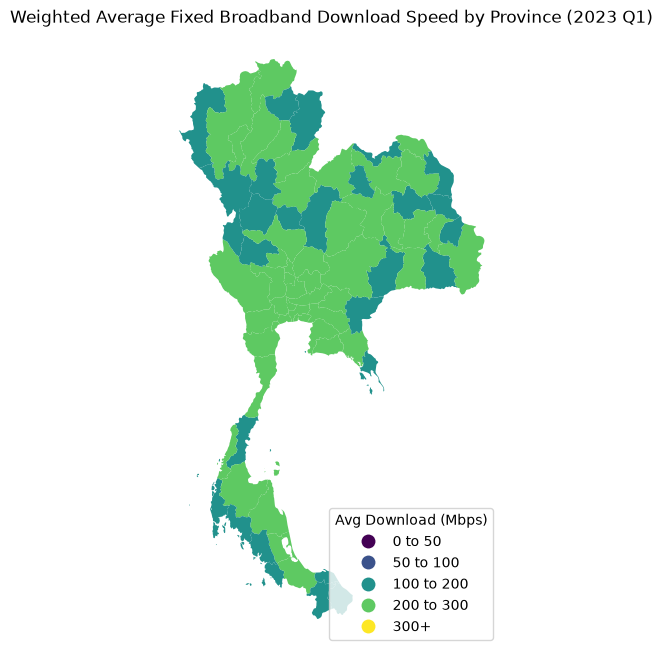

In [11]:
fig, ax = plt.subplots(1, figsize=(10, 8))
province_data.plot("group", ax=ax, legend=True, cmap="viridis", 
                   legend_kwds={'title': "Avg Download (Mbps)", 'loc': 'lower right'})

ax.set_title("Weighted Average Fixed Broadband Download Speed by Province (2023 Q1)")
ax.set_axis_off()

plt.savefig(f'../../outputs/ookla/08_province_speed_distribution.png', dpi=150, bbox_inches='tight')
plt.show()

In [12]:
import pandas as pd
import os

file_path = "../../data/ookla/raw"
files = sorted([f for f in os.listdir(file_path) if f.endswith('.parquet')])
print(f"{len(files)} files, reading first for inspection...")

# Read single file to inspect schema — avoid loading 3.7GB at once
df = pd.read_parquet(os.path.join(file_path, files[0]), engine='pyarrow')

23 files, reading first for inspection...


In [13]:
df.head() 

,quadkey,tile,tile_x,tile_y,avg_d_kbps,avg_u_kbps,avg_lat_ms,avg_lat_down_ms,avg_lat_up_ms,tests,devices
0,0022022300231020,"POLYGON((-178.4619140625 70.9847699889061, -17...",-178.4592,70.9839,87,204,578,3627.0,3312.0,1,1
1,0022133222312322,"POLYGON((-160.02685546875 70.6435894914449, -1...",-160.0241,70.6427,158237,9571,170,517.0,257.0,5,2
2,0022133222330012,"POLYGON((-160.037841796875 70.6399478155463, -...",-160.0351,70.6390,74693,28236,164,590.0,243.0,2,1
3,0022133222330023,"POLYGON((-160.043334960938 70.6363054807905, -...",-160.0406,70.6354,69368,7703,251,546.0,590.0,2,1
4,0022133222330030,"POLYGON((-160.037841796875 70.6381267305321, -...",-160.0351,70.6372,259,260,32,310.0,426.0,1,1


In [14]:
print(df.info())

<class 'pandas.DataFrame'>
RangeIndex: 6336489 entries, 0 to 6336488
Data columns (total 11 columns):
 #   Column           Dtype  
---  ------           -----  
 0   quadkey          str    
 1   tile             str    
 2   tile_x           float64
 3   tile_y           float64
 4   avg_d_kbps       int64  
 5   avg_u_kbps       int64  
 6   avg_lat_ms       int64  
 7   avg_lat_down_ms  float64
 8   avg_lat_up_ms    float64
 9   tests            int64  
 10  devices          int64  
dtypes: float64(4), int64(5), str(2)
memory usage: 1.7 GB
None


## Province Reference Data

In [15]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
import os

PROVINCE_REF_PATH = '../../data/reference/province_reference.csv'

prov_ref = pd.read_csv(PROVINCE_REF_PATH)
prov_ref['gdp_per_capita_usd_2021'] = (prov_ref['gdp_per_capita_thb_2021'] / 31.0).round(0)

print(f"Provinces loaded: {len(prov_ref)}")
print(f"Regions: {sorted(prov_ref['region'].unique())}")
print()
print(prov_ref[['province_en','region','pop_2024','density_per_km2','gdp_per_capita_thb_2021','internet_tier']].to_string(index=False))


Provinces loaded: 77
Regions: ['Bangkok & Vicinity', 'Central', 'Eastern', 'Northeastern', 'Northern', 'Southern', 'Western']

             province_en             region  pop_2024  density_per_km2  gdp_per_capita_thb_2021  internet_tier
      Bangkok Metropolis Bangkok & Vicinity   5456000             3488               1957179.52              1
           Amnat Charoen       Northeastern    372000              113                253897.82              4
               Ang Thong            Central    269000              283                468881.20              3
               Bueng Kan       Northeastern    419000              105                264149.56              4
                Buri Ram       Northeastern   1566000              155                265879.60              4
            Chachoengsao            Eastern    733000              142               1319396.70              2
                Chai Nat            Central    314000              131                447066.18 

### Population and GDP by Region — Summary

In [16]:
region_summary = (
    prov_ref.groupby('region')
    .agg(
        provinces=('province_en', 'count'),
        total_pop=('pop_2024', 'sum'),
        avg_density=('density_per_km2', 'mean'),
        avg_gdp_per_cap_thb=('gdp_per_capita_thb_2021', 'mean'),
        avg_gdp_per_cap_usd=('gdp_per_capita_usd_2021', 'mean'),
    )
    .sort_values('avg_gdp_per_cap_thb', ascending=False)
    .round(0)
)

region_summary['total_pop_M'] = (region_summary['total_pop'] / 1e6).round(2)
print(region_summary[['provinces','total_pop_M','avg_density','avg_gdp_per_cap_thb','avg_gdp_per_cap_usd']].to_string())


                    provinces  total_pop_M  avg_density  avg_gdp_per_cap_thb  avg_gdp_per_cap_usd
region                                                                                           
Eastern                     8         5.24        147.0            1220404.0              39368.0
Bangkok & Vicinity          6        10.91       1490.0            1093207.0              35265.0
Central                     6         2.97        212.0             744085.0              24002.0
Western                     6         3.81        163.0             523585.0              16890.0
Southern                   14         9.52        182.0             439166.0              14167.0
Northern                   17        11.89         72.0             356387.0              11496.0
Northeastern               20        21.62        129.0             280136.0               9037.0


### GDP per Capita vs Population Density — by Region

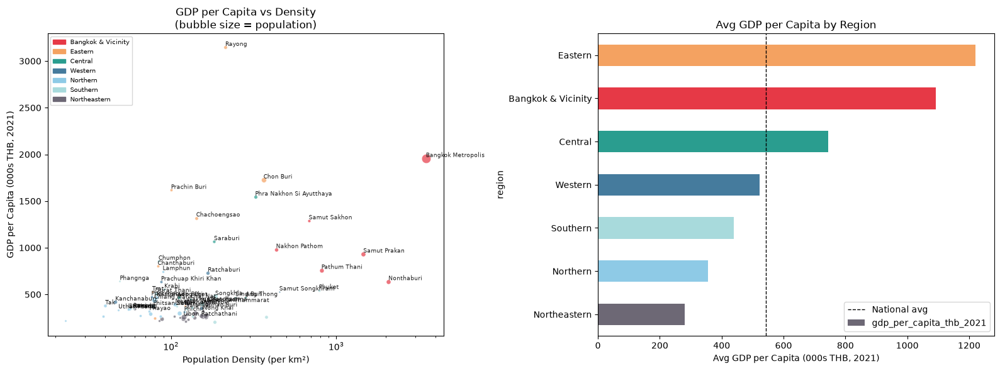

In [17]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

region_colors = {
    'Bangkok & Vicinity': '#e63946',
    'Eastern':           '#f4a261',
    'Central':           '#2a9d8f',
    'Western':           '#457b9d',
    'Northern':          '#8ecae6',
    'Southern':          '#a8dadc',
    'Northeastern':      '#6d6875',
}

for _, row in prov_ref.iterrows():
    c = region_colors.get(row['region'], 'gray')
    axes[0].scatter(row['density_per_km2'], row['gdp_per_capita_thb_2021'] / 1000,
                    color=c, alpha=0.7, s=row['pop_2024'] / 50000, edgecolors='white', linewidth=0.5)
    if row['gdp_per_capita_thb_2021'] > 300000 or row['province_en'] in ['Bangkok Metropolis','Phuket','Chiang Mai','Khon Kaen','Ubon Ratchathani','Nakhon Ratchasima']:
        axes[0].annotate(row['province_en'], (row['density_per_km2'], row['gdp_per_capita_thb_2021'] / 1000),
                         fontsize=6.5, ha='left', va='bottom', alpha=0.9)

axes[0].set_xlabel('Population Density (per km²)')
axes[0].set_ylabel('GDP per Capita (000s THB, 2021)')
axes[0].set_title('GDP per Capita vs Density\n(bubble size = population)')
axes[0].set_xscale('log')

# Bar chart: avg GDP per region
r_gdp = prov_ref.groupby('region')['gdp_per_capita_thb_2021'].mean().sort_values(ascending=True) / 1000
colors = [region_colors.get(r, 'gray') for r in r_gdp.index]
r_gdp.plot(kind='barh', ax=axes[1], color=colors)
axes[1].set_xlabel('Avg GDP per Capita (000s THB, 2021)')
axes[1].set_title('Avg GDP per Capita by Region')
axes[1].axvline(prov_ref['gdp_per_capita_thb_2021'].mean() / 1000, color='black', linestyle='--', linewidth=1, label='National avg')
axes[1].legend()

patches = [mpatches.Patch(color=v, label=k) for k, v in region_colors.items()]
axes[0].legend(handles=patches, fontsize=7, loc='upper left')

plt.tight_layout()

plt.savefig(f'../../outputs/ookla/09_gdp_vs_density.png', dpi=150, bbox_inches='tight')
plt.show()


### Internet Tier Distribution — Assumptions Map

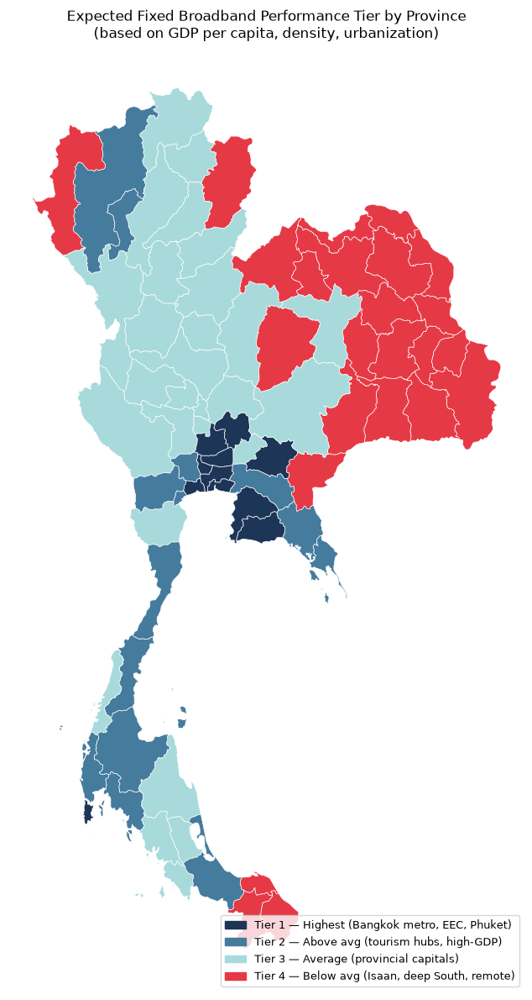

In [18]:
THAILAND_GEOJSON = '../../data/geo/thailand_provinces.geojson'
thailand_gdf = gpd.read_file(THAILAND_GEOJSON).to_crs(4326)

# Merge — GeoJSON uses 'name' column
tier_map = prov_ref[['province_en','internet_tier','gdp_per_capita_thb_2021','region']].copy()

# Manual name alignment between GeoJSON and our CSV
name_map = {
    'Phra Nakhon Si Ayutthaya': 'Phra Nakhon Si Ayutthaya',
}

geo_with_tier = thailand_gdf.merge(
    tier_map.rename(columns={'province_en': 'name'}),
    on='name', how='left'
)

missing = geo_with_tier[geo_with_tier['internet_tier'].isna()]['name'].tolist()
if missing:
    print("Unmatched provinces (need manual fix):", missing)

tier_colors = {1: '#1d3557', 2: '#457b9d', 3: '#a8dadc', 4: '#e63946'}
geo_with_tier['tier_color'] = geo_with_tier['internet_tier'].map(tier_colors)

fig, ax = plt.subplots(1, figsize=(10, 12))
geo_with_tier.plot(color=geo_with_tier['tier_color'].fillna('lightgray'), ax=ax, edgecolor='white', linewidth=0.5)

patches = [
    mpatches.Patch(color='#1d3557', label='Tier 1 — Highest (Bangkok metro, EEC, Phuket)'),
    mpatches.Patch(color='#457b9d', label='Tier 2 — Above avg (tourism hubs, high-GDP)'),
    mpatches.Patch(color='#a8dadc', label='Tier 3 — Average (provincial capitals)'),
    mpatches.Patch(color='#e63946', label='Tier 4 — Below avg (Isaan, deep South, remote)'),
]
ax.legend(handles=patches, loc='lower right', fontsize=9)
ax.set_title('Expected Fixed Broadband Performance Tier by Province\n(based on GDP per capita, density, urbanization)', fontsize=12)
ax.set_axis_off()
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/10_tier_speed_expected.png', dpi=150, bbox_inches='tight')
plt.show()


### Top & Bottom Provinces by GDP per Capita — with Internet Tier

In [19]:
top10 = prov_ref.nlargest(10, 'gdp_per_capita_thb_2021')[['province_en','region','pop_2024','gdp_per_capita_thb_2021','internet_tier']]
bot10 = prov_ref.nsmallest(10, 'gdp_per_capita_thb_2021')[['province_en','region','pop_2024','gdp_per_capita_thb_2021','internet_tier']]

print("=== TOP 10 by GDP per Capita ===")
print(top10.to_string(index=False))
print()
print("=== BOTTOM 10 by GDP per Capita ===")
print(bot10.to_string(index=False))


=== TOP 10 by GDP per Capita ===
             province_en             region  pop_2024  gdp_per_capita_thb_2021  internet_tier
                  Rayong            Eastern    782000               3147422.75              1
      Bangkok Metropolis Bangkok & Vicinity   5456000               1957179.52              1
               Chon Buri            Eastern   1636000               1726754.27              1
            Prachin Buri            Eastern    501000               1616351.17              1
Phra Nakhon Si Ayutthaya            Central    823000               1544117.75              1
            Chachoengsao            Eastern    733000               1319396.70              2
            Samut Sakhon Bangkok & Vicinity    591000               1289926.65              1
                Saraburi            Central    639000               1066220.56              1
           Nakhon Pathom Bangkok & Vicinity    926000                981679.12              2
            Samut Prakan Ba

---
# Part 1 — Fixed Broadband


## Full EDA — Ookla Fixed Broadband, Thailand (2023 Q1 – 2025 Q4)

### 1. Load & Aggregate All Quarters

In [20]:
import glob, os, warnings
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.ticker as mticker
from scipy import stats
warnings.filterwarnings('ignore')

DATASET_DIR = '../../data/ookla/raw'
GEOJSON     = '../../data/geo/thailand_provinces.geojson'
PROV_REF    = '../../data/reference/province_reference.csv'

# Ookla S3 filename convention: {YEAR}-{MM}-01_performance_fixed_tiles.parquet
# Q1=January(01), Q2=April(04), Q3=July(07), Q4=October(10)
Q_TO_MONTH = {1: 1, 2: 4, 3: 7, 4: 10}

thailand_gdf = gpd.read_file(GEOJSON).to_crs(4326)
state_bounds = thailand_gdf.total_bounds
bbox_filters = [
    ('tile_y', '<=', state_bounds[3]), ('tile_y', '>=', state_bounds[1]),
    ('tile_x', '<=', state_bounds[2]), ('tile_x', '>=', state_bounds[0]),
]

COLS = ['tile_x','tile_y','tests','devices','avg_d_kbps','avg_u_kbps','avg_lat_ms']

records = []
files = sorted(glob.glob(os.path.join(DATASET_DIR, '*fixed_tiles*.parquet')))

for fp in files:
    fname   = os.path.basename(fp)
    year    = int(fname[:4])
    quarter = int(fname[6])
    month   = Q_TO_MONTH[quarter]
    # period_start mirrors Ookla's original filename date (first day of the quarter)
    period_start = pd.Timestamp(year=year, month=month, day=1)
    label   = f"{year}-Q{quarter}"

    raw = pd.read_parquet(fp, columns=COLS, filters=bbox_filters)

    tiles_gdf = gpd.GeoDataFrame(
        raw,
        geometry=gpd.points_from_xy(raw.tile_x, raw.tile_y),
        crs='EPSG:4326'
    ).drop(columns=['tile_x','tile_y'])

    joined = gpd.sjoin(tiles_gdf, thailand_gdf[['name','geometry']], how='inner', predicate='intersects')

    agg = (
        joined.groupby('name')
        .apply(lambda g: pd.Series({
            'avg_d_kbps_wt': np.average(g['avg_d_kbps'], weights=g['tests']),
            'avg_u_kbps_wt': np.average(g['avg_u_kbps'], weights=g['tests']),
            'avg_lat_ms_wt': np.average(g['avg_lat_ms'], weights=g['tests']),
            'total_tests'  : g['tests'].sum(),
            'total_devices': g['devices'].sum(),
            'n_tiles'      : len(g),
        }), include_groups=False)
        .reset_index()
    )
    agg['year']         = year
    agg['quarter']      = quarter
    agg['month']        = month
    agg['period_start'] = period_start   # datetime: 2023-01-01, 2023-04-01, ...
    agg['label']        = label
    records.append(agg)
    print(f"  {label} ({period_start.date()}): {len(raw):>8,} raw tiles → {len(agg)} provinces")

master = pd.concat(records, ignore_index=True)
master['avg_d_mbps'] = master['avg_d_kbps_wt'] / 1000
master['avg_u_mbps'] = master['avg_u_kbps_wt'] / 1000
master.drop(columns=['avg_d_kbps_wt','avg_u_kbps_wt'], inplace=True)

# Merge province reference
prov_ref = pd.read_csv(PROV_REF)
prov_ref['gdp_per_capita_usd'] = (prov_ref['gdp_per_capita_thb_2021'] / 31).round(0)
master = master.merge(prov_ref.rename(columns={'province_en':'name'}), on='name', how='left')

print(f"\nMaster shape: {master.shape}")
print(f"Date range: {master['period_start'].min().date()} → {master['period_start'].max().date()}")
print(f"Quarters:   {sorted(master['label'].unique())}")
print(f"Provinces:  {master['name'].nunique()}")
print(f"\nperiod_start unique values (matches Ookla filename dates):")
for d in sorted(master['period_start'].unique()):
    print(f"  {pd.Timestamp(d).date()}")


  2023-Q1 (2023-01-01):  138,496 raw tiles → 77 provinces


  2023-Q2 (2023-04-01):  137,315 raw tiles → 77 provinces


  2023-Q3 (2023-07-01):  139,321 raw tiles → 77 provinces


  2023-Q4 (2023-10-01):  145,213 raw tiles → 77 provinces


  2024-Q1 (2024-01-01):  146,778 raw tiles → 77 provinces


  2024-Q2 (2024-04-01):  146,447 raw tiles → 77 provinces


  2024-Q3 (2024-07-01):  141,452 raw tiles → 77 provinces


  2024-Q4 (2024-10-01):  141,271 raw tiles → 77 provinces


  2025-Q1 (2025-01-01):  135,567 raw tiles → 77 provinces


  2025-Q2 (2025-04-01):  148,574 raw tiles → 77 provinces


  2025-Q4 (2025-10-01):  147,667 raw tiles → 77 provinces

Master shape: (847, 22)
Date range: 2023-01-01 → 2025-10-01
Quarters:   ['2023-Q1', '2023-Q2', '2023-Q3', '2023-Q4', '2024-Q1', '2024-Q2', '2024-Q3', '2024-Q4', '2025-Q1', '2025-Q2', '2025-Q4']
Provinces:  77

period_start unique values (matches Ookla filename dates):
  2023-01-01
  2023-04-01
  2023-07-01
  2023-10-01
  2024-01-01
  2024-04-01
  2024-07-01
  2024-10-01
  2025-01-01
  2025-04-01
  2025-10-01


In [21]:
# Quality flag per province × quarter
# Ookla: >= 100 tests AND >= 5 tiles → sufficient spatial + sample coverage
master['is_reliable'] = (
    (master['total_tests'] >= 100) &
    (master['n_tiles'] >= 5)
)
reliable_count = master.groupby('label')['is_reliable'].sum()
print('Reliable province-quarters per label:')
print(reliable_count.to_string())
print(f"\nOverall reliable: {master['is_reliable'].sum()} / {len(master)} ({master['is_reliable'].mean():.1%})")

Reliable province-quarters per label:
label
2023-Q1    77
2023-Q2    77
2023-Q3    77
2023-Q4    77
2024-Q1    77
2024-Q2    77
2024-Q3    77
2024-Q4    77
2025-Q1    77
2025-Q2    77
2025-Q4    77

Overall reliable: 847 / 847 (100.0%)


### 2. Data Quality — Coverage per Province

In [22]:
# Expected: 77 provinces × 11 quarters = 847 rows
expected = 77 * master['label'].nunique()
print(f"Expected rows: {expected} | Actual: {len(master)} | Missing: {expected - len(master)}")

# Provinces with zero coverage in any quarter
all_provinces = set(thailand_gdf['name'])
all_labels    = set(master['label'].unique())
coverage_pivot = master.pivot_table(index='name', columns='label', values='total_tests', aggfunc='sum')

missing_cells = [(p, q) for p in all_provinces for q in all_labels
                 if p not in coverage_pivot.index or pd.isna(coverage_pivot.loc[p, q])]
if missing_cells:
    print(f"\nMissing province-quarter combos ({len(missing_cells)}):")
    for p, q in missing_cells:
        print(f"  {p} — {q}")
else:
    print("\nAll 77 provinces covered in every quarter.")

# Low-test provinces (< 100 tests in any quarter)
low_test = master[master['total_tests'] < 100][['name','label','total_tests','n_tiles']].sort_values('total_tests')
if len(low_test):
    print(f"\nLow-test quarters (< 100 tests) — {len(low_test)} cases:")
    print(low_test.to_string(index=False))
else:
    print("\nNo quarters with < 100 tests.")


Expected rows: 847 | Actual: 847 | Missing: 0

All 77 provinces covered in every quarter.

No quarters with < 100 tests.


In [23]:
# Drop unreliable province-quarters before any stats/plots use master downstream
master = master[master['is_reliable']].copy()
print(f"Filtered to reliable province-quarters: {len(master)} rows kept")

Filtered to reliable province-quarters: 847 rows kept


### 3. Speed Distribution — All Provinces, All Quarters

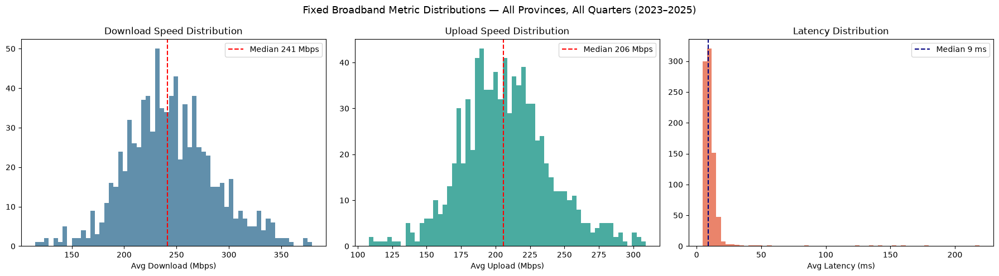

       avg_d_mbps  avg_u_mbps  avg_lat_ms_wt  total_tests
count      847.00      847.00         847.00       847.00
mean       244.19      207.19          11.28     22371.42
std         42.01       32.06          14.73     56482.32
min        114.85      107.93           4.48      1786.00
25%        216.81      186.73           6.88      5199.00
50%        241.29      205.69           9.16      9427.00
75%        269.36      226.07          11.85     19160.00
max        379.43      309.10         219.10    526178.00


In [24]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].hist(master['avg_d_mbps'].dropna(), bins=60, color='#457b9d', edgecolor='none', alpha=0.85)
axes[0].axvline(master['avg_d_mbps'].median(), color='red', ls='--', lw=1.5, label=f'Median {master["avg_d_mbps"].median():.0f} Mbps')
axes[0].set_xlabel('Avg Download (Mbps)'); axes[0].set_title('Download Speed Distribution'); axes[0].legend()

axes[1].hist(master['avg_u_mbps'].dropna(), bins=60, color='#2a9d8f', edgecolor='none', alpha=0.85)
axes[1].axvline(master['avg_u_mbps'].median(), color='red', ls='--', lw=1.5, label=f'Median {master["avg_u_mbps"].median():.0f} Mbps')
axes[1].set_xlabel('Avg Upload (Mbps)'); axes[1].set_title('Upload Speed Distribution'); axes[1].legend()

axes[2].hist(master['avg_lat_ms_wt'].dropna(), bins=60, color='#e76f51', edgecolor='none', alpha=0.85)
axes[2].axvline(master['avg_lat_ms_wt'].median(), color='navy', ls='--', lw=1.5, label=f'Median {master["avg_lat_ms_wt"].median():.0f} ms')
axes[2].set_xlabel('Avg Latency (ms)'); axes[2].set_title('Latency Distribution'); axes[2].legend()

plt.suptitle('Fixed Broadband Metric Distributions — All Provinces, All Quarters (2023–2025)', fontsize=13)
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/11_upload_speed_dist.png', dpi=150, bbox_inches='tight')
plt.show()

print(master[['avg_d_mbps','avg_u_mbps','avg_lat_ms_wt','total_tests']].describe().round(2))


### 4. Province Ranking — Mean Download Speed (All Quarters)

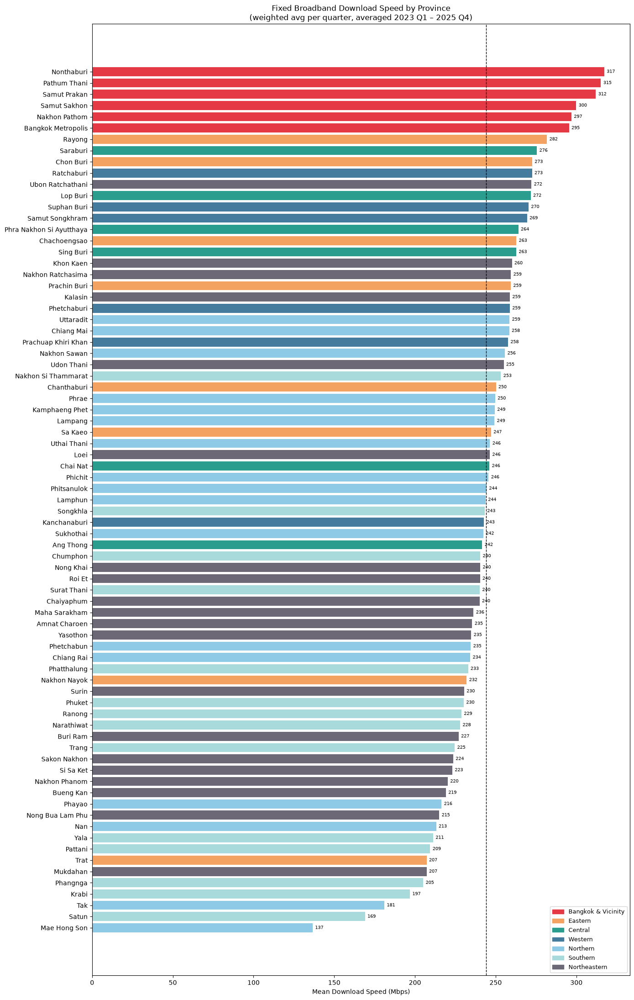

In [25]:
region_colors = {
    'Bangkok & Vicinity': '#e63946',
    'Eastern':            '#f4a261',
    'Central':            '#2a9d8f',
    'Western':            '#457b9d',
    'Northern':           '#8ecae6',
    'Southern':           '#a8dadc',
    'Northeastern':       '#6d6875',
}

prov_mean = (
    master.groupby(['name','region'])
    .agg(
        mean_dl=('avg_d_mbps','mean'),
        mean_ul=('avg_u_mbps','mean'),
        mean_lat=('avg_lat_ms_wt','mean'),
        mean_tests=('total_tests','mean'),
    )
    .reset_index()
    .sort_values('mean_dl', ascending=True)
)

fig, ax = plt.subplots(figsize=(14, 22))
colors = [region_colors.get(r,'gray') for r in prov_mean['region']]
bars = ax.barh(prov_mean['name'], prov_mean['mean_dl'], color=colors, edgecolor='none')

# Add value labels
for bar, val in zip(bars, prov_mean['mean_dl']):
    ax.text(bar.get_width() + 1.5, bar.get_y() + bar.get_height()/2,
            f'{val:.0f}', va='center', fontsize=7)

ax.axvline(prov_mean['mean_dl'].mean(), color='black', ls='--', lw=1, label=f'National mean {prov_mean["mean_dl"].mean():.0f} Mbps')
patches = [mpatches.Patch(color=v, label=k) for k, v in region_colors.items()]
ax.legend(handles=patches, loc='lower right', fontsize=9)
ax.set_xlabel('Mean Download Speed (Mbps)')
ax.set_title('Fixed Broadband Download Speed by Province\n(weighted avg per quarter, averaged 2023 Q1 – 2025 Q4)', fontsize=12)
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/12_province_ranking_mean.png', dpi=150, bbox_inches='tight')
plt.show()


### 4.5 Province Ranking — Median Download Speed (All Quarters)

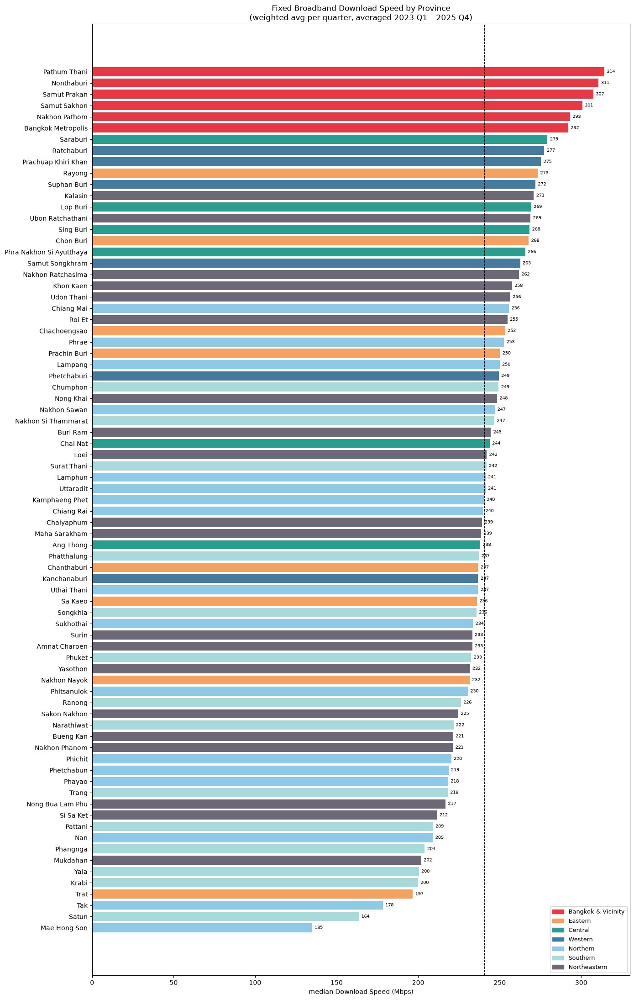

In [26]:
region_colors = {
    'Bangkok & Vicinity': '#e63946',
    'Eastern':            '#f4a261',
    'Central':            '#2a9d8f',
    'Western':            '#457b9d',
    'Northern':           '#8ecae6',
    'Southern':           '#a8dadc',
    'Northeastern':       '#6d6875',
}

prov_median = (
    master.groupby(['name','region'])
    .agg(
        median_dl=('avg_d_mbps','median'),
        median_ul=('avg_u_mbps','median'),
        median_lat=('avg_lat_ms_wt','median'),
        median_tests=('total_tests','median'),
    )
    .reset_index()
    .sort_values('median_dl', ascending=True)
)

fig, ax = plt.subplots(figsize=(14, 22))
colors = [region_colors.get(r,'gray') for r in prov_median['region']]
bars = ax.barh(prov_median['name'], prov_median['median_dl'], color=colors, edgecolor='none')

# Add value labels
for bar, val in zip(bars, prov_median['median_dl']):
    ax.text(bar.get_width() + 1.5, bar.get_y() + bar.get_height()/2,
            f'{val:.0f}', va='center', fontsize=7)

ax.axvline(prov_median['median_dl'].median(), color='black', ls='--', lw=1, label=f'National median {prov_median["median_dl"].median():.0f} Mbps')
patches = [mpatches.Patch(color=v, label=k) for k, v in region_colors.items()]
ax.legend(handles=patches, loc='lower right', fontsize=9)
ax.set_xlabel('median Download Speed (Mbps)')
ax.set_title('Fixed Broadband Download Speed by Province\n(weighted avg per quarter, averaged 2023 Q1 – 2025 Q4)', fontsize=12)
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/12_province_ranking_median.png', dpi=150, bbox_inches='tight')
plt.show()


### 5. Time Series — Download Speed Heatmap (Province × Quarter)

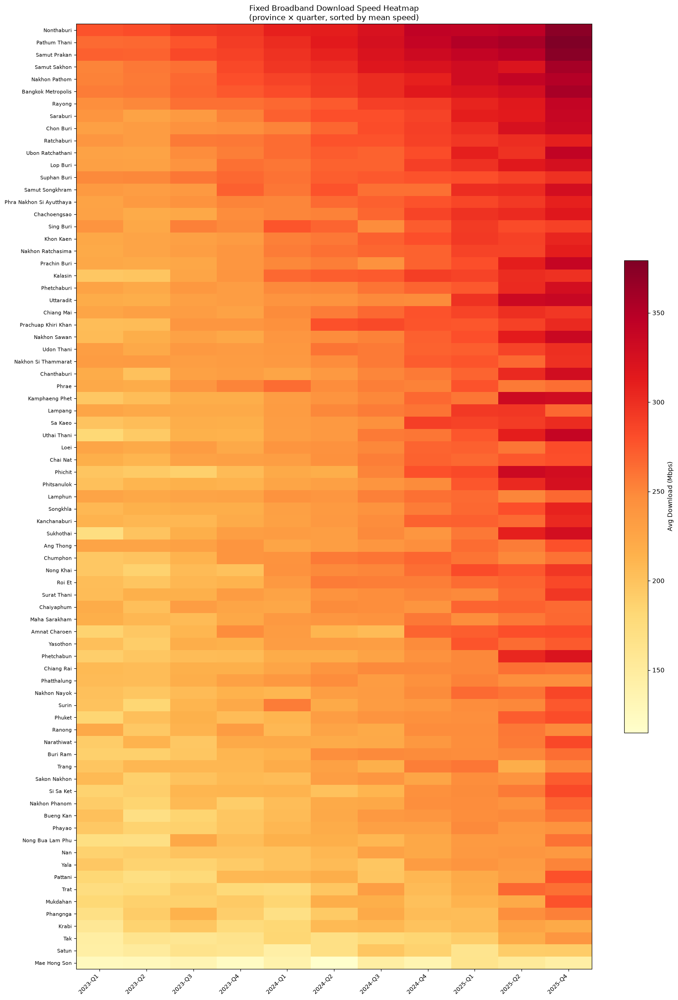

In [27]:
pivot_dl = master.pivot_table(index='name', columns='period_start', values='avg_d_mbps')
# Format column labels as quarter strings for display
pivot_dl.columns = [pd.Timestamp(c).strftime('%Y-Q') + str((pd.Timestamp(c).month-1)//3+1) for c in pivot_dl.columns]
# Sort by mean download speed
pivot_dl = pivot_dl.loc[prov_mean.sort_values('mean_dl', ascending=False)['name']]

fig, ax = plt.subplots(figsize=(16, 22))
im = ax.imshow(pivot_dl.values, aspect='auto', cmap='YlOrRd', interpolation='nearest')
plt.colorbar(im, ax=ax, label='Avg Download (Mbps)', shrink=0.5)

ax.set_xticks(range(len(pivot_dl.columns)))
ax.set_xticklabels(pivot_dl.columns, rotation=45, ha='right', fontsize=9)
ax.set_yticks(range(len(pivot_dl.index)))
ax.set_yticklabels(pivot_dl.index, fontsize=8)
ax.set_title('Fixed Broadband Download Speed Heatmap\n(province × quarter, sorted by mean speed)', fontsize=12)
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/13_heatmap_quarterly.png', dpi=150, bbox_inches='tight')
plt.show()


### 6. Regional Comparison — Download, Upload, Latency

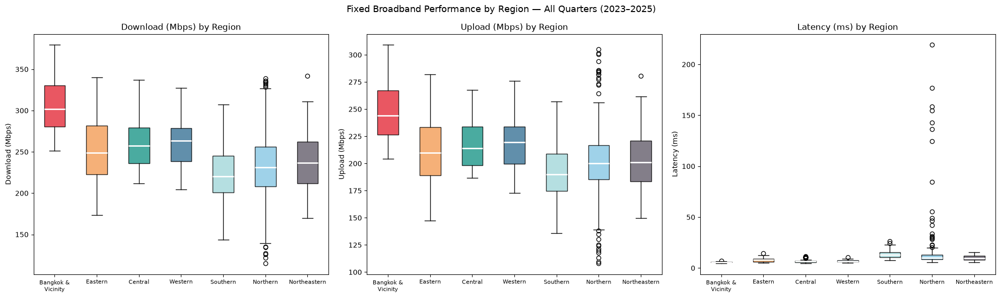

In [28]:
region_order = ['Bangkok & Vicinity','Eastern','Central','Western','Southern','Northern','Northeastern']
region_data  = [master[master['region']==r]['avg_d_mbps'].dropna().values for r in region_order]

fig, axes = plt.subplots(1, 3, figsize=(20, 6))

for ax, metric, label, color_key in [
    (axes[0], 'avg_d_mbps',   'Download (Mbps)', '#457b9d'),
    (axes[1], 'avg_u_mbps',   'Upload (Mbps)',   '#2a9d8f'),
    (axes[2], 'avg_lat_ms_wt','Latency (ms)',    '#e76f51'),
]:
    data = [master[master['region']==r][metric].dropna().values for r in region_order]
    bp = ax.boxplot(data, patch_artist=True, notch=False,
                    medianprops=dict(color='white', linewidth=2))
    for patch, region in zip(bp['boxes'], region_order):
        patch.set_facecolor(region_colors[region])
        patch.set_alpha(0.85)
    ax.set_xticklabels([r.replace(' & ',' &\n') for r in region_order], fontsize=8)
    ax.set_ylabel(label)
    ax.set_title(f'{label} by Region')

plt.suptitle('Fixed Broadband Performance by Region — All Quarters (2023–2025)', fontsize=13)
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/14_regional_boxplot.png', dpi=150, bbox_inches='tight')
plt.show()


### 7. Download Speed Trend — Top, Bottom & Interesting Provinces

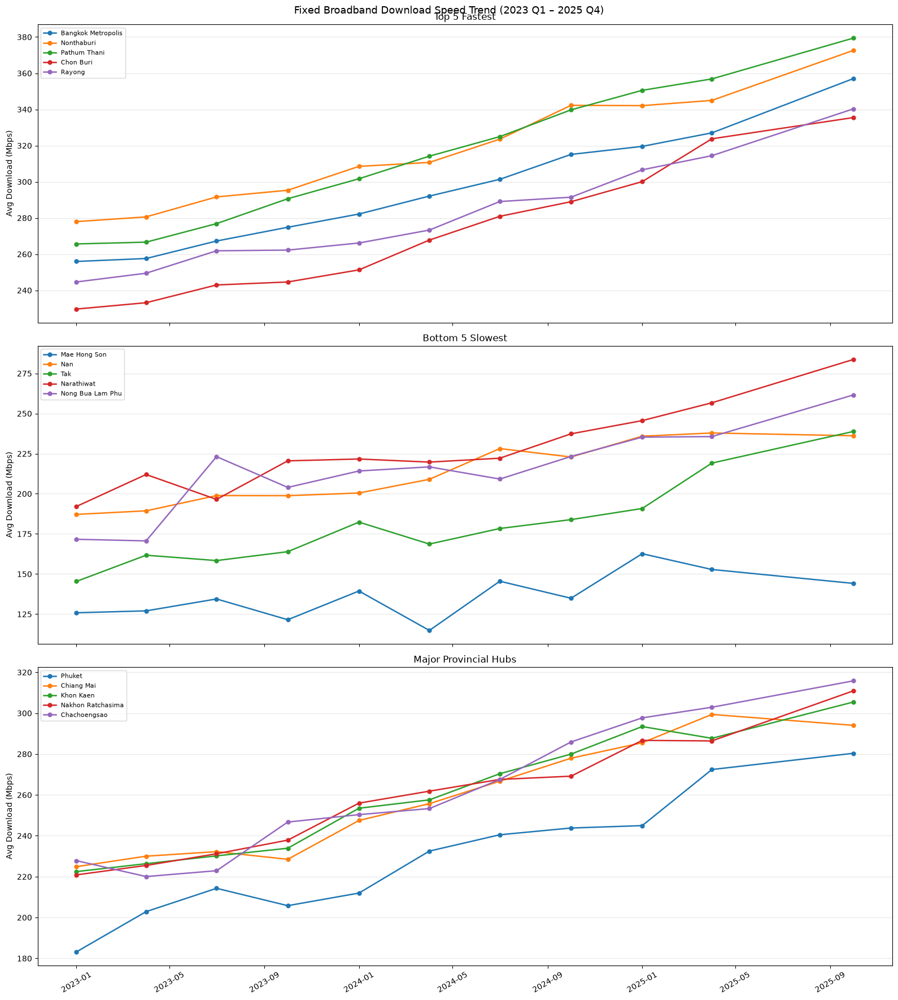

In [29]:
HIGHLIGHT = [
    # Top performers
    'Bangkok Metropolis','Nonthaburi','Pathum Thani','Chon Buri','Rayong',
    # Bottom performers  
    'Mae Hong Son','Nan','Tak','Narathiwat','Nong Bua Lam Phu',
    # Interesting (high GDP mismatch or border)
    'Phuket','Chiang Mai','Khon Kaen','Nakhon Ratchasima',
]

quarter_order = sorted(master['label'].unique())
fig, axes = plt.subplots(3, 1, figsize=(16, 18), sharex=True)

groups = [
    ('Top 5 Fastest', ['Bangkok Metropolis','Nonthaburi','Pathum Thani','Chon Buri','Rayong'], '#e63946'),
    ('Bottom 5 Slowest', ['Mae Hong Son','Nan','Tak','Narathiwat','Nong Bua Lam Phu'], '#6d6875'),
    ('Major Provincial Hubs', ['Phuket','Chiang Mai','Khon Kaen','Nakhon Ratchasima','Chachoengsao'], '#f4a261'),
]

for ax, (title, provinces, base_color) in zip(axes, groups):
    for i, prov in enumerate(provinces):
        df_p = master[master['name']==prov].sort_values('label')
        if df_p.empty: continue
        ax.plot(df_p['period_start'], df_p['avg_d_mbps'], marker='o', markersize=5,
                label=prov, linewidth=1.8)
    ax.set_ylabel('Avg Download (Mbps)')
    ax.set_title(title)
    ax.legend(fontsize=8, loc='upper left')
    ax.grid(axis='y', alpha=0.3)
    ax.tick_params(axis='x', rotation=30)

plt.suptitle('Fixed Broadband Download Speed Trend (2023 Q1 – 2025 Q4)', fontsize=13)
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/15_time_series.png', dpi=150, bbox_inches='tight')
plt.show()


### 8. GDP per Capita vs Download Speed — Does Money = Speed?

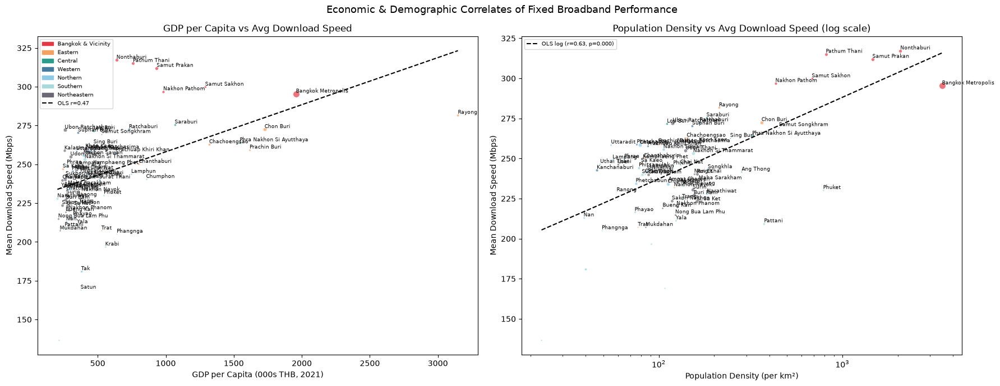

Pearson r (GDP vs download):     0.475  p=0.0000
Pearson r (log density vs download): 0.629  p=0.0000


In [30]:
corr_df = prov_mean.merge(
    prov_ref[['province_en','gdp_per_capita_thb_2021','internet_tier','pop_2024','density_per_km2']].rename(columns={'province_en':'name'}),
    on='name', how='left'
)

fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Scatter: GDP vs download
for _, row in corr_df.iterrows():
    c = region_colors.get(row['region'], 'gray')
    axes[0].scatter(row['gdp_per_capita_thb_2021']/1000, row['mean_dl'],
                    color=c, s=row['pop_2024']/80000, alpha=0.7, edgecolors='white', lw=0.5)
    # Label outliers
    if row['gdp_per_capita_thb_2021'] > 350000 or row['mean_dl'] > 200 or row['mean_dl'] < 60:
        axes[0].annotate(row['name'], (row['gdp_per_capita_thb_2021']/1000, row['mean_dl']),
                         fontsize=6.5, ha='left', va='bottom')

# OLS trendline
x = corr_df['gdp_per_capita_thb_2021'].dropna()/1000
y = corr_df.loc[x.index,'mean_dl']
slope, intercept, r, p, _ = stats.linregress(x, y)
xline = np.linspace(x.min(), x.max(), 100)
axes[0].plot(xline, slope*xline+intercept, 'k--', lw=1.5, label=f'OLS (r={r:.2f}, p={p:.3f})')
axes[0].set_xlabel('GDP per Capita (000s THB, 2021)')
axes[0].set_ylabel('Mean Download Speed (Mbps)')
axes[0].set_title('GDP per Capita vs Avg Download Speed')
patches = [mpatches.Patch(color=v, label=k) for k,v in region_colors.items()]
axes[0].legend(handles=patches+[plt.Line2D([0],[0],color='k',ls='--',label=f'OLS r={r:.2f}')], fontsize=7)

# Scatter: density vs download
for _, row in corr_df.iterrows():
    c = region_colors.get(row['region'],'gray')
    axes[1].scatter(row['density_per_km2'], row['mean_dl'],
                    color=c, s=row['pop_2024']/80000, alpha=0.7, edgecolors='white', lw=0.5)
    if row['density_per_km2'] > 500 or row['mean_dl'] > 200 or row['mean_dl'] < 60:
        axes[1].annotate(row['name'], (row['density_per_km2'], row['mean_dl']),
                         fontsize=6.5, ha='left', va='bottom')

x2 = corr_df['density_per_km2'].dropna()
y2 = corr_df.loc[x2.index,'mean_dl']
s2,i2,r2,p2,_ = stats.linregress(np.log1p(x2), y2)
xline2 = np.linspace(x2.min(), x2.max(), 200)
axes[1].plot(xline2, s2*np.log1p(xline2)+i2, 'k--', lw=1.5, label=f'OLS log (r={r2:.2f}, p={p2:.3f})')
axes[1].set_xlabel('Population Density (per km²)')
axes[1].set_xscale('log')
axes[1].set_ylabel('Mean Download Speed (Mbps)')
axes[1].set_title('Population Density vs Avg Download Speed (log scale)')
axes[1].legend(fontsize=7)

plt.suptitle('Economic & Demographic Correlates of Fixed Broadband Performance', fontsize=13)
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/16_gdp_speed_scatter.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"Pearson r (GDP vs download):     {r:.3f}  p={p:.4f}")
print(f"Pearson r (log density vs download): {r2:.3f}  p={p2:.4f}")


### 8.5 Multivariate Model — GDP + Density + Tier + Region Together


In [31]:
import statsmodels.formula.api as smf

model_df = corr_df.dropna(subset=['mean_dl', 'gdp_per_capita_thb_2021', 'density_per_km2', 'region', 'internet_tier']).copy()
model_df['log_gdp'] = np.log(model_df['gdp_per_capita_thb_2021'])
model_df['log_density'] = np.log1p(model_df['density_per_km2'])

terms = []
if model_df['log_gdp'].nunique() > 1:
    terms.append('log_gdp')
if model_df['log_density'].nunique() > 1:
    terms.append('log_density')
if model_df['internet_tier'].nunique() > 1:
    terms.append("C(internet_tier)")
if model_df['region'].nunique() > 1:
    terms.append('C(region)')

formula = 'mean_dl ~ ' + ' + '.join(terms)
mv_model = smf.ols(formula, data=model_df).fit()
print(mv_model.summary())

print(f"\nMultivariate R\u00b2 = {mv_model.rsquared:.3f}  (bivariate GDP-only r\u00b2 = {r**2:.3f})")
print(f"Adjusted R\u00b2 = {mv_model.rsquared_adj:.3f}")


                            OLS Regression Results                            
Dep. Variable:                mean_dl   R-squared:                       0.649
Model:                            OLS   Adj. R-squared:                  0.590
Method:                 Least Squares   F-statistic:                     10.94
Date:                Tue, 14 Jul 2026   Prob (F-statistic):           4.37e-11
Time:                        08:31:58   Log-Likelihood:                -331.54
No. Observations:                  77   AIC:                             687.1
Df Residuals:                      65   BIC:                             715.2
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept             

NDT per tile , facebook , spilt , 

### 9. Upload/Download Ratio — Symmetry Check

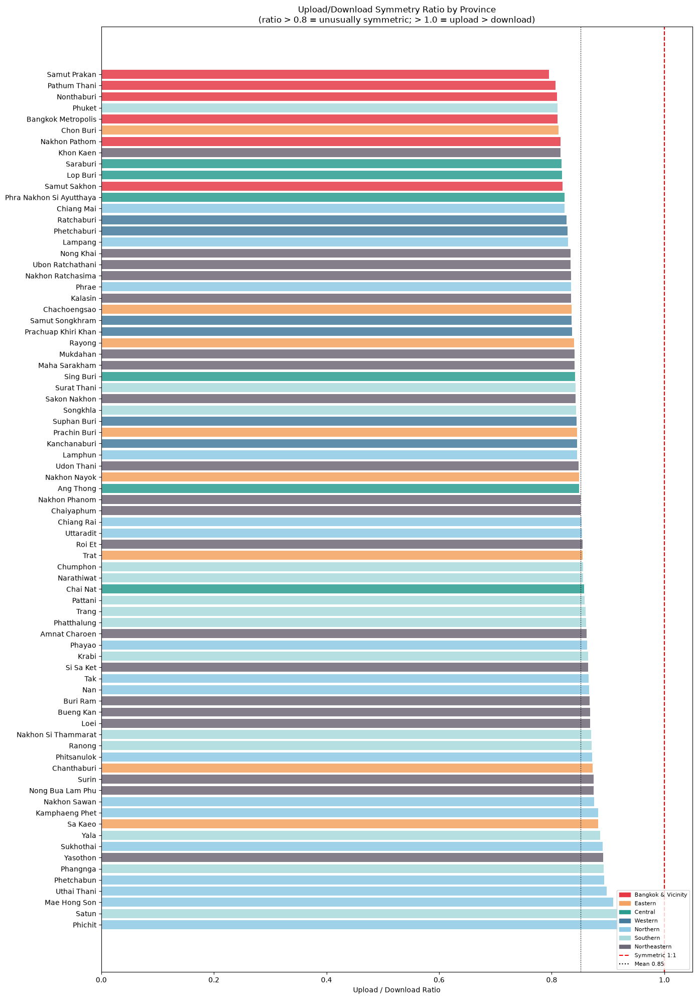

Provinces with UL/DL ratio > 0.8 (76):
                    name             region  ul_dl_ratio
                 Phichit           Northern     0.918945
                   Satun           Southern     0.917170
            Mae Hong Son           Northern     0.909214
             Uthai Thani           Northern     0.897268
              Phetchabun           Northern     0.893416
                Phangnga           Southern     0.892131
                Yasothon       Northeastern     0.891742
               Sukhothai           Northern     0.890411
                    Yala           Southern     0.885886
                 Sa Kaeo            Eastern     0.882778
          Kamphaeng Phet           Northern     0.882724
            Nakhon Sawan           Northern     0.875629
        Nong Bua Lam Phu       Northeastern     0.874272
                   Surin       Northeastern     0.874198
             Chanthaburi            Eastern     0.872919
             Phitsanulok           Northern     0

In [32]:
master['ul_dl_ratio'] = master['avg_u_mbps'] / master['avg_d_mbps']

ratio_mean = master.groupby('name')['ul_dl_ratio'].mean().sort_values(ascending=False).reset_index()
ratio_mean = ratio_mean.merge(prov_ref[['province_en','region']].rename(columns={'province_en':'name'}), on='name', how='left')

fig, ax = plt.subplots(figsize=(14, 20))
colors = [region_colors.get(r,'gray') for r in ratio_mean['region']]
ax.barh(ratio_mean['name'], ratio_mean['ul_dl_ratio'], color=colors, alpha=0.85)
ax.axvline(1.0, color='red', ls='--', lw=1.5, label='Symmetric (1:1)')
ax.axvline(ratio_mean['ul_dl_ratio'].mean(), color='black', ls=':', lw=1, label=f'Mean ratio {ratio_mean["ul_dl_ratio"].mean():.2f}')
ax.set_xlabel('Upload / Download Ratio')
ax.set_title('Upload/Download Symmetry Ratio by Province\n(ratio > 0.8 = unusually symmetric; > 1.0 = upload > download)')
patches = [mpatches.Patch(color=v, label=k) for k,v in region_colors.items()]
ax.legend(handles=patches+[
    plt.Line2D([0],[0],color='red',ls='--',label='Symmetric 1:1'),
    plt.Line2D([0],[0],color='black',ls=':',label=f'Mean {ratio_mean["ul_dl_ratio"].mean():.2f}')
], fontsize=8, loc='lower right')
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/17_uldl_ratio_bar.png', dpi=150, bbox_inches='tight')
plt.show()

divergent_ratio = ratio_mean[ratio_mean['ul_dl_ratio'] > 0.8]
print(f"Provinces with UL/DL ratio > 0.8 ({len(divergent_ratio)}):")
print(divergent_ratio[['name','region','ul_dl_ratio']].to_string(index=False))


### 10. Anomaly Detection — Province Flags

In [33]:
# === ANOMALY DETECTION (recalibrated from actual data) ===
# National mean UL/DL ratio = 0.852 → flag only clear outliers (z-score based)
# Tier medians are compressed: T1=282, T2=247, T3=246, T4=229 Mbps
# Thresholds set based on observed distributions

from scipy import stats
import numpy as np

master['ul_dl_ratio'] = master['avg_u_mbps'] / master['avg_d_mbps']
high_ratio = master.groupby('name')['ul_dl_ratio'].mean()

prov_mean = (
    master.groupby(['name','region'])
    .agg(
        mean_dl=('avg_d_mbps','mean'),
        mean_ul=('avg_u_mbps','mean'),
        mean_lat=('avg_lat_ms_wt','mean'),
        mean_tests=('total_tests','mean'),
        mean_ratio=('ul_dl_ratio','mean'),
    )
    .reset_index()
    .sort_values('mean_dl', ascending=False)
)
prov_mean['tier'] = prov_mean['name'].map(prov_ref.set_index('province_en')['internet_tier'].to_dict())

tier_speed   = prov_mean.groupby('tier')['mean_dl'].median()
national_std = prov_mean['mean_dl'].std()


# infastructure mod

### 12. Full Province Summary Table

In [34]:
summary = prov_mean.merge(
    prov_ref[['province_en','pop_2024','gdp_per_capita_thb_2021','internet_tier']].rename(columns={'province_en':'name'}),
    on='name', how='left'
).copy()

summary['ul_dl_ratio'] = summary['name'].map(high_ratio).round(3)
summary = summary.sort_values('mean_dl', ascending=False).round(2)

print(summary[[
    'name','region','internet_tier',
    'mean_dl','mean_ul','mean_lat',
    'ul_dl_ratio','mean_tests',
    'gdp_per_capita_thb_2021'
]].to_string(index=False))

                    name             region  internet_tier  mean_dl  mean_ul  mean_lat  ul_dl_ratio  mean_tests  gdp_per_capita_thb_2021
              Nonthaburi Bangkok & Vicinity              1   317.29   256.74      6.05         0.81    82461.00                638109.06
            Pathum Thani Bangkok & Vicinity              1   315.19   254.39      5.35         0.81    73300.00                759245.02
            Samut Prakan Bangkok & Vicinity              1   312.04   247.99      5.93         0.80    85336.36                933102.81
            Samut Sakhon Bangkok & Vicinity              1   299.91   245.52      5.80         0.82    26094.27               1289926.65
           Nakhon Pathom Bangkok & Vicinity              2   296.97   241.86      5.45         0.82    33914.73                981679.12
      Bangkok Metropolis Bangkok & Vicinity              1   295.46   239.28      6.28         0.81   482434.64               1957179.52
                  Rayong            Easte

### 13. UL/DL Symmetry — Fiber Penetration Evidence

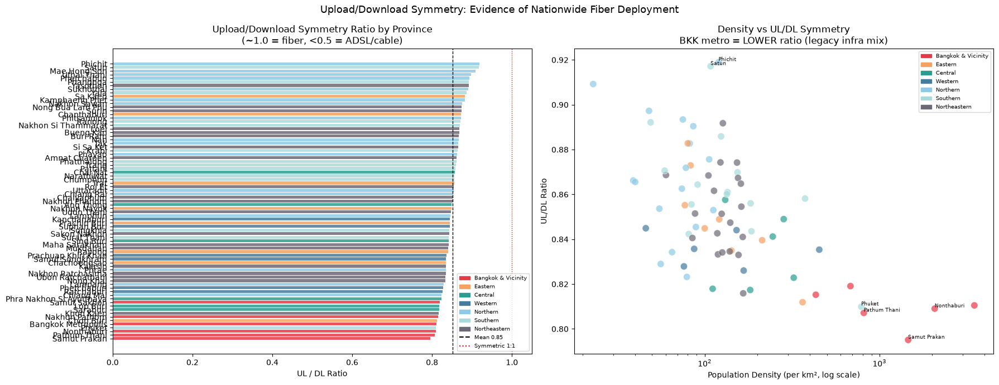

Provinces ratio > 0.90: 3 (near-perfect fiber)
Provinces ratio > 0.80: 76 out of 77
Bangkok metro min ratio: 0.795
Rural province max ratio: 0.892


In [35]:
# Near-symmetric UL/DL is a fiber hallmark (GPON/FTTH = ~1:1, ADSL = ~0.1-0.2)
# National mean = 0.852 → widespread fiber even in poor/rural provinces

fig, axes = plt.subplots(1, 2, figsize=(18, 7))

ratio_sorted = prov_mean.sort_values('mean_ratio', ascending=True)
colors = [region_colors.get(r,'gray') for r in ratio_sorted['region']]
axes[0].barh(ratio_sorted['name'], ratio_sorted['mean_ratio'], color=colors, alpha=0.85)
axes[0].axvline(prov_mean['mean_ratio'].mean(), color='black', ls='--', lw=1,
                label=f"National mean {prov_mean['mean_ratio'].mean():.2f}")
axes[0].axvline(1.0, color='red', ls=':', lw=1, label='Symmetric 1:1')
axes[0].set_xlabel('UL / DL Ratio')
axes[0].set_title('Upload/Download Symmetry Ratio by Province\n(~1.0 = fiber, <0.5 = ADSL/cable)')
patches = [mpatches.Patch(color=v,label=k) for k,v in region_colors.items()]
axes[0].legend(handles=patches + [
    plt.Line2D([0],[0],color='black',ls='--',label=f'Mean {prov_mean["mean_ratio"].mean():.2f}'),
    plt.Line2D([0],[0],color='red',ls=':',label='Symmetric 1:1'),
], fontsize=7, loc='lower right')

# Bangkok vs rural: BKK has LOWER ratio (older infra mix) vs rural fiber-only
axes[1].scatter(prov_ref.set_index('province_en').loc[prov_mean['name'],'density_per_km2'].values,
                prov_mean['mean_ratio'].values,
                c=[region_colors.get(r,'gray') for r in prov_mean['region']],
                s=80, alpha=0.7, edgecolors='white', lw=0.5)
for _, row in prov_mean.iterrows():
    if row['mean_ratio'] > 0.91 or row['mean_ratio'] < 0.81 or row['mean_dl'] > 300:
        density = prov_ref.loc[prov_ref['province_en']==row['name'],'density_per_km2'].values
        if len(density):
            axes[1].annotate(row['name'], (density[0], row['mean_ratio']),
                             fontsize=6.5, ha='left', va='bottom')
axes[1].set_xscale('log')
axes[1].set_xlabel('Population Density (per km², log scale)')
axes[1].set_ylabel('UL/DL Ratio')
axes[1].set_title('Density vs UL/DL Symmetry\nBKK metro = LOWER ratio (legacy infra mix)')
axes[1].legend(handles=patches, fontsize=7)

plt.suptitle('Upload/Download Symmetry: Evidence of Nationwide Fiber Deployment', fontsize=13)
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/19_uldl_symmetry_ratio.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"Provinces ratio > 0.90: {(prov_mean['mean_ratio'] > 0.90).sum()} (near-perfect fiber)")
print(f"Provinces ratio > 0.80: {(prov_mean['mean_ratio'] > 0.80).sum()} out of 77")
print(f"Bangkok metro min ratio: {prov_mean[prov_mean['region']=='Bangkok & Vicinity']['mean_ratio'].min():.3f}")
print(f"Rural province max ratio: {prov_mean[prov_mean['region']=='Northeastern']['mean_ratio'].max():.3f}")


### 14. Temporal: Speed Growth 2023 Q1 → 2025 Q4

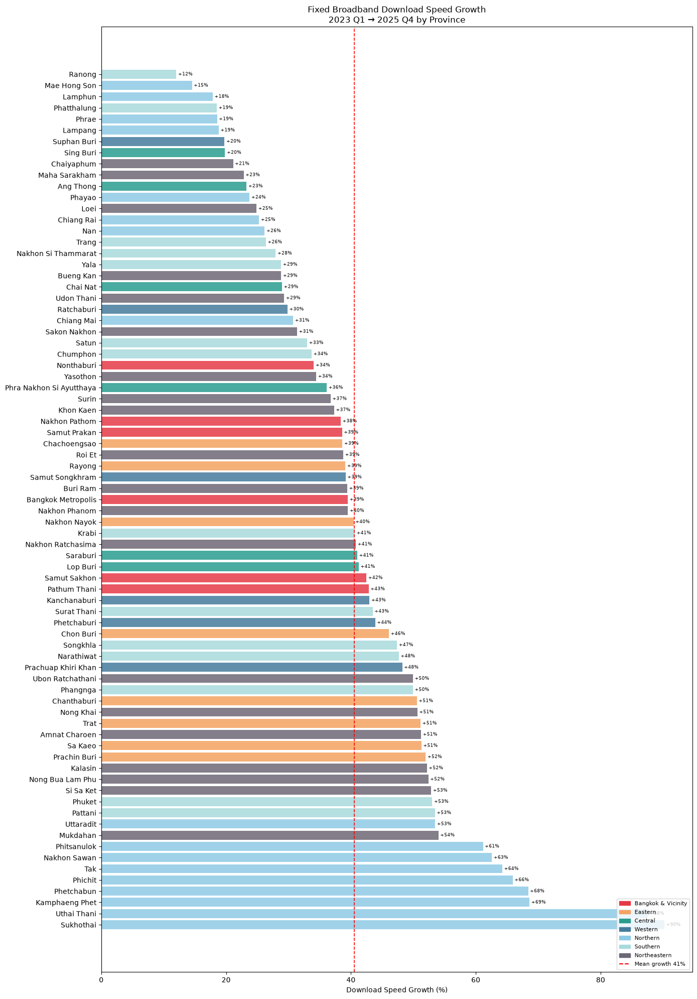

Top 10 fastest growing provinces:
          name       region  internet_tier  pct_growth
     Sukhothai     Northern              3   90.211210
   Uthai Thani     Northern              3   87.590317
Kamphaeng Phet     Northern              3   68.610470
    Phetchabun     Northern              3   68.397847
       Phichit     Northern              3   65.915823
           Tak     Northern              3   64.254773
  Nakhon Sawan     Northern              3   62.583810
   Phitsanulok     Northern              3   61.163803
      Mukdahan Northeastern              4   54.014858
     Uttaradit     Northern              3   53.499429

Bottom 5 (slowest growth or decline):
        name   region  internet_tier  pct_growth
      Ranong Southern              3   12.031291
Mae Hong Son Northern              4   14.528956
     Lamphun Northern              2   17.857854
 Phatthalung Southern              3   18.500883
       Phrae Northern              3   18.555045


In [36]:
first = master[master['label']=='2023-Q1'].set_index('name')['avg_d_mbps']
last  = master[master['label']=='2025-Q4'].set_index('name')['avg_d_mbps']
growth = ((last - first) / first * 100).dropna().sort_values(ascending=False)

growth_df = growth.reset_index()
growth_df.columns = ['name','pct_growth']
growth_df = growth_df.merge(prov_ref[['province_en','region','internet_tier']].rename(columns={'province_en':'name'}), on='name', how='left')

fig, ax = plt.subplots(figsize=(14, 20))
colors = [region_colors.get(r,'gray') for r in growth_df['region']]
bars = ax.barh(growth_df['name'], growth_df['pct_growth'], color=colors, alpha=0.85)
ax.axvline(0, color='black', lw=0.8)
ax.axvline(growth_df['pct_growth'].mean(), color='red', ls='--', lw=1.2,
           label=f"Mean growth {growth_df['pct_growth'].mean():.0f}%")
for bar, val in zip(bars, growth_df['pct_growth']):
    ax.text(bar.get_width() + 0.3, bar.get_y() + bar.get_height()/2,
            f'{val:+.0f}%', va='center', fontsize=6.5)
patches = [mpatches.Patch(color=v,label=k) for k,v in region_colors.items()]
ax.legend(handles=patches+[plt.Line2D([0],[0],color='red',ls='--',label=f'Mean growth {growth_df["pct_growth"].mean():.0f}%')],
          fontsize=8, loc='lower right')
ax.set_xlabel('Download Speed Growth (%)')
ax.set_title('Fixed Broadband Download Speed Growth\n2023 Q1 → 2025 Q4 by Province', fontsize=12)
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/20_density_vs_speed.png', dpi=150, bbox_inches='tight')
plt.show()

print("Top 10 fastest growing provinces:")
print(growth_df.nlargest(10,'pct_growth')[['name','region','internet_tier','pct_growth']].to_string(index=False))
print("\nBottom 5 (slowest growth or decline):")
print(growth_df.nsmallest(5,'pct_growth')[['name','region','internet_tier','pct_growth']].to_string(index=False))


### 15. Deep Dive — The Divergent Ones

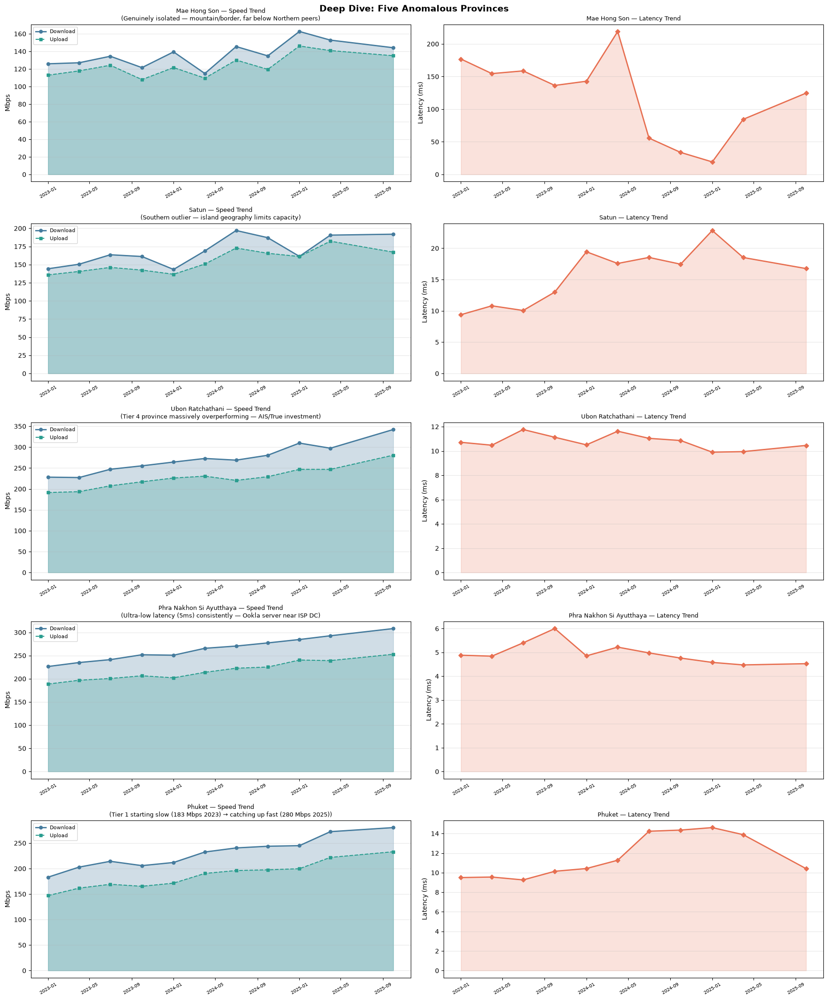

In [37]:
# Focus on 5 provinces that stand out most
DIVERGENT = {
    'Mae Hong Son':              'Genuinely isolated — mountain/border, far below Northern peers',
    'Satun':                     'Southern outlier — island geography limits capacity',
    'Ubon Ratchathani':          'Tier 4 province massively overperforming — AIS/True investment',
    'Phra Nakhon Si Ayutthaya':  'Ultra-low latency (5ms) consistently — Ookla server near ISP DC',
    'Phuket':                    'Tier 1 starting slow (183 Mbps 2023) → catching up fast (280 Mbps 2025)',
}

fig, axes = plt.subplots(len(DIVERGENT), 2, figsize=(18, 22))

quarter_order = sorted(master['label'].unique())

for ax_row, (prov, note) in zip(axes, DIVERGENT.items()):
    df_p = master[master['name']==prov].sort_values('label')
    
    # Download + upload trend
    ax_row[0].fill_between(df_p['period_start'], df_p['avg_d_mbps'], alpha=0.25, color='#457b9d')
    ax_row[0].plot(df_p['period_start'], df_p['avg_d_mbps'], 'o-', color='#457b9d', label='Download', lw=2, markersize=5)
    ax_row[0].fill_between(df_p['period_start'], df_p['avg_u_mbps'], alpha=0.25, color='#2a9d8f')
    ax_row[0].plot(df_p['period_start'], df_p['avg_u_mbps'], 's--', color='#2a9d8f', label='Upload', lw=1.5, markersize=4)
    ax_row[0].set_title(f'{prov} — Speed Trend\n({note})', fontsize=9)
    ax_row[0].set_ylabel('Mbps'); ax_row[0].legend(fontsize=8); ax_row[0].grid(axis='y', alpha=0.3)
    ax_row[0].tick_params(axis='x', rotation=30, labelsize=7)
    
    # Latency trend
    ax_row[1].plot(df_p['period_start'], df_p['avg_lat_ms_wt'], 'D-', color='#e76f51', lw=2, markersize=5)
    ax_row[1].fill_between(df_p['period_start'], df_p['avg_lat_ms_wt'], alpha=0.2, color='#e76f51')
    ax_row[1].set_title(f'{prov} — Latency Trend', fontsize=9)
    ax_row[1].set_ylabel('Latency (ms)'); ax_row[1].grid(axis='y', alpha=0.3)
    ax_row[1].tick_params(axis='x', rotation=30, labelsize=7)

plt.suptitle('Deep Dive: Five Anomalous Provinces', fontsize=14, fontweight='bold')
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/21_deep_dive_divergent.png', dpi=150, bbox_inches='tight')
plt.show()


### 16. EDA Key Findings Summary

## Key Findings from EDA

---

In [38]:
from scipy import stats as scipy_stats
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import geopandas as gpd
import warnings
warnings.filterwarnings('ignore')

_DATA_ROOT = '/home/chissanupun/Desktop/Code/lab/cnc/ds/internet-measurement/data'

# Fallback: load master and prov_ref if not already in scope
if 'master' not in dir() or master is None:
    master = pd.read_parquet(f'{_DATA_ROOT}/ookla/processed/master_province_quarterly.parquet')
    print("Loaded master from processed parquet")
if 'prov_ref' not in dir() or prov_ref is None:
    prov_ref = pd.read_csv(f'{_DATA_ROOT}/reference/province_reference.csv')
    print("Loaded prov_ref from CSV")

# ── Build per-province summary (self-contained) ────────────────────────────────
divergent_df = (
    master.groupby(['name', 'region'])
    .agg(
        mean_dl=('avg_d_mbps', 'mean'),
        mean_ul=('avg_u_mbps', 'mean'),
        mean_lat=('avg_lat_ms_wt', 'mean'),
        mean_tests=('total_tests', 'mean'),
    )
    .reset_index()
)

# Temporal instability: std of quarterly download speed
temp_std = master.groupby('name')['avg_d_mbps'].std().rename('std_dl')
divergent_df = divergent_df.merge(temp_std, on='name', how='left')
divergent_df['cv_dl'] = divergent_df['std_dl'] / divergent_df['mean_dl']

# Merge reference cols
divergent_df = divergent_df.merge(
    prov_ref[['province_en','pop_2024','density_per_km2',
              'gdp_per_capita_thb_2021','internet_tier','area_km2']]
    .rename(columns={'province_en': 'name'}),
    on='name', how='left'
)

divergent_df['ul_dl_ratio']        = divergent_df['mean_ul'] / divergent_df['mean_dl']
divergent_df['tests_per_1000_pop'] = divergent_df['mean_tests'] / divergent_df['pop_2024'] * 1_000

print(f"Provinces in analysis: {len(divergent_df)}")
print(divergent_df[['name','region','internet_tier','mean_dl','ul_dl_ratio','tests_per_1000_pop']].head(5).to_string(index=False))


Provinces in analysis: 77
              name             region  internet_tier    mean_dl  ul_dl_ratio  tests_per_1000_pop
     Amnat Charoen       Northeastern              4 235.450704     0.858652            6.501466
         Ang Thong            Central              3 241.674402     0.848571           14.161879
Bangkok Metropolis Bangkok & Vicinity              1 295.458374     0.809877           88.422771
         Bueng Kan       Northeastern              4 219.179839     0.868427            7.011716
          Buri Ram       Northeastern              4 227.072551     0.865984            7.151863


In [39]:
# ── Dimension 1: Tier residual ─────────────────────────────────────────────────
tier_med = divergent_df.groupby('internet_tier')['mean_dl'].median()
divergent_df['tier_expected']   = divergent_df['internet_tier'].map(tier_med)
divergent_df['tier_residual']   = (divergent_df['mean_dl'] - divergent_df['tier_expected']) / divergent_df['tier_expected']
divergent_df['tier_residual_z'] = (divergent_df['tier_residual'] - divergent_df['tier_residual'].mean()) / divergent_df['tier_residual'].std()

# ── Dimension 2: GDP residual (OLS on log-GDP) ─────────────────────────────────
log_gdp = np.log(divergent_df['gdp_per_capita_thb_2021'])
slope_g, int_g, r_g, p_g, _ = scipy_stats.linregress(log_gdp, divergent_df['mean_dl'])
divergent_df['gdp_expected']   = int_g + slope_g * log_gdp
divergent_df['gdp_residual']   = divergent_df['mean_dl'] - divergent_df['gdp_expected']
divergent_df['gdp_residual_z'] = scipy_stats.zscore(divergent_df['gdp_residual'])

# ── Dimension 3: Density residual (OLS on log-density) ────────────────────────
log_den = np.log1p(divergent_df['density_per_km2'])
slope_d, int_d, r_d, p_d, _ = scipy_stats.linregress(log_den, divergent_df['mean_dl'])
divergent_df['den_expected']   = int_d + slope_d * log_den
divergent_df['den_residual_z'] = scipy_stats.zscore(divergent_df['mean_dl'] - divergent_df['den_expected'])

# ── Dimension 4: Regional z-score (speed within region) ───────────────────────
divergent_df['regional_z'] = divergent_df.groupby('region')['mean_dl'].transform(
    lambda x: scipy_stats.zscore(x) if len(x) > 1 else pd.Series(np.zeros(len(x)), index=x.index)
)

# ── Dimension 5: UL/DL ratio z-score ──────────────────────────────────────────
divergent_df['ratio_z'] = scipy_stats.zscore(divergent_df['ul_dl_ratio'])

# ── Dimension 6: Within-region latency z-score ────────────────────────────────
divergent_df['lat_regional_z'] = divergent_df.groupby('region')['mean_lat'].transform(
    lambda x: scipy_stats.zscore(x) if len(x) > 1 else pd.Series(np.zeros(len(x)), index=x.index)
)

# ── Dimension 7: Coverage z-score (tests per 1000 pop) ────────────────────────
divergent_df['coverage_z'] = scipy_stats.zscore(divergent_df['tests_per_1000_pop'])

# ── Composite divergence score (sum of absolute z-scores) ──────────────────────
divergent_df['divergence_score'] = (
    np.abs(divergent_df['tier_residual_z']) +
    np.abs(divergent_df['gdp_residual_z']) +
    np.abs(divergent_df['den_residual_z']) +
    np.abs(divergent_df['regional_z']) +
    np.abs(divergent_df['ratio_z']) +
    np.abs(divergent_df['lat_regional_z']) +
    np.abs(divergent_df['coverage_z'])
)

print(f"GDP-speed OLS:     r = {r_g:.3f}, slope = {slope_g:.2f} Mbps per log-unit GDP")
print(f"Density-speed OLS: r = {r_d:.3f}, slope = {slope_d:.2f} Mbps per log-unit density")
print()
print("Top 15 divergentest provinces:")
cols = ['name','region','internet_tier','mean_dl','divergence_score',
        'gdp_residual_z','den_residual_z','regional_z','ratio_z','lat_regional_z','coverage_z']
print(divergent_df.nlargest(15,'divergence_score')[cols].to_string(index=False))


GDP-speed OLS:     r = 0.554, slope = 28.51 Mbps per log-unit GDP
Density-speed OLS: r = 0.629, slope = 22.18 Mbps per log-unit density

Top 15 divergentest provinces:
              name             region  internet_tier    mean_dl  divergence_score  gdp_residual_z  den_residual_z  regional_z   ratio_z  lat_regional_z  coverage_z
      Mae Hong Son           Northern              4 136.655103         19.936517       -3.470278       -2.921754   -3.142597  2.228556        3.926428   -0.347901
             Satun           Southern              3 169.092662         15.563434       -2.802681       -2.969533   -2.501451  2.472313        1.242166   -0.577729
            Phuket           Southern              1 230.244602         11.779861       -0.803347       -2.234383    0.368270 -1.528693       -0.784855    4.336491
      Pathum Thani Bangkok & Vicinity              1 315.191678         11.094205        2.189918        1.341953    1.013683 -1.676343       -1.412082    2.216912
        Nont

### 18. Tier vs Actual Speed — Expectation Gap

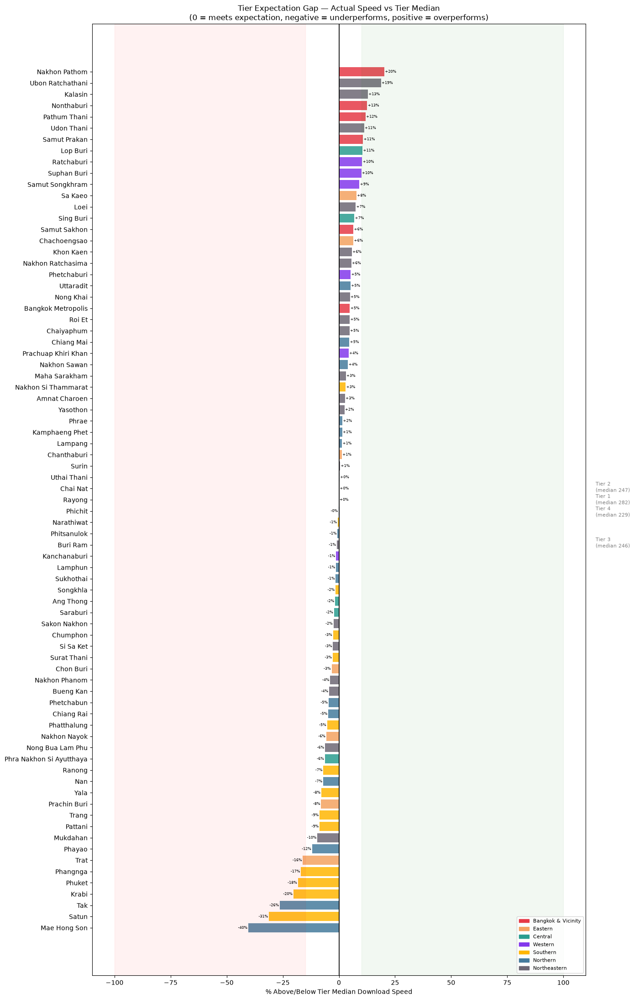

Biggest underperformers vs tier expectation:
        name  internet_tier    mean_dl  tier_expected  tier_residual
Mae Hong Son              4 136.655103     229.244822      -0.403890
       Satun              3 169.092662     245.882003      -0.312302
         Tak              3 181.050407     245.882003      -0.263670
       Krabi              2 196.887912     246.965608      -0.202772
      Phuket              1 230.244602     281.778136      -0.182887
    Phangnga              2 205.142921     246.965608      -0.169346
        Trat              2 207.218722     246.965608      -0.160941
      Phayao              3 216.476203     245.882003      -0.119593

Biggest overperformers vs tier expectation:
            name  internet_tier    mean_dl  tier_expected  tier_residual
   Nakhon Pathom              2 296.965653     246.965608       0.202458
Ubon Ratchathani              4 272.181303     229.244822       0.187295
         Kalasin              4 258.813798     229.244822       0.1289

In [40]:
# Show each province's % deviation from its tier median
tier_gap = divergent_df[['name','region','internet_tier','mean_dl','tier_expected','tier_residual']].copy()
tier_gap = tier_gap.sort_values('tier_residual')

fig, ax = plt.subplots(figsize=(14, 22))

region_colors = {
    'Bangkok & Vicinity': '#e63946', 'Eastern': '#f4a261',
    'Central': '#2a9d8f', 'Western': '#8338ec',
    'Southern': '#ffb703', 'Northern': '#457b9d', 'Northeastern': '#6d6875',
}

colors = [region_colors.get(r, 'gray') for r in tier_gap['region']]
bars = ax.barh(tier_gap['name'], tier_gap['tier_residual'] * 100, color=colors, alpha=0.85)

# Tier median reference lines
ax.axvline(0, color='black', lw=1.2, label='Tier median (expected)')

# Annotate bars
for bar, val in zip(bars, tier_gap['tier_residual']):
    x = bar.get_width()
    ax.text(x + (0.3 if x >= 0 else -0.3), bar.get_y() + bar.get_height()/2,
            f'{val*100:+.0f}%', va='center', ha='left' if x >= 0 else 'right', fontsize=6)

# Tier grouping lines
tier_boundaries = tier_gap.groupby('internet_tier').apply(lambda g: (g.index.min(), g.index.max()))
for t in sorted(tier_gap['internet_tier'].unique()):
    grp = tier_gap[tier_gap['internet_tier'] == t]
    median = tier_med[t]
    ax.axvline(0, color='black', lw=0.4, ls='--', alpha=0.4)

patches = [mpatches.Patch(color=v, label=k) for k, v in region_colors.items()]
ax.legend(handles=patches, fontsize=8, loc='lower right')
ax.set_xlabel('% Above/Below Tier Median Download Speed')
ax.set_title('Tier Expectation Gap — Actual Speed vs Tier Median\n'
             '(0 = meets expectation, negative = underperforms, positive = overperforms)', fontsize=12)
ax.axvspan(-100, -15, alpha=0.05, color='red', label='Strong underperform')
ax.axvspan(10, 100, alpha=0.05, color='green')

# Annotate Tier brackets on y-axis
for t in sorted(tier_gap['internet_tier'].unique()):
    grp_idx = tier_gap[tier_gap['internet_tier']==t].index
    grp_pos = [list(tier_gap.index).index(i) for i in grp_idx]
    if grp_pos:
        mid = (min(grp_pos) + max(grp_pos)) / 2
        ax.annotate(f'Tier {t}\n(median {tier_med[t]:.0f})', xy=(1.02, mid/len(tier_gap)),
                    xycoords='axes fraction', va='center', fontsize=8, color='gray')

plt.tight_layout()

plt.savefig(f'../../outputs/ookla/22_tier_expectation_gap.png', dpi=150, bbox_inches='tight')
plt.show()

print("Biggest underperformers vs tier expectation:")
print(tier_gap.nsmallest(8,'tier_residual')[['name','internet_tier','mean_dl','tier_expected','tier_residual']].to_string(index=False))
print()
print("Biggest overperformers vs tier expectation:")
print(tier_gap.nlargest(8,'tier_residual')[['name','internet_tier','mean_dl','tier_expected','tier_residual']].to_string(index=False))


### 19. GDP per Capita vs Download Speed — Who Breaks the Rule?

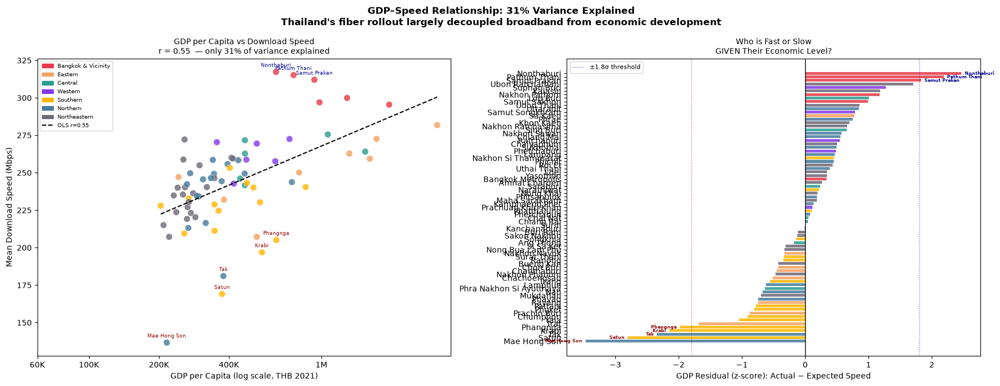

In [41]:
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# ── Left: GDP scatter ──────────────────────────────────────────────────────────
ax = axes[0]
gdp_vals = divergent_df['gdp_per_capita_thb_2021']
colors_scatter = [region_colors.get(r, 'gray') for r in divergent_df['region']]

sc = ax.scatter(np.log(gdp_vals), divergent_df['mean_dl'],
                c=colors_scatter, s=70, alpha=0.8, edgecolors='white', lw=0.4)

# OLS line
x_fit = np.linspace(np.log(gdp_vals.min()), np.log(gdp_vals.max()), 200)
ax.plot(x_fit, int_g + slope_g * x_fit, 'k--', lw=1.5,
        label=f'OLS fit  r={r_g:.2f}')

# Label big residuals
threshold = 1.8
for _, row in divergent_df.iterrows():
    if abs(row['gdp_residual_z']) > threshold:
        ax.annotate(row['name'],
                    (np.log(row['gdp_per_capita_thb_2021']), row['mean_dl']),
                    fontsize=6.5, ha='center', va='bottom',
                    xytext=(0, 5), textcoords='offset points',
                    color='darkred' if row['gdp_residual_z'] < 0 else 'darkblue')

ax.set_xlabel('GDP per Capita (log scale, THB 2021)')
ax.set_ylabel('Mean Download Speed (Mbps)')
ax.set_title(f'GDP per Capita vs Download Speed\nr = {r_g:.2f}  — only {r_g**2*100:.0f}% of variance explained',
             fontsize=10)

# x-tick labels as actual THB values
xticks = np.log([60_000, 100_000, 200_000, 400_000, 1_000_000])
ax.set_xticks(xticks)
ax.set_xticklabels(['60K','100K','200K','400K','1M'])

patches = [mpatches.Patch(color=v, label=k) for k, v in region_colors.items()]
ax.legend(handles=patches + [plt.Line2D([0],[0],color='black',ls='--',label=f'OLS r={r_g:.2f}')],
          fontsize=7)

# ── Right: residual bar chart ──────────────────────────────────────────────────
ax2 = axes[1]
resid_sorted = divergent_df.sort_values('gdp_residual_z')
cols2 = [region_colors.get(r, 'gray') for r in resid_sorted['region']]
bars2 = ax2.barh(resid_sorted['name'], resid_sorted['gdp_residual_z'], color=cols2, alpha=0.85)
ax2.axvline(0, color='black', lw=1)
ax2.axvline(1.8, color='darkblue', ls=':', lw=1, alpha=0.6, label='±1.8σ threshold')
ax2.axvline(-1.8, color='darkred', ls=':', lw=1, alpha=0.6)
ax2.set_xlabel('GDP Residual (z-score): Actual − Expected Speed')
ax2.set_title('Who is Fast or Slow\nGIVEN Their Economic Level?', fontsize=10)
ax2.legend(fontsize=8)
# Add province labels for outliers
for bar, (_, row) in zip(bars2, resid_sorted.iterrows()):
    if abs(row['gdp_residual_z']) > 1.8:
        x = bar.get_width()
        ax2.text(x + (0.05 if x >= 0 else -0.05), bar.get_y() + bar.get_height()/2,
                 row['name'], va='center', ha='left' if x >= 0 else 'right', fontsize=5.5,
                 color='darkblue' if x > 0 else 'darkred', fontweight='bold')

plt.suptitle('GDP–Speed Relationship: 31% Variance Explained\n'
             'Thailand\'s fiber rollout largely decoupled broadband from economic development',
             fontsize=12, fontweight='bold')
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/23_gdp_residual_bar.png', dpi=150, bbox_inches='tight')
plt.show()


### 20. Population Density vs Speed — Greenfield Fiber Effect

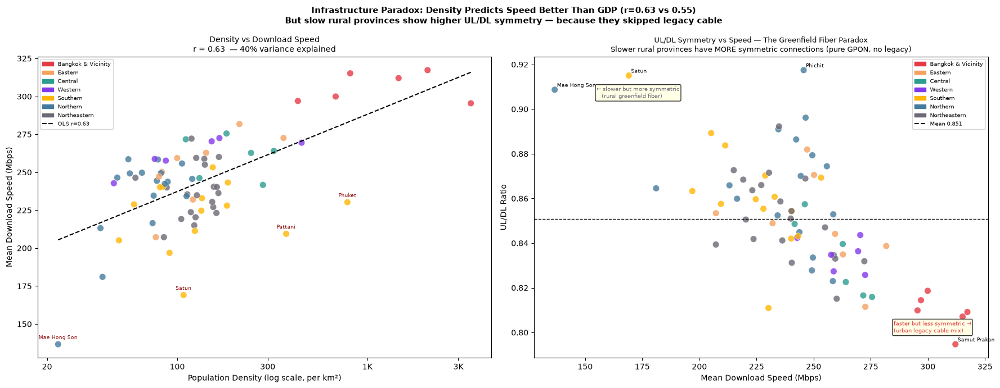

In [42]:
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# ── Left: Density scatter ──────────────────────────────────────────────────────
ax = axes[0]
den_vals = divergent_df['density_per_km2']
colors_s = [region_colors.get(r, 'gray') for r in divergent_df['region']]

ax.scatter(np.log1p(den_vals), divergent_df['mean_dl'],
           c=colors_s, s=70, alpha=0.8, edgecolors='white', lw=0.4)

x_fit2 = np.linspace(np.log1p(den_vals.min()), np.log1p(den_vals.max()), 200)
ax.plot(x_fit2, int_d + slope_d * x_fit2, 'k--', lw=1.5, label=f'OLS r={r_d:.2f}')

for _, row in divergent_df.iterrows():
    if abs(row['den_residual_z']) > 2.0:
        ax.annotate(row['name'],
                    (np.log1p(row['density_per_km2']), row['mean_dl']),
                    fontsize=6.5, ha='center', va='bottom',
                    xytext=(0, 5), textcoords='offset points',
                    color='darkred' if row['den_residual_z'] < 0 else 'darkblue')

xticks_den = np.log1p([20, 100, 300, 1000, 3000])
ax.set_xticks(xticks_den)
ax.set_xticklabels(['20','100','300','1K','3K'])
ax.set_xlabel('Population Density (log scale, per km²)')
ax.set_ylabel('Mean Download Speed (Mbps)')
ax.set_title(f'Density vs Download Speed\nr = {r_d:.2f}  — {r_d**2*100:.0f}% variance explained', fontsize=10)
patches = [mpatches.Patch(color=v, label=k) for k, v in region_colors.items()]
ax.legend(handles=patches + [plt.Line2D([0],[0],color='black',ls='--',label=f'OLS r={r_d:.2f}')],
          fontsize=7)

# ── Right: UL/DL ratio vs DL speed — the "greenfield fiber paradox" ───────────
ax2 = axes[1]
ax2.scatter(divergent_df['mean_dl'], divergent_df['ul_dl_ratio'],
            c=colors_s, s=70, alpha=0.8, edgecolors='white', lw=0.4)

for _, row in divergent_df.iterrows():
    if row['ul_dl_ratio'] > 0.91 or row['ul_dl_ratio'] < 0.80 or row['mean_dl'] < 170:
        ax2.annotate(row['name'], (row['mean_dl'], row['ul_dl_ratio']),
                     fontsize=6.5, ha='left', va='bottom',
                     xytext=(3, 2), textcoords='offset points')

ax2.axhline(divergent_df['ul_dl_ratio'].mean(), color='black', ls='--', lw=1,
            label=f"Mean ratio {divergent_df['ul_dl_ratio'].mean():.3f}")
ax2.set_xlabel('Mean Download Speed (Mbps)')
ax2.set_ylabel('UL/DL Ratio')
ax2.set_title('UL/DL Symmetry vs Speed — The Greenfield Fiber Paradox\n'
              'Slower rural provinces have MORE symmetric connections (pure GPON, no legacy)', fontsize=9)
ax2.legend(handles=patches + [plt.Line2D([0],[0],color='black',ls='--',
           label=f'Mean {divergent_df["ul_dl_ratio"].mean():.3f}')], fontsize=7)

# Add trend arrow annotation
ax2.annotate('← slower but more symmetric\n   (rural greenfield fiber)',
             xy=(155, 0.905), fontsize=7.5, color='#6d6875',
             bbox=dict(boxstyle='round,pad=0.2', fc='lightyellow', alpha=0.8))
ax2.annotate('faster but less symmetric →\n(urban legacy cable mix)',
             xy=(285, 0.800), fontsize=7.5, color='#e63946',
             bbox=dict(boxstyle='round,pad=0.2', fc='lightyellow', alpha=0.8))

plt.suptitle('Infrastructure Paradox: Density Predicts Speed Better Than GDP (r=0.63 vs 0.55)\n'
             'But slow rural provinces show higher UL/DL symmetry — because they skipped legacy cable',
             fontsize=11, fontweight='bold')
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/24_uldl_greenfield.png', dpi=150, bbox_inches='tight')
plt.show()


### 21. Ookla Coverage — Tests per 1,000 Population

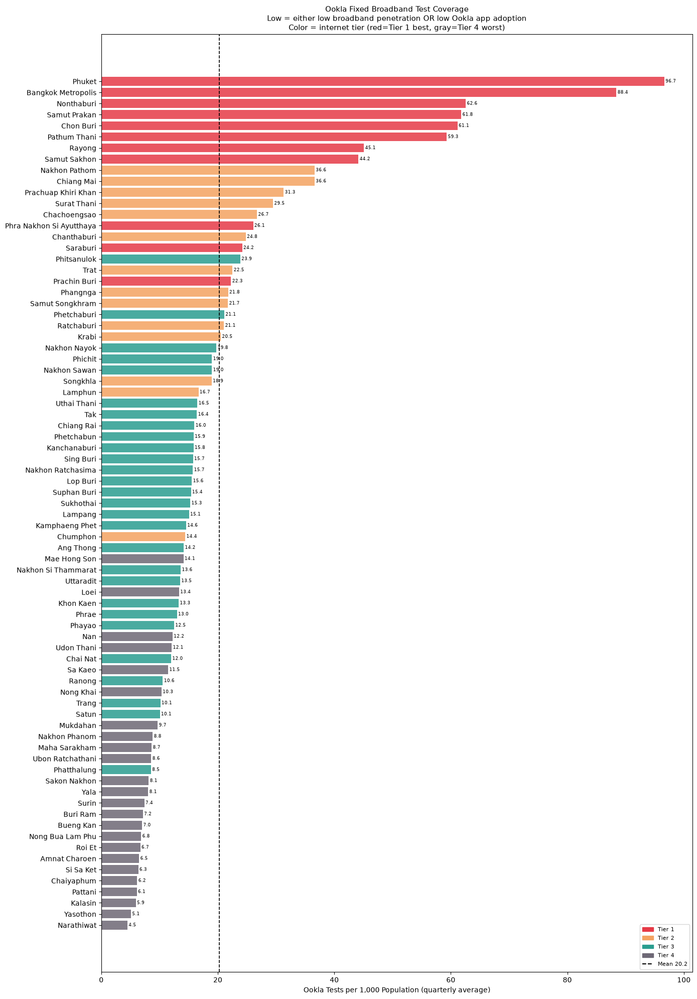

Top coverage (tests per 1000 pop):
              name             region  internet_tier  tests_per_1000_pop    mean_tests  pop_2024
            Phuket           Southern              1           96.652854  41560.727273    430000
Bangkok Metropolis Bangkok & Vicinity              1           88.422771 482434.636364   5456000
        Nonthaburi Bangkok & Vicinity              1           62.565250  82461.000000   1318000
      Samut Prakan Bangkok & Vicinity              1           61.793167  85336.363636   1381000
         Chon Buri            Eastern              1           61.143587 100030.909091   1636000
      Pathum Thani Bangkok & Vicinity              1           59.304207  73300.000000   1236000
            Rayong            Eastern              1           45.098117  35266.727273    782000
      Samut Sakhon Bangkok & Vicinity              1           44.152746  26094.272727    591000

Bottom coverage:
            name       region  internet_tier  tests_per_1000_pop  mean_tes

In [43]:
# Tests per 1000 pop = proxy for (broadband penetration × Ookla app adoption × tech-savviness)
cov = divergent_df.sort_values('tests_per_1000_pop')
tier_palette = {1:'#e63946', 2:'#f4a261', 3:'#2a9d8f', 4:'#6d6875'}
colors_cov = [tier_palette.get(int(t), 'gray') for t in cov['internet_tier']]

fig, ax = plt.subplots(figsize=(14, 20))
bars = ax.barh(cov['name'], cov['tests_per_1000_pop'], color=colors_cov, alpha=0.85)
ax.axvline(divergent_df['tests_per_1000_pop'].mean(), color='black', ls='--', lw=1.2,
           label=f"National mean {divergent_df['tests_per_1000_pop'].mean():.1f}")

for bar, val in zip(bars, cov['tests_per_1000_pop']):
    ax.text(bar.get_width() + 0.2, bar.get_y() + bar.get_height()/2,
            f'{val:.1f}', va='center', fontsize=6.2)

patches_t = [mpatches.Patch(color=v, label=f'Tier {k}') for k, v in tier_palette.items()]
ax.legend(handles=patches_t + [plt.Line2D([0],[0],color='black',ls='--',
           label=f'Mean {divergent_df["tests_per_1000_pop"].mean():.1f}')], fontsize=8)
ax.set_xlabel('Ookla Tests per 1,000 Population (quarterly average)')
ax.set_title('Ookla Fixed Broadband Test Coverage\n'
             'Low = either low broadband penetration OR low Ookla app adoption\n'
             'Color = internet tier (red=Tier 1 best, gray=Tier 4 worst)', fontsize=11)
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/25_test_coverage.png', dpi=150, bbox_inches='tight')
plt.show()

print("Top coverage (tests per 1000 pop):")
print(divergent_df.nlargest(8,'tests_per_1000_pop')[
    ['name','region','internet_tier','tests_per_1000_pop','mean_tests','pop_2024']
].to_string(index=False))
print()
print("Bottom coverage:")
print(divergent_df.nsmallest(10,'tests_per_1000_pop')[
    ['name','region','internet_tier','tests_per_1000_pop','mean_tests','pop_2024']
].to_string(index=False))


### 22. Composite Divergence Leaderboard — Top 20 Anomalous Provinces

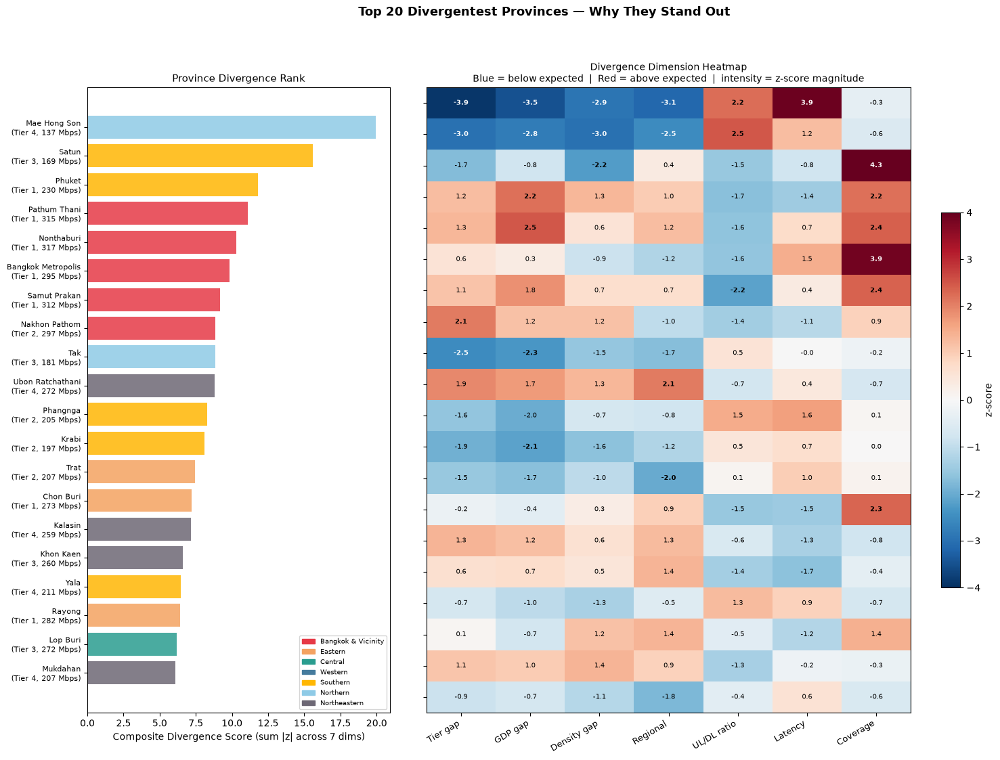


Full leaderboard table:
              name             region  internet_tier    mean_dl  divergence_score     GDP-z     Den-z     Reg-z   Ratio-z     Lat-z     Cov-z
      Mae Hong Son           Northern              4 136.655103         19.936517 -3.470278 -2.921754 -3.142597  2.228556  3.926428 -0.347901
             Satun           Southern              3 169.092662         15.563434 -2.802681 -2.969533 -2.501451  2.472313  1.242166 -0.577729
            Phuket           Southern              1 230.244602         11.779861 -0.803347 -2.234383  0.368270 -1.528693 -0.784855  4.336491
      Pathum Thani Bangkok & Vicinity              1 315.191678         11.094205  2.189918  1.341953  1.013683 -1.676343 -1.412082  2.216912
        Nonthaburi Bangkok & Vicinity              1 317.288708         10.314853  2.469554  0.551792  1.248605 -1.596809  0.729552  2.401980
Bangkok Metropolis Bangkok & Vicinity              1 295.458374          9.850224  0.337018 -0.867246 -1.196955 -1.569806  

In [44]:
TOP_N = 20
dims = ['tier_residual_z','gdp_residual_z','den_residual_z','regional_z',
        'ratio_z','lat_regional_z','coverage_z']
dim_labels = ['Tier gap','GDP gap','Density gap','Regional','UL/DL ratio','Latency','Coverage']

top20 = divergent_df.nlargest(TOP_N, 'divergence_score').copy().reset_index(drop=True)

fig = plt.figure(figsize=(18, 12))
gs  = fig.add_gridspec(1, 2, width_ratios=[1, 2], wspace=0.08)

region_colors = {
    'Bangkok & Vicinity': '#e63946', 'Eastern': '#f4a261',
    'Central': '#2a9d8f', 'Western': '#457b9d',
    'Southern': '#ffb703', 'Northern': '#8ecae6', 'Northeastern': '#6d6875',
}

# ── Left: Composite score bar ──────────────────────────────────────────────────
ax_bar = fig.add_subplot(gs[0])
colors_bar = [region_colors.get(r, 'gray') for r in top20['region']]
y_pos = np.arange(TOP_N)
ax_bar.barh(y_pos, top20['divergence_score'], color=colors_bar, alpha=0.85)
ax_bar.set_yticks(y_pos)
ax_bar.set_yticklabels(
    [f"{row['name']}\n(Tier {int(row['internet_tier'])}, {row['mean_dl']:.0f} Mbps)"
     for _, row in top20.iterrows()],
    fontsize=8
)
ax_bar.set_xlabel('Composite Divergence Score (sum |z| across 7 dims)')
ax_bar.set_title('Province Divergence Rank', fontsize=11)
ax_bar.invert_yaxis()

patches = [mpatches.Patch(color=v, label=k) for k, v in region_colors.items()]
ax_bar.legend(handles=patches, fontsize=7, loc='lower right')

# ── Right: Heatmap of dimension z-scores ──────────────────────────────────────
ax_heat = fig.add_subplot(gs[1])
heat_data = top20[dims].values.astype(float)

im = ax_heat.imshow(heat_data, cmap='RdBu_r', aspect='auto', vmin=-4, vmax=4)
ax_heat.set_xticks(np.arange(len(dim_labels)))
ax_heat.set_xticklabels(dim_labels, rotation=30, ha='right', fontsize=9)
ax_heat.set_yticks(np.arange(TOP_N))
ax_heat.set_yticklabels([''] * TOP_N)

for i in range(TOP_N):
    for j in range(len(dims)):
        val = heat_data[i, j]
        txt_color = 'white' if abs(val) > 2.5 else 'black'
        ax_heat.text(j, i, f'{val:.1f}', ha='center', va='center',
                     fontsize=7, color=txt_color,
                     fontweight='bold' if abs(val) > 2 else 'normal')

ax_heat.set_title(
    'Divergence Dimension Heatmap\n'
    'Blue = below expected  |  Red = above expected  |  intensity = z-score magnitude',
    fontsize=10
)
plt.colorbar(im, ax=ax_heat, label='z-score', shrink=0.6)

plt.suptitle('Top 20 Divergentest Provinces — Why They Stand Out', fontsize=13, fontweight='bold')
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/26_divergence_top20.png', dpi=150, bbox_inches='tight')
plt.show()

print("\nFull leaderboard table:")
print(top20[['name','region','internet_tier','mean_dl','divergence_score',
             'gdp_residual_z','den_residual_z','regional_z','ratio_z','lat_regional_z','coverage_z']]
      .rename(columns={'gdp_residual_z':'GDP-z','den_residual_z':'Den-z','regional_z':'Reg-z',
                       'ratio_z':'Ratio-z','lat_regional_z':'Lat-z','coverage_z':'Cov-z'})
      .to_string(index=False))


### 23. Province Divergence Map

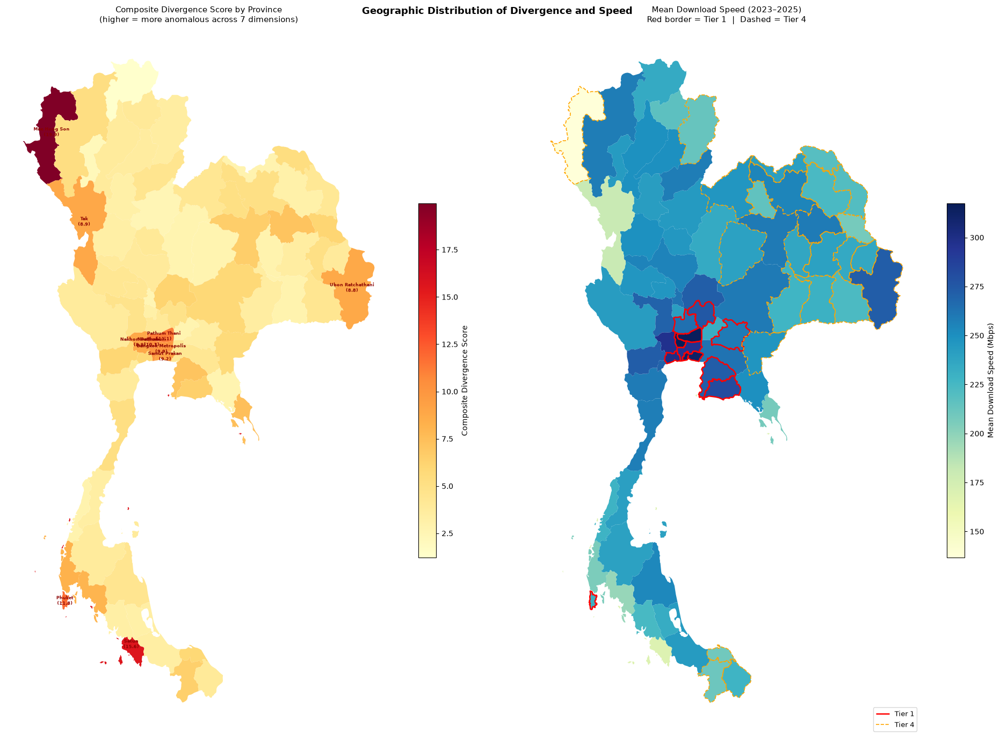

In [45]:
_GEOJSON = '../../data/geo/thailand_provinces.geojson'

# Load GeoDataFrame with correct path (fallback if earlier cells used old path)
try:
    if 'thailand_gdf' not in dir() or thailand_gdf is None:
        raise NameError
    _ = thailand_gdf.shape  # verify it's valid
except (NameError, Exception):
    thailand_gdf = gpd.read_file(_GEOJSON).to_crs(4326)
    print("Loaded thailand_gdf from correct project path")

geo_divergent = thailand_gdf.copy()
geo_divergent = geo_divergent.merge(
    divergent_df[['name','divergence_score','mean_dl','internet_tier']],
    on='name', how='left'
)
geo_divergent['divergence_score'] = geo_divergent['divergence_score'].fillna(0)

fig, axes = plt.subplots(1, 2, figsize=(20, 14))

# ── Left: divergence score choropleth ──────────────────────────────────────────
ax1 = axes[0]
geo_divergent.plot('divergence_score', ax=ax1, cmap='YlOrRd',
               legend=True, missing_kwds={'color':'lightgray'},
               legend_kwds={'label':'Composite Divergence Score','shrink':0.5})

top10_names = divergent_df.nlargest(10, 'divergence_score')['name'].values
for _, row in geo_divergent.iterrows():
    if row['name'] in top10_names:
        c = row.geometry.centroid
        score = row['divergence_score']
        ax1.annotate(f"{row['name']}\n({score:.1f})",
                     (c.x, c.y), ha='center', va='center',
                     fontsize=5.5, color='darkred', fontweight='bold')

ax1.set_title('Composite Divergence Score by Province\n(higher = more anomalous across 7 dimensions)',
              fontsize=11)
ax1.set_axis_off()

# ── Right: download speed choropleth with tier overlay ────────────────────────
ax2 = axes[1]
geo_divergent.plot('mean_dl', ax=ax2, cmap='YlGnBu',
               legend=True, missing_kwds={'color':'lightgray'},
               legend_kwds={'label':'Mean Download Speed (Mbps)','shrink':0.5})

t1 = geo_divergent[geo_divergent['internet_tier'] == 1]
t1.boundary.plot(ax=ax2, color='red', linewidth=1.8, label='Tier 1')
t4 = geo_divergent[geo_divergent['internet_tier'] == 4]
t4.boundary.plot(ax=ax2, color='orange', linewidth=1.2, ls='--', label='Tier 4')

ax2.legend(fontsize=9, loc='lower right')
ax2.set_title('Mean Download Speed (2023–2025)\nRed border = Tier 1  |  Dashed = Tier 4',
              fontsize=11)
ax2.set_axis_off()

plt.suptitle('Geographic Distribution of Divergence and Speed', fontsize=13, fontweight='bold')
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/27_divergence_map.png', dpi=150, bbox_inches='tight')
plt.show()


### 24. Why Are They Divergent? — Annotated Province Notes

### 25. Full Province Divergence Table — All 77 Provinces


In [46]:
# ── Merge Thai name ────────────────────────────────────────────────────────────
full_table = divergent_df.copy()
full_table = full_table.merge(
    prov_ref[['province_en','province_th']].rename(columns={'province_en':'name'}),
    on='name', how='left'
)

# ── Generate verdict ───────────────────────────────────────────────────────────
_DIM_ORDER = ['regional_z','gdp_residual_z','den_residual_z','tier_residual_z',
              'ratio_z','lat_regional_z','coverage_z']

def _note(d, v, region, tier):
    if d == 'gdp_residual_z':
        return f"fast for GDP (+{v:.1f}σ)" if v > 0 else f"slow for GDP ({v:.1f}σ)"
    if d == 'den_residual_z':
        return f"fast for density (+{v:.1f}σ)" if v > 0 else f"slow for density ({v:.1f}σ)"
    if d == 'tier_residual_z':
        return f"overperforms Tier {tier} (+{v:.1f}σ)" if v > 0 else f"underperforms Tier {tier} ({v:.1f}σ)"
    if d == 'regional_z':
        return f"fast vs {region} (+{v:.1f}σ)" if v > 0 else f"slow vs {region} ({v:.1f}σ)"
    if d == 'ratio_z':
        return f"symmetric UL/DL (+{v:.1f}σ)" if v > 0 else f"asymmetric UL/DL ({v:.1f}σ)"
    if d == 'lat_regional_z':
        return f"high latency (+{v:.1f}σ)" if v > 0 else f"ultra-low latency ({v:.1f}σ)"
    if d == 'coverage_z':
        return f"over-tested (+{v:.1f}σ)" if v > 0 else f"under-tested ({v:.1f}σ)"
    return f"{d}:{v:.1f}σ"

def make_verdict(r):
    region = r['region']
    tier   = int(r['internet_tier'])
    signals = [(abs(r[d]), d, r[d]) for d in _DIM_ORDER if abs(r[d]) >= 1.0]
    signals.sort(reverse=True)
    if not signals:
        return "unremarkable"
    return " | ".join(_note(d, v, region, tier) for _, d, v in signals[:3])

full_table['verdict'] = full_table.apply(make_verdict, axis=1)

# ── Table 0: Overall ranking (top 20) ─────────────────────────────────────────
from IPython.display import display, HTML

display(HTML("<h3>Overall Divergence Ranking — Top 20</h3>"))
t0 = (full_table.nlargest(20, 'divergence_score')
      [['name','province_th','region','internet_tier','mean_dl','divergence_score','verdict']]
      .rename(columns={'name':'Province','province_th':'จังหวัด','region':'Region',
                       'internet_tier':'Tier','mean_dl':'DL Mbps','divergence_score':'Score','verdict':'Why Divergent?'})
      .reset_index(drop=True))
t0.index += 1
tier_palette = {1:'#ffcccc', 2:'#ffe4b5', 3:'#d4f0d4', 4:'#dce0f5'}
styled0 = (t0.style
    .background_gradient(subset=['Score'], cmap='YlOrRd', vmin=0, vmax=20)
    .background_gradient(subset=['DL Mbps'], cmap='YlGn', vmin=110, vmax=330)
    .map(lambda v: f"background-color:{tier_palette.get(int(v),'#fff')}", subset=['Tier'])
    .set_properties(**{'font-size':'11px','text-align':'left'})
    .set_properties(subset=['Why Divergent?'], **{'min-width':'320px','font-size':'10px'})
    .set_table_styles([
        {'selector':'th','props':[('background','#f0f0f0'),('font-size','10px'),('padding','4px 6px')]},
        {'selector':'td','props':[('padding','3px 6px'),('border','1px solid #ddd')]},
    ]))
display(styled0)

# ── Tables 1-7: Per-dimension top 8 over / bottom 8 under ─────────────────────
dim_meta = {
    'regional_z':      ('Regional Speed', 'fast vs region peers', 'slow vs region peers'),
    'gdp_residual_z':  ('GDP Gap', 'fast for GDP level', 'slow for GDP level'),
    'den_residual_z':  ('Density Gap', 'fast for density', 'slow for density'),
    'tier_residual_z': ('Tier Gap', 'overperforms tier', 'underperforms tier'),
    'ratio_z':         ('UL/DL Ratio', 'symmetric (fiber)', 'asymmetric (legacy)'),
    'lat_regional_z':  ('Latency (regional)', 'high latency', 'ultra-low latency'),
    'coverage_z':      ('Test Coverage', 'over-tested', 'under-tested'),
}

base_cols = ['name','province_th','region','internet_tier','mean_dl']

for dim, (title, over_label, under_label) in dim_meta.items():
    display(HTML(f"<h3>Dimension: {title} <small style='color:#888'>({dim})</small></h3>"))
    
    sub = full_table[base_cols + [dim, 'divergence_score']].copy()
    sub = sub.rename(columns={
        'name':'Province','province_th':'จังหวัด','region':'Region',
        'internet_tier':'Tier','mean_dl':'DL Mbps',
        dim:'z-score','divergence_score':'Total Score'
    })
    
    over  = sub.nlargest(8, 'z-score').copy()
    under = sub.nsmallest(8, 'z-score').copy()
    over['signal']  = over_label
    under['signal'] = under_label
    
    combined = pd.concat([over, under], ignore_index=True)
    combined = combined[['Province','จังหวัด','Region','Tier','DL Mbps','z-score','signal','Total Score']]
    combined['z-score'] = combined['z-score'].round(2)
    combined['DL Mbps'] = combined['DL Mbps'].round(1)
    combined['Total Score'] = combined['Total Score'].round(2)
    
    styled_dim = (combined.style
        .background_gradient(subset=['z-score'], cmap='RdBu_r', vmin=-4, vmax=4)
        .background_gradient(subset=['DL Mbps'], cmap='YlGn', vmin=110, vmax=330)
        .map(lambda v: f"background-color:{tier_palette.get(int(v),'#fff')}", subset=['Tier'])
        .set_properties(**{'font-size':'11px','text-align':'left'})
        .set_table_styles([
            {'selector':'th','props':[('background','#f0f0f0'),('font-size','10px'),('padding','4px 6px')]},
            {'selector':'td','props':[('padding','3px 6px'),('border','1px solid #ddd')]},
        ])
        .hide(axis='index'))
    display(styled_dim)
    display(HTML("<hr style='margin:16px 0'>"))

print(f"Provinces: {len(full_table)}")
print(f"Score range: {full_table['divergence_score'].min():.2f} – {full_table['divergence_score'].max():.2f}")
print(f"|z|>2 in any dim: {(full_table[[*_DIM_ORDER]].abs() >= 2).any(axis=1).sum()}")
print(f"|z|>3 in any dim: {(full_table[[*_DIM_ORDER]].abs() >= 3).any(axis=1).sum()}")
print(f"Unremarkable: {(full_table[[*_DIM_ORDER]].abs() < 1.0).all(axis=1).sum()}")

# Save styled table as HTML
_html_path = '../../outputs/ookla/28_divergence_table.html'
with open(_html_path, 'w') as _f:
    _f.write(styled0.to_html())
print(f"Saved: {_html_path}")


,Province,จังหวัด,Region,Tier,DL Mbps,Score,Why Divergent?
1,Mae Hong Son,แม่ฮ่องสอน,Northern,4,136.655103,19.936517,high latency (+3.9σ) | underperforms Tier 4 (-3.9σ) | slow for GDP (-3.5σ)
2,Satun,สตูล,Southern,3,169.092662,15.563434,underperforms Tier 3 (-3.0σ) | slow for density (-3.0σ) | slow for GDP (-2.8σ)
3,Phuket,ภูเก็ต,Southern,1,230.244602,11.779861,over-tested (+4.3σ) | slow for density (-2.2σ) | underperforms Tier 1 (-1.7σ)
4,Pathum Thani,ปทุมธานี,Bangkok & Vicinity,1,315.191678,11.094205,over-tested (+2.2σ) | fast for GDP (+2.2σ) | asymmetric UL/DL (-1.7σ)
5,Nonthaburi,นนทบุรี,Bangkok & Vicinity,1,317.288708,10.314853,fast for GDP (+2.5σ) | over-tested (+2.4σ) | asymmetric UL/DL (-1.6σ)
6,Bangkok Metropolis,กรุงเทพมหานคร,Bangkok & Vicinity,1,295.458374,9.850224,over-tested (+3.9σ) | asymmetric UL/DL (-1.6σ) | high latency (+1.5σ)
7,Samut Prakan,สมุทรปราการ,Bangkok & Vicinity,1,312.041120,9.159415,over-tested (+2.4σ) | asymmetric UL/DL (-2.2σ) | fast for GDP (+1.8σ)
8,Nakhon Pathom,นครปฐม,Bangkok & Vicinity,2,296.965653,8.865634,overperforms Tier 2 (+2.1σ) | asymmetric UL/DL (-1.4σ) | fast for GDP (+1.2σ)
9,Tak,ตาก,Northern,3,181.050407,8.864315,underperforms Tier 3 (-2.5σ) | slow for GDP (-2.3σ) | slow vs Northern (-1.7σ)
10,Ubon Ratchathani,อุบลราชธานี,Northeastern,4,272.181303,8.818735,fast vs Northeastern (+2.1σ) | overperforms Tier 4 (+1.9σ) | fast for GDP (+1.7σ)


Province,จังหวัด,Region,Tier,DL Mbps,z-score,signal,Total Score
Ubon Ratchathani,อุบลราชธานี,Northeastern,4,272.200000,2.070000,fast vs region peers,8.820000
Nakhon Si Thammarat,นครศรีธรรมราช,Southern,3,253.300000,1.450000,fast vs region peers,4.480000
Rayong,ระยอง,Eastern,1,281.800000,1.360000,fast vs region peers,6.420000
Khon Kaen,ขอนแก่น,Northeastern,3,260.100000,1.350000,fast vs region peers,6.610000
Nakhon Ratchasima,นครราชสีมา,Northeastern,3,259.500000,1.320000,fast vs region peers,5.850000
Kalasin,กาฬสินธุ์,Northeastern,4,258.800000,1.280000,fast vs region peers,7.150000
Nonthaburi,นนทบุรี,Bangkok & Vicinity,1,317.300000,1.250000,fast vs region peers,10.310000
Saraburi,สระบุรี,Central,1,275.500000,1.220000,fast vs region peers,4.840000
Mae Hong Son,แม่ฮ่องสอน,Northern,4,136.700000,-3.140000,slow vs region peers,19.940000
Satun,สตูล,Southern,3,169.100000,-2.500000,slow vs region peers,15.560000


Province,จังหวัด,Region,Tier,DL Mbps,z-score,signal,Total Score
Nonthaburi,นนทบุรี,Bangkok & Vicinity,1,317.300000,2.470000,fast for GDP level,10.310000
Pathum Thani,ปทุมธานี,Bangkok & Vicinity,1,315.200000,2.190000,fast for GDP level,11.090000
Samut Prakan,สมุทรปราการ,Bangkok & Vicinity,1,312.000000,1.830000,fast for GDP level,9.160000
Ubon Ratchathani,อุบลราชธานี,Northeastern,4,272.200000,1.700000,fast for GDP level,8.820000
Suphan Buri,สุพรรณบุรี,Western,3,270.400000,1.270000,fast for GDP level,4.790000
Kalasin,กาฬสินธุ์,Northeastern,4,258.800000,1.190000,fast for GDP level,7.150000
Nakhon Pathom,นครปฐม,Bangkok & Vicinity,2,297.000000,1.180000,fast for GDP level,8.870000
Lop Buri,ลพบุรี,Central,3,271.700000,1.010000,fast for GDP level,6.190000
Mae Hong Son,แม่ฮ่องสอน,Northern,4,136.700000,-3.470000,slow for GDP level,19.940000
Satun,สตูล,Southern,3,169.100000,-2.800000,slow for GDP level,15.560000


Province,จังหวัด,Region,Tier,DL Mbps,z-score,signal,Total Score
Uttaradit,อุตรดิตถ์,Northern,3,258.600000,1.460000,fast for density,4.530000
Lop Buri,ลพบุรี,Central,3,271.700000,1.360000,fast for density,6.190000
Pathum Thani,ปทุมธานี,Bangkok & Vicinity,1,315.200000,1.340000,fast for density,11.090000
Ubon Ratchathani,อุบลราชธานี,Northeastern,4,272.200000,1.320000,fast for density,8.820000
Rayong,ระยอง,Eastern,1,281.800000,1.180000,fast for density,6.420000
Phetchaburi,เพชรบุรี,Western,3,258.800000,1.170000,fast for density,3.820000
Nakhon Pathom,นครปฐม,Bangkok & Vicinity,2,297.000000,1.160000,fast for density,8.870000
Chiang Mai,เชียงใหม่,Northern,2,258.400000,1.120000,fast for density,5.280000
Satun,สตูล,Southern,3,169.100000,-2.970000,slow for density,15.560000
Mae Hong Son,แม่ฮ่องสอน,Northern,4,136.700000,-2.920000,slow for density,19.940000


Province,จังหวัด,Region,Tier,DL Mbps,z-score,signal,Total Score
Nakhon Pathom,นครปฐม,Bangkok & Vicinity,2,297.000000,2.070000,overperforms tier,8.870000
Ubon Ratchathani,อุบลราชธานี,Northeastern,4,272.200000,1.920000,overperforms tier,8.820000
Kalasin,กาฬสินธุ์,Northeastern,4,258.800000,1.350000,overperforms tier,7.150000
Nonthaburi,นนทบุรี,Bangkok & Vicinity,1,317.300000,1.320000,overperforms tier,10.310000
Pathum Thani,ปทุมธานี,Bangkok & Vicinity,1,315.200000,1.240000,overperforms tier,11.090000
Udon Thani,อุดรธานี,Northeastern,4,255.000000,1.180000,overperforms tier,5.090000
Samut Prakan,สมุทรปราการ,Bangkok & Vicinity,1,312.000000,1.130000,overperforms tier,9.160000
Lop Buri,ลพบุรี,Central,3,271.700000,1.110000,overperforms tier,6.190000
Mae Hong Son,แม่ฮ่องสอน,Northern,4,136.700000,-3.900000,underperforms tier,19.940000
Satun,สตูล,Southern,3,169.100000,-3.000000,underperforms tier,15.560000


Province,จังหวัด,Region,Tier,DL Mbps,z-score,signal,Total Score
Phichit,พิจิตร,Northern,3,245.600000,2.560000,symmetric (fiber),4.090000
Satun,สตูล,Southern,3,169.100000,2.470000,symmetric (fiber),15.560000
Mae Hong Son,แม่ฮ่องสอน,Northern,4,136.700000,2.230000,symmetric (fiber),19.940000
Uthai Thani,อุทัยธานี,Northern,3,246.500000,1.750000,symmetric (fiber),4.310000
Yasothon,ยโสธร,Northeastern,4,234.800000,1.600000,symmetric (fiber),5.090000
Phetchabun,เพชรบูรณ์,Northern,3,234.600000,1.550000,symmetric (fiber),2.710000
Phangnga,พังงา,Southern,2,205.100000,1.480000,symmetric (fiber),8.280000
Sukhothai,สุโขทัย,Northern,3,242.400000,1.370000,symmetric (fiber),3.250000
Samut Prakan,สมุทรปราการ,Bangkok & Vicinity,1,312.000000,-2.150000,asymmetric (legacy),9.160000
Pathum Thani,ปทุมธานี,Bangkok & Vicinity,1,315.200000,-1.680000,asymmetric (legacy),11.090000


Province,จังหวัด,Region,Tier,DL Mbps,z-score,signal,Total Score
Mae Hong Son,แม่ฮ่องสอน,Northern,4,136.700000,3.930000,high latency,19.940000
Chai Nat,ชัยนาท,Central,3,246.100000,2.090000,high latency,4.210000
Amnat Charoen,อำนาจเจริญ,Northeastern,4,235.500000,1.900000,high latency,3.900000
Prachuap Khiri Khan,ประจวบคีรีขันธ์,Western,2,257.700000,1.900000,high latency,5.170000
Phangnga,พังงา,Southern,2,205.100000,1.630000,high latency,8.280000
Sa Kaeo,สระแก้ว,Eastern,4,247.100000,1.540000,high latency,5.690000
Yasothon,ยโสธร,Northeastern,4,234.800000,1.500000,high latency,5.090000
Bangkok Metropolis,กรุงเทพมหานคร,Bangkok & Vicinity,1,295.500000,1.460000,high latency,9.850000
Khon Kaen,ขอนแก่น,Northeastern,3,260.100000,-1.650000,ultra-low latency,6.610000
Nakhon Ratchasima,นครราชสีมา,Northeastern,3,259.500000,-1.590000,ultra-low latency,5.850000


Province,จังหวัด,Region,Tier,DL Mbps,z-score,signal,Total Score
Phuket,ภูเก็ต,Southern,1,230.200000,4.340000,over-tested,11.780000
Bangkok Metropolis,กรุงเทพมหานคร,Bangkok & Vicinity,1,295.500000,3.870000,over-tested,9.850000
Nonthaburi,นนทบุรี,Bangkok & Vicinity,1,317.300000,2.400000,over-tested,10.310000
Samut Prakan,สมุทรปราการ,Bangkok & Vicinity,1,312.000000,2.360000,over-tested,9.160000
Chon Buri,ชลบุรี,Eastern,1,272.600000,2.320000,over-tested,7.200000
Pathum Thani,ปทุมธานี,Bangkok & Vicinity,1,315.200000,2.220000,over-tested,11.090000
Rayong,ระยอง,Eastern,1,281.800000,1.410000,over-tested,6.420000
Samut Sakhon,สมุทรสาคร,Bangkok & Vicinity,1,299.900000,1.360000,over-tested,5.870000
Narathiwat,นราธิวาส,Southern,4,228.000000,-0.890000,under-tested,3.980000
Yasothon,ยโสธร,Northeastern,4,234.800000,-0.860000,under-tested,5.090000


Provinces: 77
Score range: 1.21 – 19.94
|z|>2 in any dim: 16
|z|>3 in any dim: 3
Unremarkable: 23
Saved: ../../outputs/ookla/28_divergence_table.html


## Export for Comparison Notebook
*Saves province × quarter data to CSV.*

In [47]:
# ── Export Ookla quarterly province data for comparison notebook ──
import os
os.makedirs("../../data/exports", exist_ok=True)

EXPORT_COLS = [
    "name", "label", "year", "quarter",
    "avg_d_mbps", "avg_u_mbps", "avg_lat_ms_wt",
    "total_tests", "n_tiles", "is_reliable",
    "region", "internet_tier", "pop_2024",
    "gdp_per_capita_thb_2021", "density_per_km2",
]
existing_cols = [c for c in EXPORT_COLS if c in master.columns]
out = master[existing_cols].copy()
out = out.rename(columns={"name": "province", "label": "quarter"})

PATH = "../../data/exports/ookla_province_quarterly.csv"
out.to_csv(PATH, index=False)
print(f"Exported {len(out)} rows → {PATH}")
print(out.head(3).to_string())


Exported 847 rows → ../../data/exports/ookla_province_quarterly.csv
             province  quarter  year  quarter  avg_d_mbps  avg_u_mbps  avg_lat_ms_wt  total_tests  n_tiles  is_reliable              region  internet_tier  pop_2024  gdp_per_capita_thb_2021  density_per_km2
0       Amnat Charoen  2023-Q1  2023        1  185.480056  168.348028      14.376910       2356.0    469.0         True        Northeastern              4    372000                253897.82              113
1           Ang Thong  2023-Q1  2023        1  226.013656  196.838461       5.186804       3501.0    559.0         True             Central              3    269000                468881.20              283
2  Bangkok Metropolis  2023-Q1  2023        1  255.961941  211.539010       6.082225     505379.0   3744.0         True  Bangkok & Vicinity              1   5456000               1957179.52             3488


---
# Part 2 — Mobile/Cellular


## Full EDA — Ookla Mobile/Cellular, Thailand (2023 Q1 – 2025 Q4)

### 1. Load & Aggregate All Quarters

In [48]:
import glob, os, warnings
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.ticker as mticker
from scipy import stats
warnings.filterwarnings('ignore')

DATASET_DIR = '../../data/ookla/raw'
GEOJSON     = '../../data/geo/thailand_provinces.geojson'
PROV_REF    = '../../data/reference/province_reference.csv'

# Ookla S3 filename convention: {YEAR}-{MM}-01_performance_mobile_tiles.parquet
# Q1=January(01), Q2=April(04), Q3=July(07), Q4=October(10)
Q_TO_MONTH = {1: 1, 2: 4, 3: 7, 4: 10}

thailand_gdf = gpd.read_file(GEOJSON).to_crs(4326)
state_bounds = thailand_gdf.total_bounds
bbox_filters = [
    ('tile_y', '<=', state_bounds[3]), ('tile_y', '>=', state_bounds[1]),
    ('tile_x', '<=', state_bounds[2]), ('tile_x', '>=', state_bounds[0]),
]

COLS = ['tile_x','tile_y','tests','devices','avg_d_kbps','avg_u_kbps','avg_lat_ms']

records = []
files = sorted(glob.glob(os.path.join(DATASET_DIR, '*mobile_tiles*.parquet')))

for fp in files:
    fname   = os.path.basename(fp)
    year    = int(fname[:4])
    quarter = int(fname[6])
    month   = Q_TO_MONTH[quarter]
    # period_start mirrors Ookla's original filename date (first day of the quarter)
    period_start = pd.Timestamp(year=year, month=month, day=1)
    label   = f"{year}-Q{quarter}"

    raw = pd.read_parquet(fp, columns=COLS, filters=bbox_filters)

    tiles_gdf = gpd.GeoDataFrame(
        raw,
        geometry=gpd.points_from_xy(raw.tile_x, raw.tile_y),
        crs='EPSG:4326'
    ).drop(columns=['tile_x','tile_y'])

    joined = gpd.sjoin(tiles_gdf, thailand_gdf[['name','geometry']], how='inner', predicate='intersects')

    agg = (
        joined.groupby('name')
        .apply(lambda g: pd.Series({
            'avg_d_kbps_wt': np.average(g['avg_d_kbps'], weights=g['tests']),
            'avg_u_kbps_wt': np.average(g['avg_u_kbps'], weights=g['tests']),
            'avg_lat_ms_wt': np.average(g['avg_lat_ms'], weights=g['tests']),
            'total_tests'  : g['tests'].sum(),
            'total_devices': g['devices'].sum(),
            'n_tiles'      : len(g),
        }), include_groups=False)
        .reset_index()
    )
    agg['year']         = year
    agg['quarter']      = quarter
    agg['month']        = month
    agg['period_start'] = period_start   # datetime: 2023-01-01, 2023-04-01, ...
    agg['label']        = label
    records.append(agg)
    print(f"  {label} ({period_start.date()}): {len(raw):>8,} raw tiles → {len(agg)} provinces")

master = pd.concat(records, ignore_index=True)
master['avg_d_mbps'] = master['avg_d_kbps_wt'] / 1000
master['avg_u_mbps'] = master['avg_u_kbps_wt'] / 1000
master.drop(columns=['avg_d_kbps_wt','avg_u_kbps_wt'], inplace=True)

# Merge province reference
prov_ref = pd.read_csv(PROV_REF)
prov_ref['gdp_per_capita_usd'] = (prov_ref['gdp_per_capita_thb_2021'] / 31).round(0)
master = master.merge(prov_ref.rename(columns={'province_en':'name'}), on='name', how='left')

print(f"\nMaster shape: {master.shape}")
print(f"Date range: {master['period_start'].min().date()} → {master['period_start'].max().date()}")
print(f"Quarters:   {sorted(master['label'].unique())}")
print(f"Provinces:  {master['name'].nunique()}")
print(f"\nperiod_start unique values (matches Ookla filename dates):")
for d in sorted(master['period_start'].unique()):
    print(f"  {pd.Timestamp(d).date()}")


  2023-Q1 (2023-01-01):  121,732 raw tiles → 77 provinces


  2023-Q2 (2023-04-01):  117,907 raw tiles → 77 provinces


  2023-Q3 (2023-07-01):  112,673 raw tiles → 77 provinces


  2023-Q4 (2023-10-01):  127,059 raw tiles → 77 provinces


  2024-Q1 (2024-01-01):  118,473 raw tiles → 77 provinces


  2024-Q2 (2024-04-01):  113,013 raw tiles → 77 provinces


  2024-Q3 (2024-07-01):  110,429 raw tiles → 77 provinces


  2024-Q4 (2024-10-01):  107,921 raw tiles → 77 provinces


  2025-Q1 (2025-01-01):   98,477 raw tiles → 77 provinces


  2025-Q2 (2025-04-01):  101,823 raw tiles → 77 provinces


  2025-Q3 (2025-07-01):   94,204 raw tiles → 77 provinces


  2025-Q4 (2025-10-01):   97,066 raw tiles → 77 provinces

Master shape: (924, 22)
Date range: 2023-01-01 → 2025-10-01
Quarters:   ['2023-Q1', '2023-Q2', '2023-Q3', '2023-Q4', '2024-Q1', '2024-Q2', '2024-Q3', '2024-Q4', '2025-Q1', '2025-Q2', '2025-Q3', '2025-Q4']
Provinces:  77

period_start unique values (matches Ookla filename dates):
  2023-01-01
  2023-04-01
  2023-07-01
  2023-10-01
  2024-01-01
  2024-04-01
  2024-07-01
  2024-10-01
  2025-01-01
  2025-04-01
  2025-07-01
  2025-10-01


In [49]:
# Quality flag per province × quarter
# Ookla: >= 100 tests AND >= 5 tiles → sufficient spatial + sample coverage
master['is_reliable'] = (
    (master['total_tests'] >= 100) &
    (master['n_tiles'] >= 5)
)
reliable_count = master.groupby('label')['is_reliable'].sum()
print('Reliable province-quarters per label:')
print(reliable_count.to_string())
print(f"\nOverall reliable: {master['is_reliable'].sum()} / {len(master)} ({master['is_reliable'].mean():.1%})")

Reliable province-quarters per label:
label
2023-Q1    77
2023-Q2    77
2023-Q3    77
2023-Q4    77
2024-Q1    77
2024-Q2    77
2024-Q3    77
2024-Q4    77
2025-Q1    77
2025-Q2    77
2025-Q3    77
2025-Q4    77

Overall reliable: 924 / 924 (100.0%)


### 2. Data Quality — Coverage per Province

In [50]:
# Expected: 77 provinces × 12 quarters = 924 rows
expected = 77 * master['label'].nunique()
print(f"Expected rows: {expected} | Actual: {len(master)} | Missing: {expected - len(master)}")

# Provinces with zero coverage in any quarter
all_provinces = set(thailand_gdf['name'])
all_labels    = set(master['label'].unique())
coverage_pivot = master.pivot_table(index='name', columns='label', values='total_tests', aggfunc='sum')

missing_cells = [(p, q) for p in all_provinces for q in all_labels
                 if p not in coverage_pivot.index or pd.isna(coverage_pivot.loc[p, q])]
if missing_cells:
    print(f"\nMissing province-quarter combos ({len(missing_cells)}):")
    for p, q in missing_cells:
        print(f"  {p} — {q}")
else:
    print("\nAll 77 provinces covered in every quarter.")

# Low-test provinces (< 100 tests in any quarter)
low_test = master[master['total_tests'] < 100][['name','label','total_tests','n_tiles']].sort_values('total_tests')
if len(low_test):
    print(f"\nLow-test quarters (< 100 tests) — {len(low_test)} cases:")
    print(low_test.to_string(index=False))
else:
    print("\nNo quarters with < 100 tests.")


Expected rows: 924 | Actual: 924 | Missing: 0

All 77 provinces covered in every quarter.

No quarters with < 100 tests.


In [51]:
# Drop unreliable province-quarters before any stats/plots use master downstream
master = master[master['is_reliable']].copy()
print(f"Filtered to reliable province-quarters: {len(master)} rows kept")

Filtered to reliable province-quarters: 924 rows kept


### 3. Speed Distribution — All Provinces, All Quarters

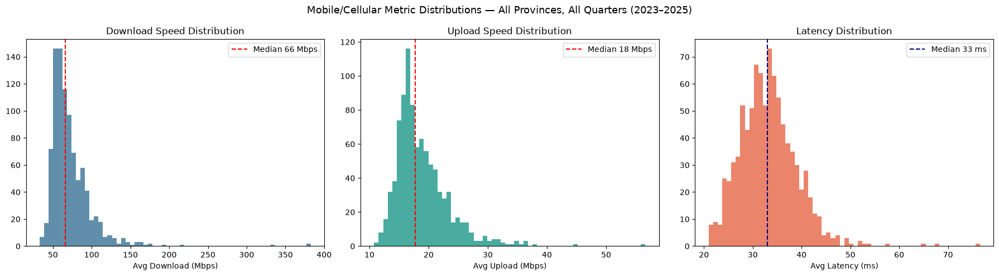

       avg_d_mbps  avg_u_mbps  avg_lat_ms_wt  total_tests
count      924.00      924.00         924.00       924.00
mean        72.49       18.84          33.21     11310.65
std         28.49        4.48           5.90     24640.24
min         32.83       10.79          20.97       747.00
25%         55.83       15.91          29.29      2676.00
50%         65.74       17.71          32.95      5151.00
75%         82.08       20.88          36.46     10233.25
max        382.83       56.63          76.53    274413.00


In [52]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].hist(master['avg_d_mbps'].dropna(), bins=60, color='#457b9d', edgecolor='none', alpha=0.85)
axes[0].axvline(master['avg_d_mbps'].median(), color='red', ls='--', lw=1.5, label=f'Median {master["avg_d_mbps"].median():.0f} Mbps')
axes[0].set_xlabel('Avg Download (Mbps)'); axes[0].set_title('Download Speed Distribution'); axes[0].legend()

axes[1].hist(master['avg_u_mbps'].dropna(), bins=60, color='#2a9d8f', edgecolor='none', alpha=0.85)
axes[1].axvline(master['avg_u_mbps'].median(), color='red', ls='--', lw=1.5, label=f'Median {master["avg_u_mbps"].median():.0f} Mbps')
axes[1].set_xlabel('Avg Upload (Mbps)'); axes[1].set_title('Upload Speed Distribution'); axes[1].legend()

axes[2].hist(master['avg_lat_ms_wt'].dropna(), bins=60, color='#e76f51', edgecolor='none', alpha=0.85)
axes[2].axvline(master['avg_lat_ms_wt'].median(), color='navy', ls='--', lw=1.5, label=f'Median {master["avg_lat_ms_wt"].median():.0f} ms')
axes[2].set_xlabel('Avg Latency (ms)'); axes[2].set_title('Latency Distribution'); axes[2].legend()

plt.suptitle('Mobile/Cellular Metric Distributions — All Provinces, All Quarters (2023–2025)', fontsize=13)
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/mobile/11_upload_speed_dist.png', dpi=150, bbox_inches='tight')
plt.show()

print(master[['avg_d_mbps','avg_u_mbps','avg_lat_ms_wt','total_tests']].describe().round(2))


### 4. Province Ranking — Mean Download Speed (All Quarters)

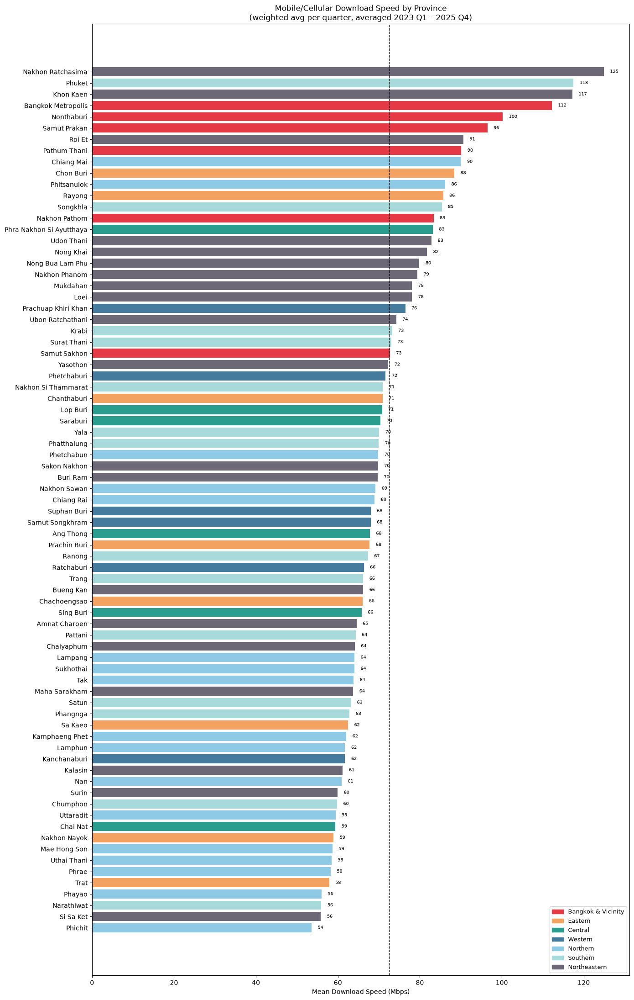

In [53]:
region_colors = {
    'Bangkok & Vicinity': '#e63946',
    'Eastern':            '#f4a261',
    'Central':            '#2a9d8f',
    'Western':            '#457b9d',
    'Northern':           '#8ecae6',
    'Southern':           '#a8dadc',
    'Northeastern':       '#6d6875',
}

prov_mean = (
    master.groupby(['name','region'])
    .agg(
        mean_dl=('avg_d_mbps','mean'),
        mean_ul=('avg_u_mbps','mean'),
        mean_lat=('avg_lat_ms_wt','mean'),
        mean_tests=('total_tests','mean'),
    )
    .reset_index()
    .sort_values('mean_dl', ascending=True)
)

fig, ax = plt.subplots(figsize=(14, 22))
colors = [region_colors.get(r,'gray') for r in prov_mean['region']]
bars = ax.barh(prov_mean['name'], prov_mean['mean_dl'], color=colors, edgecolor='none')

# Add value labels
for bar, val in zip(bars, prov_mean['mean_dl']):
    ax.text(bar.get_width() + 1.5, bar.get_y() + bar.get_height()/2,
            f'{val:.0f}', va='center', fontsize=7)

ax.axvline(prov_mean['mean_dl'].mean(), color='black', ls='--', lw=1, label=f'National mean {prov_mean["mean_dl"].mean():.0f} Mbps')
patches = [mpatches.Patch(color=v, label=k) for k, v in region_colors.items()]
ax.legend(handles=patches, loc='lower right', fontsize=9)
ax.set_xlabel('Mean Download Speed (Mbps)')
ax.set_title('Mobile/Cellular Download Speed by Province\n(weighted avg per quarter, averaged 2023 Q1 – 2025 Q4)', fontsize=12)
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/mobile/12_province_ranking_mean.png', dpi=150, bbox_inches='tight')
plt.show()


### 4.5 Province Ranking — Median Download Speed (All Quarters)

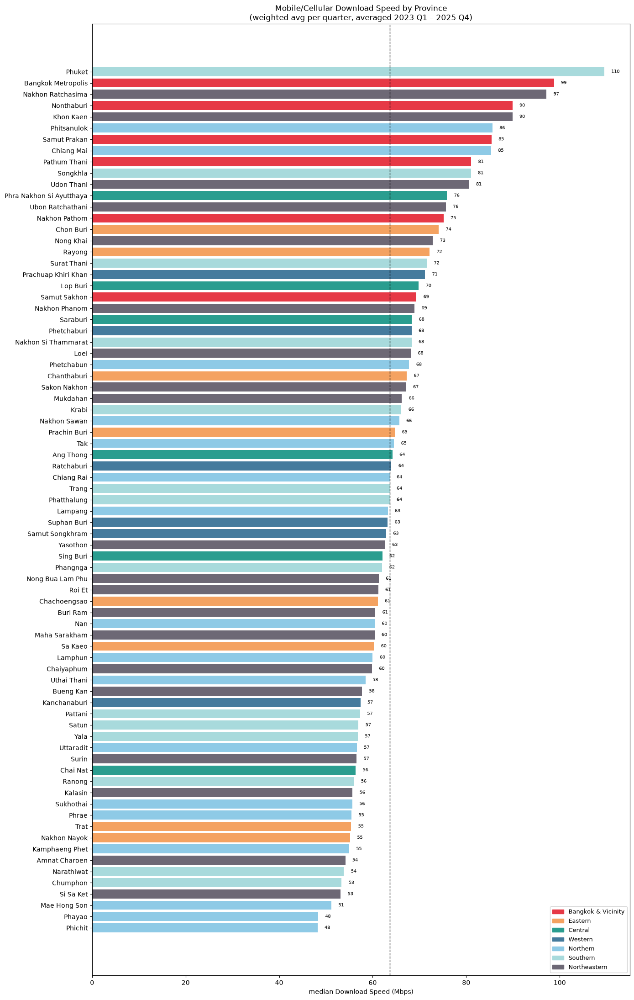

In [54]:
region_colors = {
    'Bangkok & Vicinity': '#e63946',
    'Eastern':            '#f4a261',
    'Central':            '#2a9d8f',
    'Western':            '#457b9d',
    'Northern':           '#8ecae6',
    'Southern':           '#a8dadc',
    'Northeastern':       '#6d6875',
}

prov_median = (
    master.groupby(['name','region'])
    .agg(
        median_dl=('avg_d_mbps','median'),
        median_ul=('avg_u_mbps','median'),
        median_lat=('avg_lat_ms_wt','median'),
        median_tests=('total_tests','median'),
    )
    .reset_index()
    .sort_values('median_dl', ascending=True)
)

fig, ax = plt.subplots(figsize=(14, 22))
colors = [region_colors.get(r,'gray') for r in prov_median['region']]
bars = ax.barh(prov_median['name'], prov_median['median_dl'], color=colors, edgecolor='none')

# Add value labels
for bar, val in zip(bars, prov_median['median_dl']):
    ax.text(bar.get_width() + 1.5, bar.get_y() + bar.get_height()/2,
            f'{val:.0f}', va='center', fontsize=7)

ax.axvline(prov_median['median_dl'].median(), color='black', ls='--', lw=1, label=f'National median {prov_median["median_dl"].median():.0f} Mbps')
patches = [mpatches.Patch(color=v, label=k) for k, v in region_colors.items()]
ax.legend(handles=patches, loc='lower right', fontsize=9)
ax.set_xlabel('median Download Speed (Mbps)')
ax.set_title('Mobile/Cellular Download Speed by Province\n(weighted avg per quarter, averaged 2023 Q1 – 2025 Q4)', fontsize=12)
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/mobile/12_province_ranking_median.png', dpi=150, bbox_inches='tight')
plt.show()


### 5. Time Series — Download Speed Heatmap (Province × Quarter)

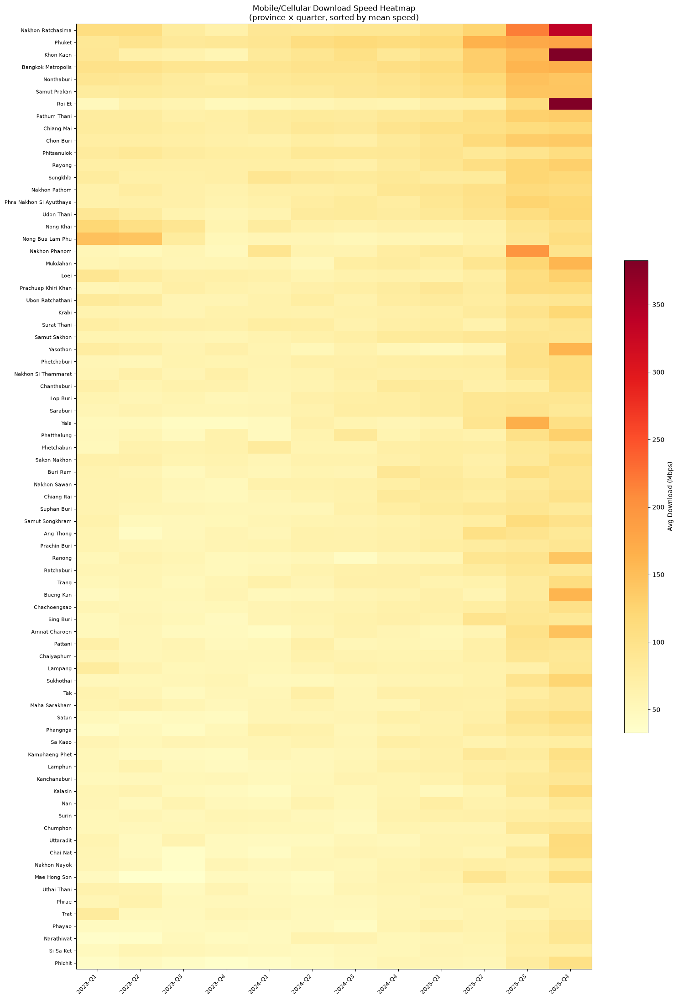

In [55]:
pivot_dl = master.pivot_table(index='name', columns='period_start', values='avg_d_mbps')
# Format column labels as quarter strings for display
pivot_dl.columns = [pd.Timestamp(c).strftime('%Y-Q') + str((pd.Timestamp(c).month-1)//3+1) for c in pivot_dl.columns]
# Sort by mean download speed
pivot_dl = pivot_dl.loc[prov_mean.sort_values('mean_dl', ascending=False)['name']]

fig, ax = plt.subplots(figsize=(16, 22))
im = ax.imshow(pivot_dl.values, aspect='auto', cmap='YlOrRd', interpolation='nearest')
plt.colorbar(im, ax=ax, label='Avg Download (Mbps)', shrink=0.5)

ax.set_xticks(range(len(pivot_dl.columns)))
ax.set_xticklabels(pivot_dl.columns, rotation=45, ha='right', fontsize=9)
ax.set_yticks(range(len(pivot_dl.index)))
ax.set_yticklabels(pivot_dl.index, fontsize=8)
ax.set_title('Mobile/Cellular Download Speed Heatmap\n(province × quarter, sorted by mean speed)', fontsize=12)
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/mobile/13_heatmap_quarterly.png', dpi=150, bbox_inches='tight')
plt.show()


### 6. Regional Comparison — Download, Upload, Latency

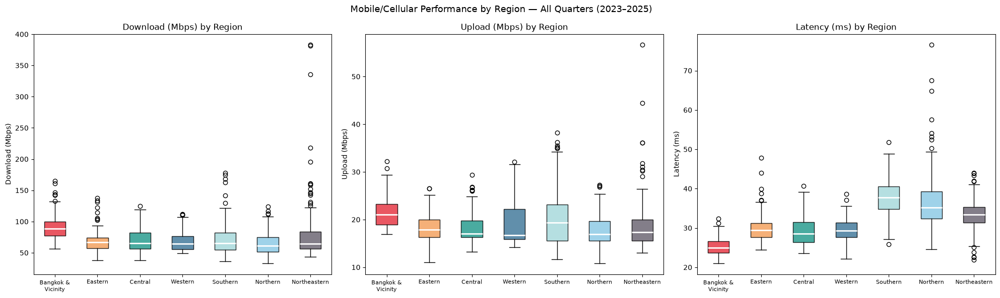

In [56]:
region_order = ['Bangkok & Vicinity','Eastern','Central','Western','Southern','Northern','Northeastern']
region_data  = [master[master['region']==r]['avg_d_mbps'].dropna().values for r in region_order]

fig, axes = plt.subplots(1, 3, figsize=(20, 6))

for ax, metric, label, color_key in [
    (axes[0], 'avg_d_mbps',   'Download (Mbps)', '#457b9d'),
    (axes[1], 'avg_u_mbps',   'Upload (Mbps)',   '#2a9d8f'),
    (axes[2], 'avg_lat_ms_wt','Latency (ms)',    '#e76f51'),
]:
    data = [master[master['region']==r][metric].dropna().values for r in region_order]
    bp = ax.boxplot(data, patch_artist=True, notch=False,
                    medianprops=dict(color='white', linewidth=2))
    for patch, region in zip(bp['boxes'], region_order):
        patch.set_facecolor(region_colors[region])
        patch.set_alpha(0.85)
    ax.set_xticklabels([r.replace(' & ',' &\n') for r in region_order], fontsize=8)
    ax.set_ylabel(label)
    ax.set_title(f'{label} by Region')

plt.suptitle('Mobile/Cellular Performance by Region — All Quarters (2023–2025)', fontsize=13)
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/mobile/14_regional_boxplot.png', dpi=150, bbox_inches='tight')
plt.show()


### 7. Download Speed Trend — Top, Bottom & Interesting Provinces

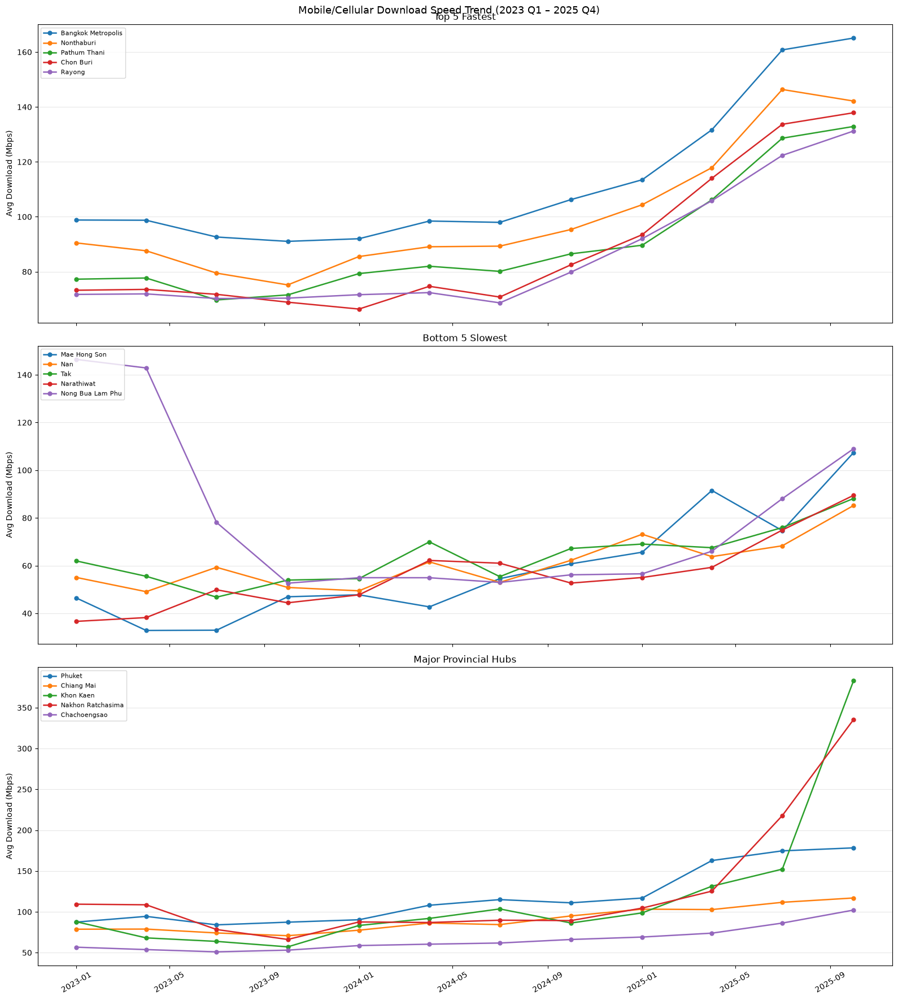

In [57]:
HIGHLIGHT = [
    # Top performers
    'Bangkok Metropolis','Nonthaburi','Pathum Thani','Chon Buri','Rayong',
    # Bottom performers  
    'Mae Hong Son','Nan','Tak','Narathiwat','Nong Bua Lam Phu',
    # Interesting (high GDP mismatch or border)
    'Phuket','Chiang Mai','Khon Kaen','Nakhon Ratchasima',
]

quarter_order = sorted(master['label'].unique())
fig, axes = plt.subplots(3, 1, figsize=(16, 18), sharex=True)

groups = [
    ('Top 5 Fastest', ['Bangkok Metropolis','Nonthaburi','Pathum Thani','Chon Buri','Rayong'], '#e63946'),
    ('Bottom 5 Slowest', ['Mae Hong Son','Nan','Tak','Narathiwat','Nong Bua Lam Phu'], '#6d6875'),
    ('Major Provincial Hubs', ['Phuket','Chiang Mai','Khon Kaen','Nakhon Ratchasima','Chachoengsao'], '#f4a261'),
]

for ax, (title, provinces, base_color) in zip(axes, groups):
    for i, prov in enumerate(provinces):
        df_p = master[master['name']==prov].sort_values('label')
        if df_p.empty: continue
        ax.plot(df_p['period_start'], df_p['avg_d_mbps'], marker='o', markersize=5,
                label=prov, linewidth=1.8)
    ax.set_ylabel('Avg Download (Mbps)')
    ax.set_title(title)
    ax.legend(fontsize=8, loc='upper left')
    ax.grid(axis='y', alpha=0.3)
    ax.tick_params(axis='x', rotation=30)

plt.suptitle('Mobile/Cellular Download Speed Trend (2023 Q1 – 2025 Q4)', fontsize=13)
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/mobile/15_time_series.png', dpi=150, bbox_inches='tight')
plt.show()


### 8. GDP per Capita vs Download Speed — Does Money = Speed?

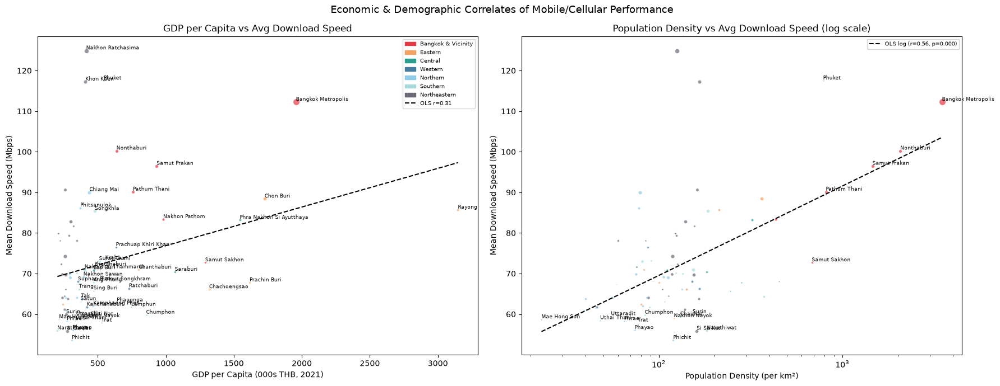

Pearson r (GDP vs download):     0.307  p=0.0066
Pearson r (log density vs download): 0.562  p=0.0000


In [58]:
corr_df = prov_mean.merge(
    prov_ref[['province_en','gdp_per_capita_thb_2021','internet_tier','pop_2024','density_per_km2']].rename(columns={'province_en':'name'}),
    on='name', how='left'
)

fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Scatter: GDP vs download
for _, row in corr_df.iterrows():
    c = region_colors.get(row['region'], 'gray')
    axes[0].scatter(row['gdp_per_capita_thb_2021']/1000, row['mean_dl'],
                    color=c, s=row['pop_2024']/80000, alpha=0.7, edgecolors='white', lw=0.5)
    # Label outliers
    if row['gdp_per_capita_thb_2021'] > 350000 or row['mean_dl'] > 200 or row['mean_dl'] < 60:
        axes[0].annotate(row['name'], (row['gdp_per_capita_thb_2021']/1000, row['mean_dl']),
                         fontsize=6.5, ha='left', va='bottom')

# OLS trendline
x = corr_df['gdp_per_capita_thb_2021'].dropna()/1000
y = corr_df.loc[x.index,'mean_dl']
slope, intercept, r, p, _ = stats.linregress(x, y)
xline = np.linspace(x.min(), x.max(), 100)
axes[0].plot(xline, slope*xline+intercept, 'k--', lw=1.5, label=f'OLS (r={r:.2f}, p={p:.3f})')
axes[0].set_xlabel('GDP per Capita (000s THB, 2021)')
axes[0].set_ylabel('Mean Download Speed (Mbps)')
axes[0].set_title('GDP per Capita vs Avg Download Speed')
patches = [mpatches.Patch(color=v, label=k) for k,v in region_colors.items()]
axes[0].legend(handles=patches+[plt.Line2D([0],[0],color='k',ls='--',label=f'OLS r={r:.2f}')], fontsize=7)

# Scatter: density vs download
for _, row in corr_df.iterrows():
    c = region_colors.get(row['region'],'gray')
    axes[1].scatter(row['density_per_km2'], row['mean_dl'],
                    color=c, s=row['pop_2024']/80000, alpha=0.7, edgecolors='white', lw=0.5)
    if row['density_per_km2'] > 500 or row['mean_dl'] > 200 or row['mean_dl'] < 60:
        axes[1].annotate(row['name'], (row['density_per_km2'], row['mean_dl']),
                         fontsize=6.5, ha='left', va='bottom')

x2 = corr_df['density_per_km2'].dropna()
y2 = corr_df.loc[x2.index,'mean_dl']
s2,i2,r2,p2,_ = stats.linregress(np.log1p(x2), y2)
xline2 = np.linspace(x2.min(), x2.max(), 200)
axes[1].plot(xline2, s2*np.log1p(xline2)+i2, 'k--', lw=1.5, label=f'OLS log (r={r2:.2f}, p={p2:.3f})')
axes[1].set_xlabel('Population Density (per km²)')
axes[1].set_xscale('log')
axes[1].set_ylabel('Mean Download Speed (Mbps)')
axes[1].set_title('Population Density vs Avg Download Speed (log scale)')
axes[1].legend(fontsize=7)

plt.suptitle('Economic & Demographic Correlates of Mobile/Cellular Performance', fontsize=13)
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/mobile/16_gdp_speed_scatter.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"Pearson r (GDP vs download):     {r:.3f}  p={p:.4f}")
print(f"Pearson r (log density vs download): {r2:.3f}  p={p2:.4f}")


NDT per tile , facebook , spilt , 

### 9. Upload/Download Ratio — Symmetry Check

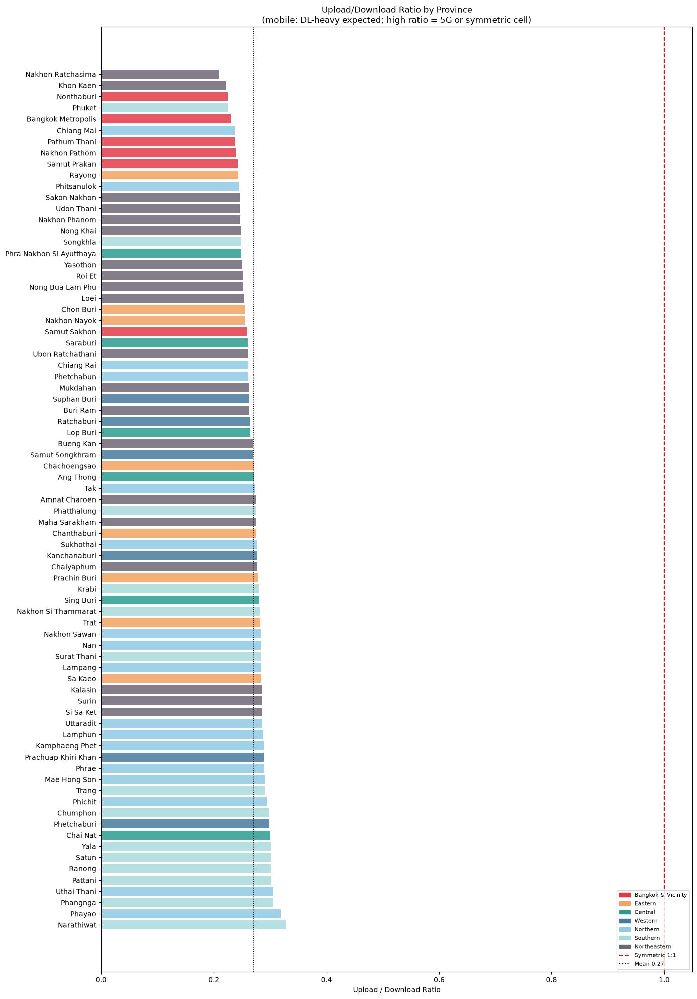

Provinces with UL/DL ratio > 0.5 (0):
Empty DataFrame
Columns: [name, region, ul_dl_ratio]
Index: []


In [59]:
master['ul_dl_ratio'] = master['avg_u_mbps'] / master['avg_d_mbps']

ratio_mean = master.groupby('name')['ul_dl_ratio'].mean().sort_values(ascending=False).reset_index()
ratio_mean = ratio_mean.merge(prov_ref[['province_en','region']].rename(columns={'province_en':'name'}), on='name', how='left')

fig, ax = plt.subplots(figsize=(14, 20))
colors = [region_colors.get(r,'gray') for r in ratio_mean['region']]
ax.barh(ratio_mean['name'], ratio_mean['ul_dl_ratio'], color=colors, alpha=0.85)
ax.axvline(1.0, color='red', ls='--', lw=1.5, label='Symmetric (1:1)')
ax.axvline(ratio_mean['ul_dl_ratio'].mean(), color='black', ls=':', lw=1, label=f'Mean ratio {ratio_mean["ul_dl_ratio"].mean():.2f}')
ax.set_xlabel('Upload / Download Ratio')
ax.set_title('Upload/Download Ratio by Province\n(mobile: DL-heavy expected; high ratio = 5G or symmetric cell)')
patches = [mpatches.Patch(color=v, label=k) for k,v in region_colors.items()]
ax.legend(handles=patches+[
    plt.Line2D([0],[0],color='red',ls='--',label='Symmetric 1:1'),
    plt.Line2D([0],[0],color='black',ls=':',label=f'Mean {ratio_mean["ul_dl_ratio"].mean():.2f}')
], fontsize=8, loc='lower right')
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/mobile/17_uldl_ratio_bar.png', dpi=150, bbox_inches='tight')
plt.show()

divergent_ratio = ratio_mean[ratio_mean['ul_dl_ratio'] > 0.5]
print(f"Provinces with UL/DL ratio > 0.5 ({len(divergent_ratio)}):")
print(divergent_ratio[['name','region','ul_dl_ratio']].to_string(index=False))


### 10. Anomaly Detection — Province Flags

In [60]:
# === ANOMALY DETECTION (recalibrated from actual data) ===
# National mean UL/DL ratio = 0.852 → flag only clear outliers (z-score based)
# Tier medians are compressed: T1=282, T2=247, T3=246, T4=229 Mbps
# Thresholds set based on observed distributions

from scipy import stats
import numpy as np

master['ul_dl_ratio'] = master['avg_u_mbps'] / master['avg_d_mbps']
high_ratio = master.groupby('name')['ul_dl_ratio'].mean()

prov_mean = (
    master.groupby(['name','region'])
    .agg(
        mean_dl=('avg_d_mbps','mean'),
        mean_ul=('avg_u_mbps','mean'),
        mean_lat=('avg_lat_ms_wt','mean'),
        mean_tests=('total_tests','mean'),
        mean_ratio=('ul_dl_ratio','mean'),
    )
    .reset_index()
    .sort_values('mean_dl', ascending=False)
)
prov_mean['tier'] = prov_mean['name'].map(prov_ref.set_index('province_en')['internet_tier'].to_dict())

tier_speed   = prov_mean.groupby('tier')['mean_dl'].median()
national_std = prov_mean['mean_dl'].std()


# infastructure mod

### 12. Full Province Summary Table

In [61]:
summary = prov_mean.merge(
    prov_ref[['province_en','pop_2024','gdp_per_capita_thb_2021','internet_tier']].rename(columns={'province_en':'name'}),
    on='name', how='left'
).copy()

summary['ul_dl_ratio'] = summary['name'].map(high_ratio).round(3)
summary = summary.sort_values('mean_dl', ascending=False).round(2)

print(summary[[
    'name','region','internet_tier',
    'mean_dl','mean_ul','mean_lat',
    'ul_dl_ratio','mean_tests',
    'gdp_per_capita_thb_2021'
]].to_string(index=False))

                    name             region  internet_tier  mean_dl  mean_ul  mean_lat  ul_dl_ratio  mean_tests  gdp_per_capita_thb_2021
       Nakhon Ratchasima       Northeastern              3   124.91    23.91     26.32         0.21    28186.67                415602.46
                  Phuket           Southern              1   117.51    25.98     40.88         0.22    20031.17                544858.10
               Khon Kaen       Northeastern              3   117.24    23.24     29.92         0.22    16409.08                410231.09
      Bangkok Metropolis Bangkok & Vicinity              1   112.25    25.22     24.28         0.23   201982.17               1957179.52
              Nonthaburi Bangkok & Vicinity              1   100.24    21.95     23.17         0.22    26508.83                638109.06
            Samut Prakan Bangkok & Vicinity              1    96.49    22.87     25.44         0.24    42520.17                933102.81
                  Roi Et       Northeaste

### 13. UL/DL Symmetry — Mobile Network Quality Indicator

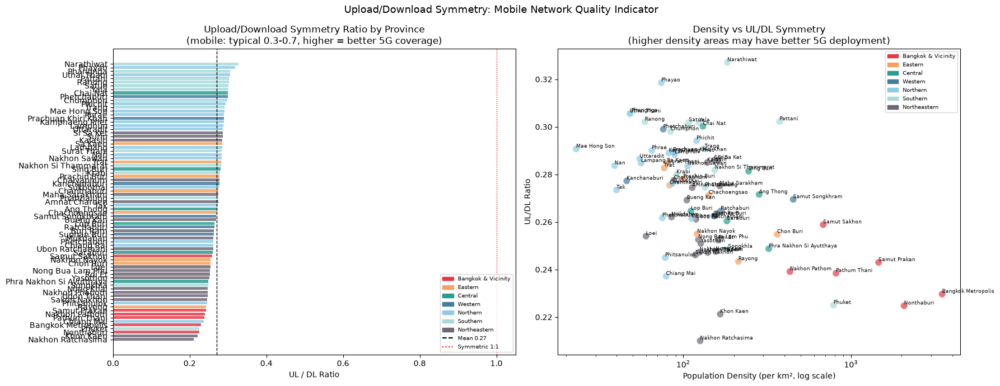

Provinces ratio > 0.5 (relatively symmetric mobile): 0 out of 77
Bangkok metro mean ratio: 0.239
Northeastern mean ratio: 0.258


In [62]:
# Mobile UL/DL ratio: typically 0.3-0.7 (DL-heavy by design)
# 5G NR can be more symmetric; high ratio may indicate 5G coverage

fig, axes = plt.subplots(1, 2, figsize=(18, 7))

ratio_sorted = prov_mean.sort_values('mean_ratio', ascending=True)
colors = [region_colors.get(r,'gray') for r in ratio_sorted['region']]
axes[0].barh(ratio_sorted['name'], ratio_sorted['mean_ratio'], color=colors, alpha=0.85)
axes[0].axvline(prov_mean['mean_ratio'].mean(), color='black', ls='--', lw=1,
                label=f"National mean {prov_mean['mean_ratio'].mean():.2f}")
axes[0].axvline(1.0, color='red', ls=':', lw=1, label='Symmetric 1:1')
axes[0].set_xlabel('UL / DL Ratio')
axes[0].set_title('Upload/Download Symmetry Ratio by Province\n(mobile: typical 0.3-0.7, higher = better 5G coverage)')
patches = [mpatches.Patch(color=v,label=k) for k,v in region_colors.items()]
axes[0].legend(handles=patches + [
    plt.Line2D([0],[0],color='black',ls='--',label=f'Mean {prov_mean["mean_ratio"].mean():.2f}'),
    plt.Line2D([0],[0],color='red',ls=':',label='Symmetric 1:1'),
], fontsize=7, loc='lower right')

# Bangkok vs rural: BKK has LOWER ratio (older infra mix) vs rural fiber-only
axes[1].scatter(prov_ref.set_index('province_en').loc[prov_mean['name'],'density_per_km2'].values,
                prov_mean['mean_ratio'].values,
                c=[region_colors.get(r,'gray') for r in prov_mean['region']],
                s=80, alpha=0.7, edgecolors='white', lw=0.5)
for _, row in prov_mean.iterrows():
    if row['mean_ratio'] > 0.91 or row['mean_ratio'] < 0.81 or row['mean_dl'] > 300:
        density = prov_ref.loc[prov_ref['province_en']==row['name'],'density_per_km2'].values
        if len(density):
            axes[1].annotate(row['name'], (density[0], row['mean_ratio']),
                             fontsize=6.5, ha='left', va='bottom')
axes[1].set_xscale('log')
axes[1].set_xlabel('Population Density (per km², log scale)')
axes[1].set_ylabel('UL/DL Ratio')
axes[1].set_title('Density vs UL/DL Symmetry\n(higher density areas may have better 5G deployment)')
axes[1].legend(handles=patches, fontsize=7)

plt.suptitle('Upload/Download Symmetry: Mobile Network Quality Indicator', fontsize=13)
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/mobile/19_uldl_symmetry_ratio.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"Provinces ratio > 0.5 (relatively symmetric mobile): {(prov_mean['mean_ratio'] > 0.5).sum()} out of 77")
print(f"Bangkok metro mean ratio: {prov_mean[prov_mean['region']=='Bangkok & Vicinity']['mean_ratio'].mean():.3f}")
print(f"Northeastern mean ratio: {prov_mean[prov_mean['region']=='Northeastern']['mean_ratio'].mean():.3f}")


### 14. Temporal: Speed Growth 2023 Q1 → 2025 Q4

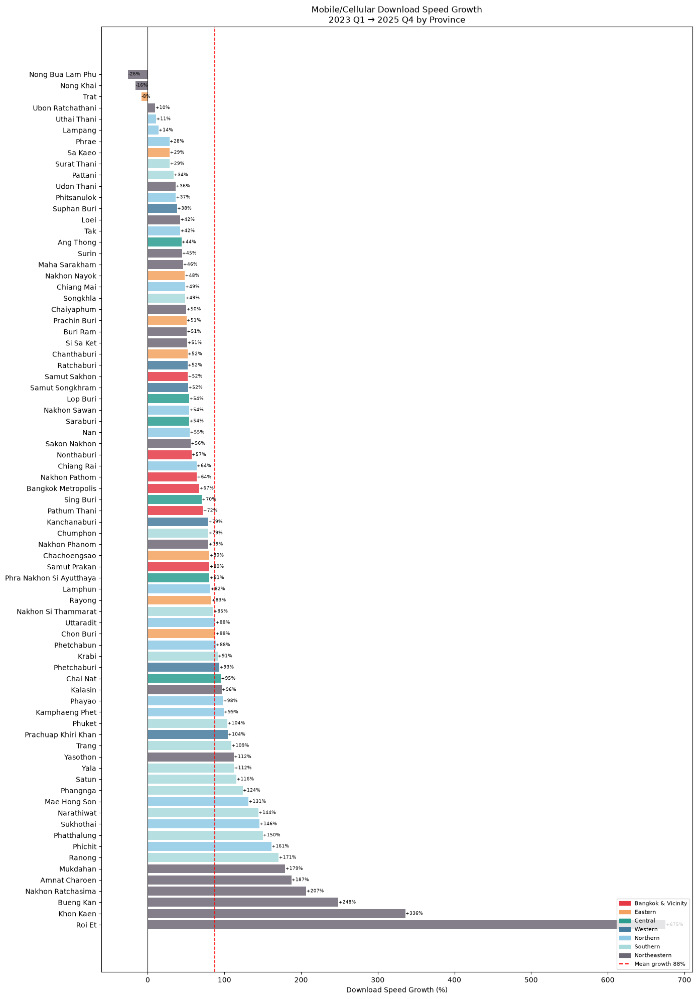

Top 10 fastest growing provinces:
             name       region  internet_tier  pct_growth
           Roi Et Northeastern              4  675.484254
        Khon Kaen Northeastern              3  335.887440
        Bueng Kan Northeastern              4  248.498975
Nakhon Ratchasima Northeastern              3  206.684837
    Amnat Charoen Northeastern              4  187.250286
         Mukdahan Northeastern              4  179.303083
           Ranong     Southern              3  170.812464
          Phichit     Northern              3  161.400753
      Phatthalung     Southern              3  149.985065
        Sukhothai     Northern              3  145.536782

Bottom 5 (slowest growth or decline):
            name       region  internet_tier  pct_growth
Nong Bua Lam Phu Northeastern              4  -25.578299
       Nong Khai Northeastern              4  -15.976810
            Trat      Eastern              2   -8.400612
Ubon Ratchathani Northeastern              4    9.730167
    

In [63]:
first = master[master['label']=='2023-Q1'].set_index('name')['avg_d_mbps']
last  = master[master['label']=='2025-Q4'].set_index('name')['avg_d_mbps']
growth = ((last - first) / first * 100).dropna().sort_values(ascending=False)

growth_df = growth.reset_index()
growth_df.columns = ['name','pct_growth']
growth_df = growth_df.merge(prov_ref[['province_en','region','internet_tier']].rename(columns={'province_en':'name'}), on='name', how='left')

fig, ax = plt.subplots(figsize=(14, 20))
colors = [region_colors.get(r,'gray') for r in growth_df['region']]
bars = ax.barh(growth_df['name'], growth_df['pct_growth'], color=colors, alpha=0.85)
ax.axvline(0, color='black', lw=0.8)
ax.axvline(growth_df['pct_growth'].mean(), color='red', ls='--', lw=1.2,
           label=f"Mean growth {growth_df['pct_growth'].mean():.0f}%")
for bar, val in zip(bars, growth_df['pct_growth']):
    ax.text(bar.get_width() + 0.3, bar.get_y() + bar.get_height()/2,
            f'{val:+.0f}%', va='center', fontsize=6.5)
patches = [mpatches.Patch(color=v,label=k) for k,v in region_colors.items()]
ax.legend(handles=patches+[plt.Line2D([0],[0],color='red',ls='--',label=f'Mean growth {growth_df["pct_growth"].mean():.0f}%')],
          fontsize=8, loc='lower right')
ax.set_xlabel('Download Speed Growth (%)')
ax.set_title('Mobile/Cellular Download Speed Growth\n2023 Q1 → 2025 Q4 by Province', fontsize=12)
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/mobile/20_density_vs_speed.png', dpi=150, bbox_inches='tight')
plt.show()

print("Top 10 fastest growing provinces:")
print(growth_df.nlargest(10,'pct_growth')[['name','region','internet_tier','pct_growth']].to_string(index=False))
print("\nBottom 5 (slowest growth or decline):")
print(growth_df.nsmallest(5,'pct_growth')[['name','region','internet_tier','pct_growth']].to_string(index=False))


### 15. Deep Dive — The Divergent Ones

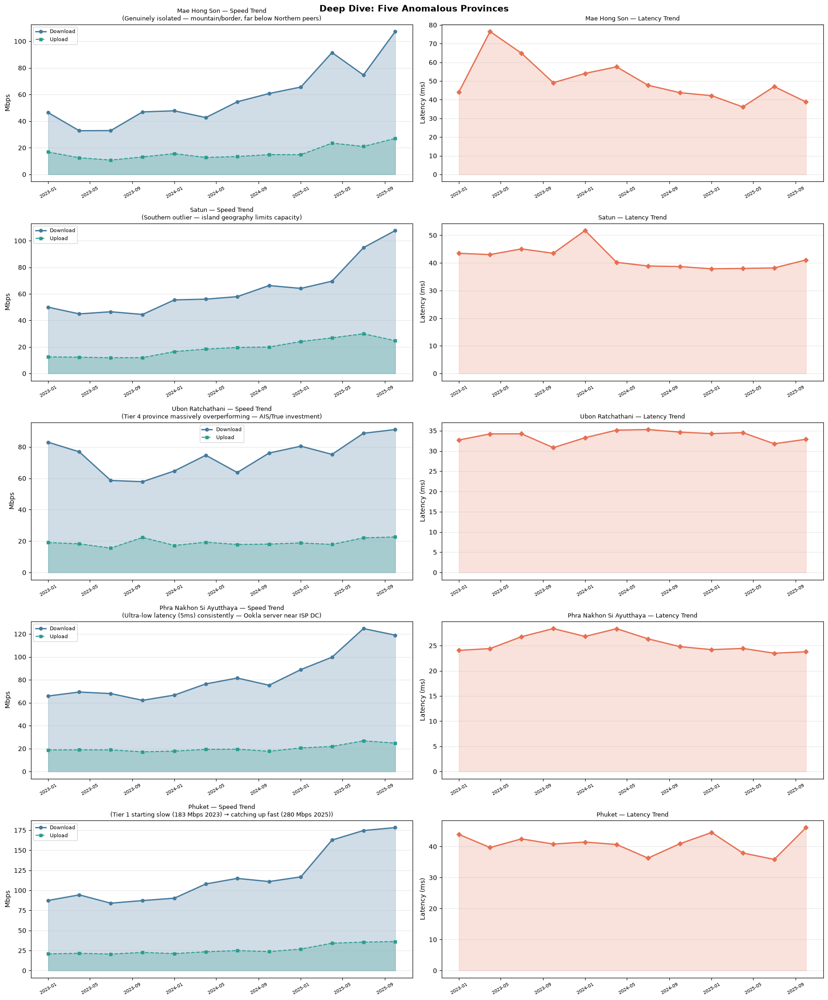

In [64]:
# Focus on 5 provinces that stand out most
DIVERGENT = {
    'Mae Hong Son':              'Genuinely isolated — mountain/border, far below Northern peers',
    'Satun':                     'Southern outlier — island geography limits capacity',
    'Ubon Ratchathani':          'Tier 4 province massively overperforming — AIS/True investment',
    'Phra Nakhon Si Ayutthaya':  'Ultra-low latency (5ms) consistently — Ookla server near ISP DC',
    'Phuket':                    'Tier 1 starting slow (183 Mbps 2023) → catching up fast (280 Mbps 2025)',
}

fig, axes = plt.subplots(len(DIVERGENT), 2, figsize=(18, 22))

quarter_order = sorted(master['label'].unique())

for ax_row, (prov, note) in zip(axes, DIVERGENT.items()):
    df_p = master[master['name']==prov].sort_values('label')
    
    # Download + upload trend
    ax_row[0].fill_between(df_p['period_start'], df_p['avg_d_mbps'], alpha=0.25, color='#457b9d')
    ax_row[0].plot(df_p['period_start'], df_p['avg_d_mbps'], 'o-', color='#457b9d', label='Download', lw=2, markersize=5)
    ax_row[0].fill_between(df_p['period_start'], df_p['avg_u_mbps'], alpha=0.25, color='#2a9d8f')
    ax_row[0].plot(df_p['period_start'], df_p['avg_u_mbps'], 's--', color='#2a9d8f', label='Upload', lw=1.5, markersize=4)
    ax_row[0].set_title(f'{prov} — Speed Trend\n({note})', fontsize=9)
    ax_row[0].set_ylabel('Mbps'); ax_row[0].legend(fontsize=8); ax_row[0].grid(axis='y', alpha=0.3)
    ax_row[0].tick_params(axis='x', rotation=30, labelsize=7)
    
    # Latency trend
    ax_row[1].plot(df_p['period_start'], df_p['avg_lat_ms_wt'], 'D-', color='#e76f51', lw=2, markersize=5)
    ax_row[1].fill_between(df_p['period_start'], df_p['avg_lat_ms_wt'], alpha=0.2, color='#e76f51')
    ax_row[1].set_title(f'{prov} — Latency Trend', fontsize=9)
    ax_row[1].set_ylabel('Latency (ms)'); ax_row[1].grid(axis='y', alpha=0.3)
    ax_row[1].tick_params(axis='x', rotation=30, labelsize=7)

plt.suptitle('Deep Dive: Five Anomalous Provinces', fontsize=14, fontweight='bold')
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/mobile/21_deep_dive_divergent.png', dpi=150, bbox_inches='tight')
plt.show()


### 16. EDA Key Findings Summary

## Key Findings from EDA

---

In [65]:
from scipy import stats as scipy_stats
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import geopandas as gpd
import warnings
warnings.filterwarnings('ignore')

_DATA_ROOT = '/home/chissanupun/Desktop/Code/lab/cnc/ds/internet-measurement/data'

# Fallback: load master and prov_ref if not already in scope
if 'master' not in dir() or master is None:
    master = pd.read_parquet(f'{_DATA_ROOT}/ookla/processed/master_province_quarterly.parquet')
    print("Loaded master from processed parquet")
if 'prov_ref' not in dir() or prov_ref is None:
    prov_ref = pd.read_csv(f'{_DATA_ROOT}/reference/province_reference.csv')
    print("Loaded prov_ref from CSV")

# ── Build per-province summary (self-contained) ────────────────────────────────
divergent_df = (
    master.groupby(['name', 'region'])
    .agg(
        mean_dl=('avg_d_mbps', 'mean'),
        mean_ul=('avg_u_mbps', 'mean'),
        mean_lat=('avg_lat_ms_wt', 'mean'),
        mean_tests=('total_tests', 'mean'),
    )
    .reset_index()
)

# Temporal instability: std of quarterly download speed
temp_std = master.groupby('name')['avg_d_mbps'].std().rename('std_dl')
divergent_df = divergent_df.merge(temp_std, on='name', how='left')
divergent_df['cv_dl'] = divergent_df['std_dl'] / divergent_df['mean_dl']

# Merge reference cols
divergent_df = divergent_df.merge(
    prov_ref[['province_en','pop_2024','density_per_km2',
              'gdp_per_capita_thb_2021','internet_tier','area_km2']]
    .rename(columns={'province_en': 'name'}),
    on='name', how='left'
)

divergent_df['ul_dl_ratio']        = divergent_df['mean_ul'] / divergent_df['mean_dl']
divergent_df['tests_per_1000_pop'] = divergent_df['mean_tests'] / divergent_df['pop_2024'] * 1_000

print(f"Provinces in analysis: {len(divergent_df)}")
print(divergent_df[['name','region','internet_tier','mean_dl','ul_dl_ratio','tests_per_1000_pop']].head(5).to_string(index=False))


Provinces in analysis: 77
              name             region  internet_tier    mean_dl  ul_dl_ratio  tests_per_1000_pop
     Amnat Charoen       Northeastern              4  64.537458     0.260006            4.095206
         Ang Thong            Central              3  67.807871     0.268922            5.647770
Bangkok Metropolis Bangkok & Vicinity              1 112.245408     0.224699           37.020192
         Bueng Kan       Northeastern              4  66.169826     0.252633            3.638624
          Buri Ram       Northeastern              4  69.708542     0.257366            4.313325


In [66]:
# ── Dimension 1: Tier residual ─────────────────────────────────────────────────
tier_med = divergent_df.groupby('internet_tier')['mean_dl'].median()
divergent_df['tier_expected']   = divergent_df['internet_tier'].map(tier_med)
divergent_df['tier_residual']   = (divergent_df['mean_dl'] - divergent_df['tier_expected']) / divergent_df['tier_expected']
divergent_df['tier_residual_z'] = (divergent_df['tier_residual'] - divergent_df['tier_residual'].mean()) / divergent_df['tier_residual'].std()

# ── Dimension 2: GDP residual (OLS on log-GDP) ─────────────────────────────────
log_gdp = np.log(divergent_df['gdp_per_capita_thb_2021'])
slope_g, int_g, r_g, p_g, _ = scipy_stats.linregress(log_gdp, divergent_df['mean_dl'])
divergent_df['gdp_expected']   = int_g + slope_g * log_gdp
divergent_df['gdp_residual']   = divergent_df['mean_dl'] - divergent_df['gdp_expected']
divergent_df['gdp_residual_z'] = scipy_stats.zscore(divergent_df['gdp_residual'])

# ── Dimension 3: Density residual (OLS on log-density) ────────────────────────
log_den = np.log1p(divergent_df['density_per_km2'])
slope_d, int_d, r_d, p_d, _ = scipy_stats.linregress(log_den, divergent_df['mean_dl'])
divergent_df['den_expected']   = int_d + slope_d * log_den
divergent_df['den_residual_z'] = scipy_stats.zscore(divergent_df['mean_dl'] - divergent_df['den_expected'])

# ── Dimension 4: Regional z-score (speed within region) ───────────────────────
divergent_df['regional_z'] = divergent_df.groupby('region')['mean_dl'].transform(
    lambda x: scipy_stats.zscore(x) if len(x) > 1 else pd.Series(np.zeros(len(x)), index=x.index)
)

# ── Dimension 5: UL/DL ratio z-score ──────────────────────────────────────────
divergent_df['ratio_z'] = scipy_stats.zscore(divergent_df['ul_dl_ratio'])

# ── Dimension 6: Within-region latency z-score ────────────────────────────────
divergent_df['lat_regional_z'] = divergent_df.groupby('region')['mean_lat'].transform(
    lambda x: scipy_stats.zscore(x) if len(x) > 1 else pd.Series(np.zeros(len(x)), index=x.index)
)

# ── Dimension 7: Coverage z-score (tests per 1000 pop) ────────────────────────
divergent_df['coverage_z'] = scipy_stats.zscore(divergent_df['tests_per_1000_pop'])

# ── Composite divergence score (sum of absolute z-scores) ──────────────────────
divergent_df['divergence_score'] = (
    np.abs(divergent_df['tier_residual_z']) +
    np.abs(divergent_df['gdp_residual_z']) +
    np.abs(divergent_df['den_residual_z']) +
    np.abs(divergent_df['regional_z']) +
    np.abs(divergent_df['ratio_z']) +
    np.abs(divergent_df['lat_regional_z']) +
    np.abs(divergent_df['coverage_z'])
)

print(f"GDP-speed OLS:     r = {r_g:.3f}, slope = {slope_g:.2f} Mbps per log-unit GDP")
print(f"Density-speed OLS: r = {r_d:.3f}, slope = {slope_d:.2f} Mbps per log-unit density")
print()
print("Top 15 divergentest provinces:")
cols = ['name','region','internet_tier','mean_dl','divergence_score',
        'gdp_residual_z','den_residual_z','regional_z','ratio_z','lat_regional_z','coverage_z']
print(divergent_df.nlargest(15,'divergence_score')[cols].to_string(index=False))


GDP-speed OLS:     r = 0.334, slope = 8.35 Mbps per log-unit GDP
Density-speed OLS: r = 0.562, slope = 9.61 Mbps per log-unit density

Top 15 divergentest provinces:
              name             region  internet_tier    mean_dl  divergence_score  gdp_residual_z  den_residual_z  regional_z   ratio_z  lat_regional_z  coverage_z
 Nakhon Ratchasima       Northeastern              3 124.913533         21.391730        3.814028        4.374949    2.803462 -2.747180       -3.012389   -0.018182
            Phuket           Southern              1 117.508818         17.427484        3.116176        2.324230    3.181404 -1.628107        1.209221    4.367912
         Khon Kaen       Northeastern              3 117.244816         17.309882        3.268236        3.527834    2.357378 -2.488173       -1.467593   -0.201587
Bangkok Metropolis Bangkok & Vicinity              1 112.245408         10.765174        1.965179        0.714325    1.569708 -1.492802       -0.544531    3.197019
        Narath

### 18. Tier vs Actual Speed — Expectation Gap

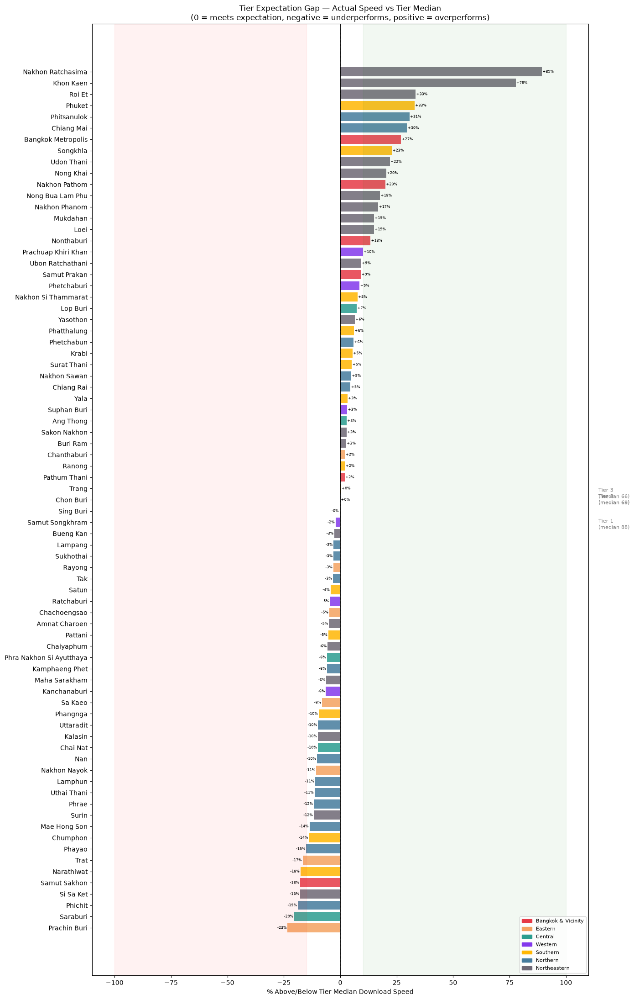

Biggest underperformers vs tier expectation:
        name  internet_tier   mean_dl  tier_expected  tier_residual
Prachin Buri              1 67.761866      88.408258      -0.233535
    Saraburi              1 70.378357      88.408258      -0.203939
     Phichit              3 53.568646      65.976507      -0.188065
   Si Sa Ket              4 55.847982      67.939184      -0.177971
Samut Sakhon              1 72.692908      88.408258      -0.177759
  Narathiwat              4 55.952811      67.939184      -0.176428
        Trat              2 57.878619      69.461963      -0.166758
      Phayao              3 56.021190      65.976507      -0.150892

Biggest overperformers vs tier expectation:
              name  internet_tier    mean_dl  tier_expected  tier_residual
 Nakhon Ratchasima              3 124.913533      65.976507       0.893303
         Khon Kaen              3 117.244816      65.976507       0.777069
            Roi Et              4  90.630140      67.939184       0.33398

In [67]:
# Show each province's % deviation from its tier median
tier_gap = divergent_df[['name','region','internet_tier','mean_dl','tier_expected','tier_residual']].copy()
tier_gap = tier_gap.sort_values('tier_residual')

fig, ax = plt.subplots(figsize=(14, 22))

region_colors = {
    'Bangkok & Vicinity': '#e63946', 'Eastern': '#f4a261',
    'Central': '#2a9d8f', 'Western': '#8338ec',
    'Southern': '#ffb703', 'Northern': '#457b9d', 'Northeastern': '#6d6875',
}

colors = [region_colors.get(r, 'gray') for r in tier_gap['region']]
bars = ax.barh(tier_gap['name'], tier_gap['tier_residual'] * 100, color=colors, alpha=0.85)

# Tier median reference lines
ax.axvline(0, color='black', lw=1.2, label='Tier median (expected)')

# Annotate bars
for bar, val in zip(bars, tier_gap['tier_residual']):
    x = bar.get_width()
    ax.text(x + (0.3 if x >= 0 else -0.3), bar.get_y() + bar.get_height()/2,
            f'{val*100:+.0f}%', va='center', ha='left' if x >= 0 else 'right', fontsize=6)

# Tier grouping lines
tier_boundaries = tier_gap.groupby('internet_tier').apply(lambda g: (g.index.min(), g.index.max()))
for t in sorted(tier_gap['internet_tier'].unique()):
    grp = tier_gap[tier_gap['internet_tier'] == t]
    median = tier_med[t]
    ax.axvline(0, color='black', lw=0.4, ls='--', alpha=0.4)

patches = [mpatches.Patch(color=v, label=k) for k, v in region_colors.items()]
ax.legend(handles=patches, fontsize=8, loc='lower right')
ax.set_xlabel('% Above/Below Tier Median Download Speed')
ax.set_title('Tier Expectation Gap — Actual Speed vs Tier Median\n'
             '(0 = meets expectation, negative = underperforms, positive = overperforms)', fontsize=12)
ax.axvspan(-100, -15, alpha=0.05, color='red', label='Strong underperform')
ax.axvspan(10, 100, alpha=0.05, color='green')

# Annotate Tier brackets on y-axis
for t in sorted(tier_gap['internet_tier'].unique()):
    grp_idx = tier_gap[tier_gap['internet_tier']==t].index
    grp_pos = [list(tier_gap.index).index(i) for i in grp_idx]
    if grp_pos:
        mid = (min(grp_pos) + max(grp_pos)) / 2
        ax.annotate(f'Tier {t}\n(median {tier_med[t]:.0f})', xy=(1.02, mid/len(tier_gap)),
                    xycoords='axes fraction', va='center', fontsize=8, color='gray')

plt.tight_layout()

plt.savefig(f'../../outputs/ookla/mobile/22_tier_expectation_gap.png', dpi=150, bbox_inches='tight')
plt.show()

print("Biggest underperformers vs tier expectation:")
print(tier_gap.nsmallest(8,'tier_residual')[['name','internet_tier','mean_dl','tier_expected','tier_residual']].to_string(index=False))
print()
print("Biggest overperformers vs tier expectation:")
print(tier_gap.nlargest(8,'tier_residual')[['name','internet_tier','mean_dl','tier_expected','tier_residual']].to_string(index=False))


### 19. GDP per Capita vs Download Speed — Who Breaks the Rule?

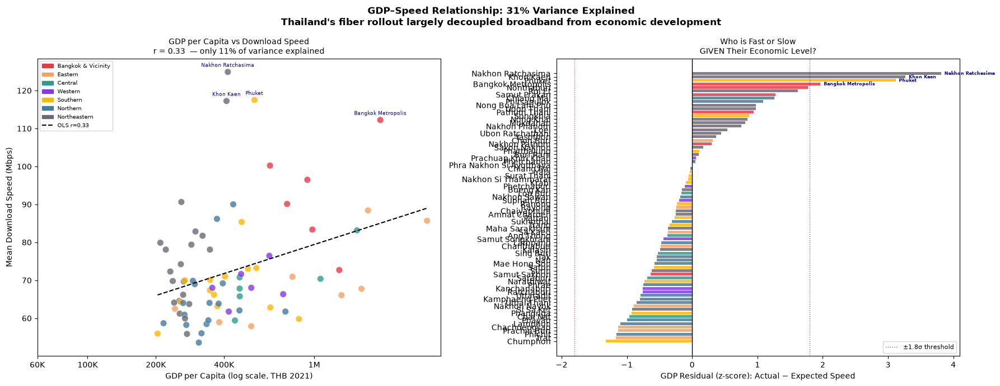

In [68]:
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# ── Left: GDP scatter ──────────────────────────────────────────────────────────
ax = axes[0]
gdp_vals = divergent_df['gdp_per_capita_thb_2021']
colors_scatter = [region_colors.get(r, 'gray') for r in divergent_df['region']]

sc = ax.scatter(np.log(gdp_vals), divergent_df['mean_dl'],
                c=colors_scatter, s=70, alpha=0.8, edgecolors='white', lw=0.4)

# OLS line
x_fit = np.linspace(np.log(gdp_vals.min()), np.log(gdp_vals.max()), 200)
ax.plot(x_fit, int_g + slope_g * x_fit, 'k--', lw=1.5,
        label=f'OLS fit  r={r_g:.2f}')

# Label big residuals
threshold = 1.8
for _, row in divergent_df.iterrows():
    if abs(row['gdp_residual_z']) > threshold:
        ax.annotate(row['name'],
                    (np.log(row['gdp_per_capita_thb_2021']), row['mean_dl']),
                    fontsize=6.5, ha='center', va='bottom',
                    xytext=(0, 5), textcoords='offset points',
                    color='darkred' if row['gdp_residual_z'] < 0 else 'darkblue')

ax.set_xlabel('GDP per Capita (log scale, THB 2021)')
ax.set_ylabel('Mean Download Speed (Mbps)')
ax.set_title(f'GDP per Capita vs Download Speed\nr = {r_g:.2f}  — only {r_g**2*100:.0f}% of variance explained',
             fontsize=10)

# x-tick labels as actual THB values
xticks = np.log([60_000, 100_000, 200_000, 400_000, 1_000_000])
ax.set_xticks(xticks)
ax.set_xticklabels(['60K','100K','200K','400K','1M'])

patches = [mpatches.Patch(color=v, label=k) for k, v in region_colors.items()]
ax.legend(handles=patches + [plt.Line2D([0],[0],color='black',ls='--',label=f'OLS r={r_g:.2f}')],
          fontsize=7)

# ── Right: residual bar chart ──────────────────────────────────────────────────
ax2 = axes[1]
resid_sorted = divergent_df.sort_values('gdp_residual_z')
cols2 = [region_colors.get(r, 'gray') for r in resid_sorted['region']]
bars2 = ax2.barh(resid_sorted['name'], resid_sorted['gdp_residual_z'], color=cols2, alpha=0.85)
ax2.axvline(0, color='black', lw=1)
ax2.axvline(1.8, color='darkblue', ls=':', lw=1, alpha=0.6, label='±1.8σ threshold')
ax2.axvline(-1.8, color='darkred', ls=':', lw=1, alpha=0.6)
ax2.set_xlabel('GDP Residual (z-score): Actual − Expected Speed')
ax2.set_title('Who is Fast or Slow\nGIVEN Their Economic Level?', fontsize=10)
ax2.legend(fontsize=8)
# Add province labels for outliers
for bar, (_, row) in zip(bars2, resid_sorted.iterrows()):
    if abs(row['gdp_residual_z']) > 1.8:
        x = bar.get_width()
        ax2.text(x + (0.05 if x >= 0 else -0.05), bar.get_y() + bar.get_height()/2,
                 row['name'], va='center', ha='left' if x >= 0 else 'right', fontsize=5.5,
                 color='darkblue' if x > 0 else 'darkred', fontweight='bold')

plt.suptitle('GDP–Speed Relationship: 31% Variance Explained\n'
             'Thailand\'s fiber rollout largely decoupled broadband from economic development',
             fontsize=12, fontweight='bold')
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/mobile/23_gdp_residual_bar.png', dpi=150, bbox_inches='tight')
plt.show()


### 20. Population Density vs Speed — Greenfield Fiber Effect

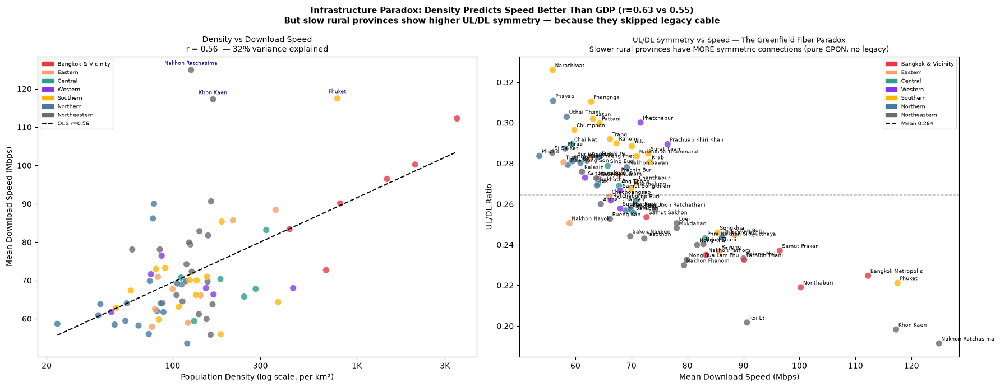

In [69]:
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# ── Left: Density scatter ──────────────────────────────────────────────────────
ax = axes[0]
den_vals = divergent_df['density_per_km2']
colors_s = [region_colors.get(r, 'gray') for r in divergent_df['region']]

ax.scatter(np.log1p(den_vals), divergent_df['mean_dl'],
           c=colors_s, s=70, alpha=0.8, edgecolors='white', lw=0.4)

x_fit2 = np.linspace(np.log1p(den_vals.min()), np.log1p(den_vals.max()), 200)
ax.plot(x_fit2, int_d + slope_d * x_fit2, 'k--', lw=1.5, label=f'OLS r={r_d:.2f}')

for _, row in divergent_df.iterrows():
    if abs(row['den_residual_z']) > 2.0:
        ax.annotate(row['name'],
                    (np.log1p(row['density_per_km2']), row['mean_dl']),
                    fontsize=6.5, ha='center', va='bottom',
                    xytext=(0, 5), textcoords='offset points',
                    color='darkred' if row['den_residual_z'] < 0 else 'darkblue')

xticks_den = np.log1p([20, 100, 300, 1000, 3000])
ax.set_xticks(xticks_den)
ax.set_xticklabels(['20','100','300','1K','3K'])
ax.set_xlabel('Population Density (log scale, per km²)')
ax.set_ylabel('Mean Download Speed (Mbps)')
ax.set_title(f'Density vs Download Speed\nr = {r_d:.2f}  — {r_d**2*100:.0f}% variance explained', fontsize=10)
patches = [mpatches.Patch(color=v, label=k) for k, v in region_colors.items()]
ax.legend(handles=patches + [plt.Line2D([0],[0],color='black',ls='--',label=f'OLS r={r_d:.2f}')],
          fontsize=7)

# ── Right: UL/DL ratio vs DL speed — the "greenfield fiber paradox" ───────────
ax2 = axes[1]
ax2.scatter(divergent_df['mean_dl'], divergent_df['ul_dl_ratio'],
            c=colors_s, s=70, alpha=0.8, edgecolors='white', lw=0.4)

for _, row in divergent_df.iterrows():
    if row['ul_dl_ratio'] > 0.91 or row['ul_dl_ratio'] < 0.80 or row['mean_dl'] < 170:
        ax2.annotate(row['name'], (row['mean_dl'], row['ul_dl_ratio']),
                     fontsize=6.5, ha='left', va='bottom',
                     xytext=(3, 2), textcoords='offset points')

ax2.axhline(divergent_df['ul_dl_ratio'].mean(), color='black', ls='--', lw=1,
            label=f"Mean ratio {divergent_df['ul_dl_ratio'].mean():.3f}")
ax2.set_xlabel('Mean Download Speed (Mbps)')
ax2.set_ylabel('UL/DL Ratio')
ax2.set_title('UL/DL Symmetry vs Speed — The Greenfield Fiber Paradox\n'
              'Slower rural provinces have MORE symmetric connections (pure GPON, no legacy)', fontsize=9)
ax2.legend(handles=patches + [plt.Line2D([0],[0],color='black',ls='--',
           label=f'Mean {divergent_df["ul_dl_ratio"].mean():.3f}')], fontsize=7)

# Add trend arrow annotation
ax2.annotate('← slower but more symmetric\n   (rural greenfield fiber)',
             xy=(155, 0.905), fontsize=7.5, color='#6d6875',
             bbox=dict(boxstyle='round,pad=0.2', fc='lightyellow', alpha=0.8))
ax2.annotate('faster but less symmetric →\n(urban legacy cable mix)',
             xy=(285, 0.800), fontsize=7.5, color='#e63946',
             bbox=dict(boxstyle='round,pad=0.2', fc='lightyellow', alpha=0.8))

plt.suptitle('Infrastructure Paradox: Density Predicts Speed Better Than GDP (r=0.63 vs 0.55)\n'
             'But slow rural provinces show higher UL/DL symmetry — because they skipped legacy cable',
             fontsize=11, fontweight='bold')
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/mobile/24_uldl_greenfield.png', dpi=150, bbox_inches='tight')
plt.show()


### 21. Ookla Coverage — Tests per 1,000 Population

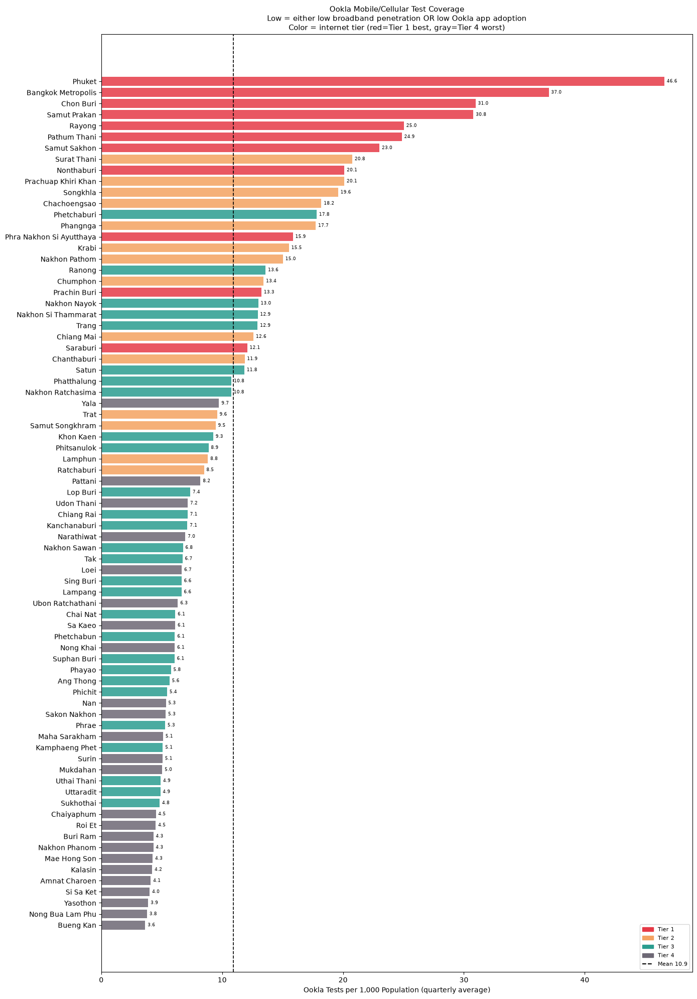

Top coverage (tests per 1000 pop):
              name             region  internet_tier  tests_per_1000_pop    mean_tests  pop_2024
            Phuket           Southern              1           46.584109  20031.166667    430000
Bangkok Metropolis Bangkok & Vicinity              1           37.020192 201982.166667   5456000
         Chon Buri            Eastern              1           30.965515  50659.583333   1636000
      Samut Prakan Bangkok & Vicinity              1           30.789404  42520.166667   1381000
            Rayong            Eastern              1           25.036871  19578.833333    782000
      Pathum Thani Bangkok & Vicinity              1           24.865561  30733.833333   1236000
      Samut Sakhon Bangkok & Vicinity              1           23.014523  13601.583333    591000
       Surat Thani           Southern              2           20.765011  22363.916667   1077000

Bottom coverage:
            name       region  internet_tier  tests_per_1000_pop  mean_tes

In [70]:
# Tests per 1000 pop = proxy for (broadband penetration × Ookla app adoption × tech-savviness)
cov = divergent_df.sort_values('tests_per_1000_pop')
tier_palette = {1:'#e63946', 2:'#f4a261', 3:'#2a9d8f', 4:'#6d6875'}
colors_cov = [tier_palette.get(int(t), 'gray') for t in cov['internet_tier']]

fig, ax = plt.subplots(figsize=(14, 20))
bars = ax.barh(cov['name'], cov['tests_per_1000_pop'], color=colors_cov, alpha=0.85)
ax.axvline(divergent_df['tests_per_1000_pop'].mean(), color='black', ls='--', lw=1.2,
           label=f"National mean {divergent_df['tests_per_1000_pop'].mean():.1f}")

for bar, val in zip(bars, cov['tests_per_1000_pop']):
    ax.text(bar.get_width() + 0.2, bar.get_y() + bar.get_height()/2,
            f'{val:.1f}', va='center', fontsize=6.2)

patches_t = [mpatches.Patch(color=v, label=f'Tier {k}') for k, v in tier_palette.items()]
ax.legend(handles=patches_t + [plt.Line2D([0],[0],color='black',ls='--',
           label=f'Mean {divergent_df["tests_per_1000_pop"].mean():.1f}')], fontsize=8)
ax.set_xlabel('Ookla Tests per 1,000 Population (quarterly average)')
ax.set_title('Ookla Mobile/Cellular Test Coverage\n'
             'Low = either low broadband penetration OR low Ookla app adoption\n'
             'Color = internet tier (red=Tier 1 best, gray=Tier 4 worst)', fontsize=11)
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/mobile/25_test_coverage.png', dpi=150, bbox_inches='tight')
plt.show()

print("Top coverage (tests per 1000 pop):")
print(divergent_df.nlargest(8,'tests_per_1000_pop')[
    ['name','region','internet_tier','tests_per_1000_pop','mean_tests','pop_2024']
].to_string(index=False))
print()
print("Bottom coverage:")
print(divergent_df.nsmallest(10,'tests_per_1000_pop')[
    ['name','region','internet_tier','tests_per_1000_pop','mean_tests','pop_2024']
].to_string(index=False))


### 22. Composite Divergence Leaderboard — Top 20 Anomalous Provinces

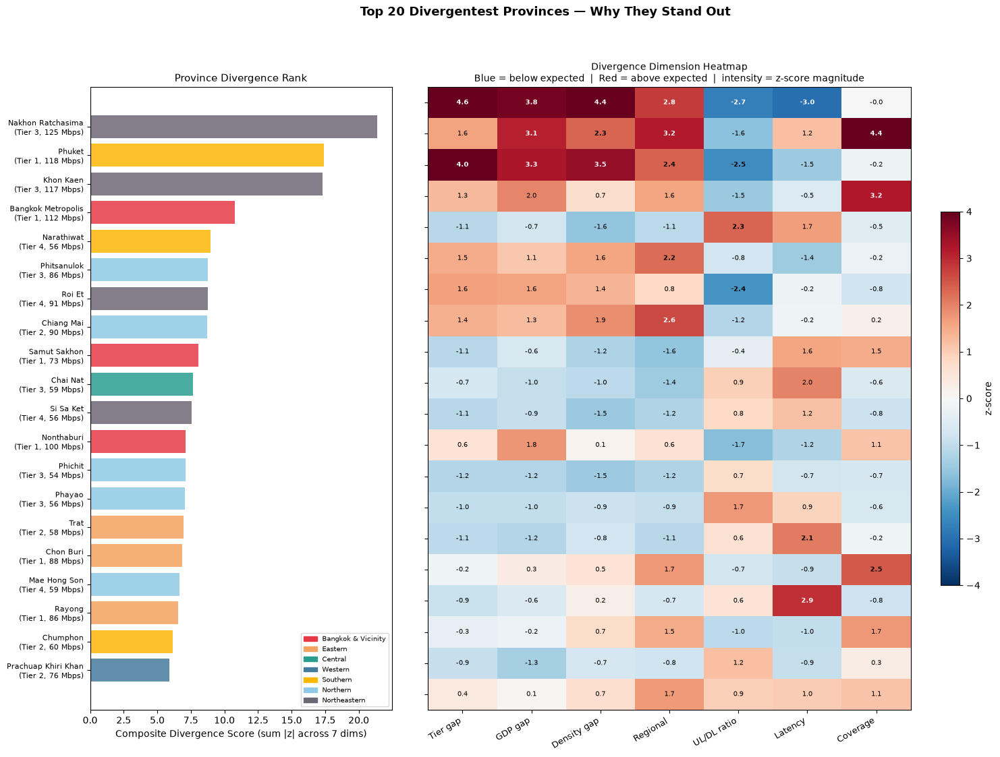


Full leaderboard table:
               name             region  internet_tier    mean_dl  divergence_score     GDP-z     Den-z     Reg-z   Ratio-z     Lat-z     Cov-z
  Nakhon Ratchasima       Northeastern              3 124.913533         21.391730  3.814028  4.374949  2.803462 -2.747180 -3.012389 -0.018182
             Phuket           Southern              1 117.508818         17.427484  3.116176  2.324230  3.181404 -1.628107  1.209221  4.367912
          Khon Kaen       Northeastern              3 117.244816         17.309882  3.268236  3.527834  2.357378 -2.488173 -1.467593 -0.201587
 Bangkok Metropolis Bangkok & Vicinity              1 112.245408         10.765174  1.965179  0.714325  1.569708 -1.492802 -0.544531  3.197019
         Narathiwat           Southern              4  55.952811          8.973569 -0.734302 -1.589611 -1.066809  2.319586  1.672343 -0.483810
        Phitsanulok           Northern              3  86.177188          8.783485  1.083652  1.564403  2.223287 -0.7

In [71]:
TOP_N = 20
dims = ['tier_residual_z','gdp_residual_z','den_residual_z','regional_z',
        'ratio_z','lat_regional_z','coverage_z']
dim_labels = ['Tier gap','GDP gap','Density gap','Regional','UL/DL ratio','Latency','Coverage']

top20 = divergent_df.nlargest(TOP_N, 'divergence_score').copy().reset_index(drop=True)

fig = plt.figure(figsize=(18, 12))
gs  = fig.add_gridspec(1, 2, width_ratios=[1, 2], wspace=0.08)

region_colors = {
    'Bangkok & Vicinity': '#e63946', 'Eastern': '#f4a261',
    'Central': '#2a9d8f', 'Western': '#457b9d',
    'Southern': '#ffb703', 'Northern': '#8ecae6', 'Northeastern': '#6d6875',
}

# ── Left: Composite score bar ──────────────────────────────────────────────────
ax_bar = fig.add_subplot(gs[0])
colors_bar = [region_colors.get(r, 'gray') for r in top20['region']]
y_pos = np.arange(TOP_N)
ax_bar.barh(y_pos, top20['divergence_score'], color=colors_bar, alpha=0.85)
ax_bar.set_yticks(y_pos)
ax_bar.set_yticklabels(
    [f"{row['name']}\n(Tier {int(row['internet_tier'])}, {row['mean_dl']:.0f} Mbps)"
     for _, row in top20.iterrows()],
    fontsize=8
)
ax_bar.set_xlabel('Composite Divergence Score (sum |z| across 7 dims)')
ax_bar.set_title('Province Divergence Rank', fontsize=11)
ax_bar.invert_yaxis()

patches = [mpatches.Patch(color=v, label=k) for k, v in region_colors.items()]
ax_bar.legend(handles=patches, fontsize=7, loc='lower right')

# ── Right: Heatmap of dimension z-scores ──────────────────────────────────────
ax_heat = fig.add_subplot(gs[1])
heat_data = top20[dims].values.astype(float)

im = ax_heat.imshow(heat_data, cmap='RdBu_r', aspect='auto', vmin=-4, vmax=4)
ax_heat.set_xticks(np.arange(len(dim_labels)))
ax_heat.set_xticklabels(dim_labels, rotation=30, ha='right', fontsize=9)
ax_heat.set_yticks(np.arange(TOP_N))
ax_heat.set_yticklabels([''] * TOP_N)

for i in range(TOP_N):
    for j in range(len(dims)):
        val = heat_data[i, j]
        txt_color = 'white' if abs(val) > 2.5 else 'black'
        ax_heat.text(j, i, f'{val:.1f}', ha='center', va='center',
                     fontsize=7, color=txt_color,
                     fontweight='bold' if abs(val) > 2 else 'normal')

ax_heat.set_title(
    'Divergence Dimension Heatmap\n'
    'Blue = below expected  |  Red = above expected  |  intensity = z-score magnitude',
    fontsize=10
)
plt.colorbar(im, ax=ax_heat, label='z-score', shrink=0.6)

plt.suptitle('Top 20 Divergentest Provinces — Why They Stand Out', fontsize=13, fontweight='bold')
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/mobile/26_divergence_top20.png', dpi=150, bbox_inches='tight')
plt.show()

print("\nFull leaderboard table:")
print(top20[['name','region','internet_tier','mean_dl','divergence_score',
             'gdp_residual_z','den_residual_z','regional_z','ratio_z','lat_regional_z','coverage_z']]
      .rename(columns={'gdp_residual_z':'GDP-z','den_residual_z':'Den-z','regional_z':'Reg-z',
                       'ratio_z':'Ratio-z','lat_regional_z':'Lat-z','coverage_z':'Cov-z'})
      .to_string(index=False))


### 23. Province Divergence Map

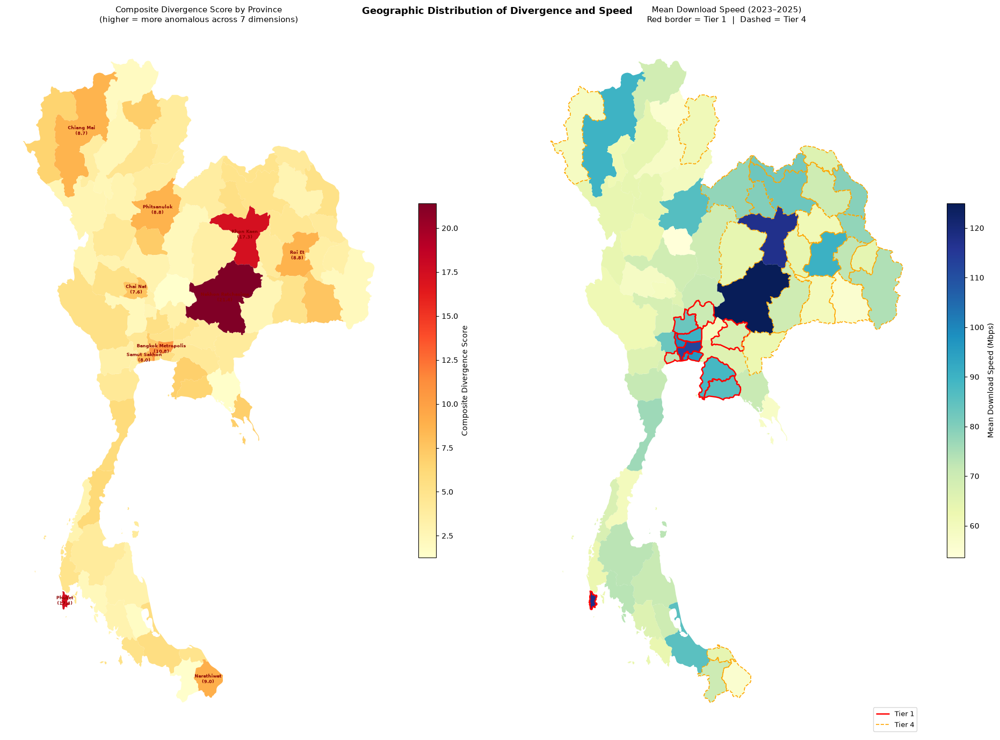

In [72]:
_GEOJSON = '../../data/geo/thailand_provinces.geojson'

# Load GeoDataFrame with correct path (fallback if earlier cells used old path)
try:
    if 'thailand_gdf' not in dir() or thailand_gdf is None:
        raise NameError
    _ = thailand_gdf.shape  # verify it's valid
except (NameError, Exception):
    thailand_gdf = gpd.read_file(_GEOJSON).to_crs(4326)
    print("Loaded thailand_gdf from correct project path")

geo_divergent = thailand_gdf.copy()
geo_divergent = geo_divergent.merge(
    divergent_df[['name','divergence_score','mean_dl','internet_tier']],
    on='name', how='left'
)
geo_divergent['divergence_score'] = geo_divergent['divergence_score'].fillna(0)

fig, axes = plt.subplots(1, 2, figsize=(20, 14))

# ── Left: divergence score choropleth ──────────────────────────────────────────
ax1 = axes[0]
geo_divergent.plot('divergence_score', ax=ax1, cmap='YlOrRd',
               legend=True, missing_kwds={'color':'lightgray'},
               legend_kwds={'label':'Composite Divergence Score','shrink':0.5})

top10_names = divergent_df.nlargest(10, 'divergence_score')['name'].values
for _, row in geo_divergent.iterrows():
    if row['name'] in top10_names:
        c = row.geometry.centroid
        score = row['divergence_score']
        ax1.annotate(f"{row['name']}\n({score:.1f})",
                     (c.x, c.y), ha='center', va='center',
                     fontsize=5.5, color='darkred', fontweight='bold')

ax1.set_title('Composite Divergence Score by Province\n(higher = more anomalous across 7 dimensions)',
              fontsize=11)
ax1.set_axis_off()

# ── Right: download speed choropleth with tier overlay ────────────────────────
ax2 = axes[1]
geo_divergent.plot('mean_dl', ax=ax2, cmap='YlGnBu',
               legend=True, missing_kwds={'color':'lightgray'},
               legend_kwds={'label':'Mean Download Speed (Mbps)','shrink':0.5})

t1 = geo_divergent[geo_divergent['internet_tier'] == 1]
t1.boundary.plot(ax=ax2, color='red', linewidth=1.8, label='Tier 1')
t4 = geo_divergent[geo_divergent['internet_tier'] == 4]
t4.boundary.plot(ax=ax2, color='orange', linewidth=1.2, ls='--', label='Tier 4')

ax2.legend(fontsize=9, loc='lower right')
ax2.set_title('Mean Download Speed (2023–2025)\nRed border = Tier 1  |  Dashed = Tier 4',
              fontsize=11)
ax2.set_axis_off()

plt.suptitle('Geographic Distribution of Divergence and Speed', fontsize=13, fontweight='bold')
plt.tight_layout()

plt.savefig(f'../../outputs/ookla/mobile/27_divergence_map.png', dpi=150, bbox_inches='tight')
plt.show()


### 24. Why Are They Divergent? — Annotated Province Notes

### 25. Full Province Divergence Table — All 77 Provinces


In [73]:
# ── Merge Thai name ────────────────────────────────────────────────────────────
full_table = divergent_df.copy()
full_table = full_table.merge(
    prov_ref[['province_en','province_th']].rename(columns={'province_en':'name'}),
    on='name', how='left'
)

# ── Generate verdict ───────────────────────────────────────────────────────────
_DIM_ORDER = ['regional_z','gdp_residual_z','den_residual_z','tier_residual_z',
              'ratio_z','lat_regional_z','coverage_z']

def _note(d, v, region, tier):
    if d == 'gdp_residual_z':
        return f"fast for GDP (+{v:.1f}σ)" if v > 0 else f"slow for GDP ({v:.1f}σ)"
    if d == 'den_residual_z':
        return f"fast for density (+{v:.1f}σ)" if v > 0 else f"slow for density ({v:.1f}σ)"
    if d == 'tier_residual_z':
        return f"overperforms Tier {tier} (+{v:.1f}σ)" if v > 0 else f"underperforms Tier {tier} ({v:.1f}σ)"
    if d == 'regional_z':
        return f"fast vs {region} (+{v:.1f}σ)" if v > 0 else f"slow vs {region} ({v:.1f}σ)"
    if d == 'ratio_z':
        return f"symmetric UL/DL (+{v:.1f}σ)" if v > 0 else f"asymmetric UL/DL ({v:.1f}σ)"
    if d == 'lat_regional_z':
        return f"high latency (+{v:.1f}σ)" if v > 0 else f"ultra-low latency ({v:.1f}σ)"
    if d == 'coverage_z':
        return f"over-tested (+{v:.1f}σ)" if v > 0 else f"under-tested ({v:.1f}σ)"
    return f"{d}:{v:.1f}σ"

def make_verdict(r):
    region = r['region']
    tier   = int(r['internet_tier'])
    signals = [(abs(r[d]), d, r[d]) for d in _DIM_ORDER if abs(r[d]) >= 1.0]
    signals.sort(reverse=True)
    if not signals:
        return "unremarkable"
    return " | ".join(_note(d, v, region, tier) for _, d, v in signals[:3])

full_table['verdict'] = full_table.apply(make_verdict, axis=1)

# ── Table 0: Overall ranking (top 20) ─────────────────────────────────────────
from IPython.display import display, HTML

display(HTML("<h3>Overall Divergence Ranking — Top 20</h3>"))
t0 = (full_table.nlargest(20, 'divergence_score')
      [['name','province_th','region','internet_tier','mean_dl','divergence_score','verdict']]
      .rename(columns={'name':'Province','province_th':'จังหวัด','region':'Region',
                       'internet_tier':'Tier','mean_dl':'DL Mbps','divergence_score':'Score','verdict':'Why Divergent?'})
      .reset_index(drop=True))
t0.index += 1
tier_palette = {1:'#ffcccc', 2:'#ffe4b5', 3:'#d4f0d4', 4:'#dce0f5'}
styled0 = (t0.style
    .background_gradient(subset=['Score'], cmap='YlOrRd', vmin=0, vmax=20)
    .background_gradient(subset=['DL Mbps'], cmap='YlGn', vmin=110, vmax=330)
    .map(lambda v: f"background-color:{tier_palette.get(int(v),'#fff')}", subset=['Tier'])
    .set_properties(**{'font-size':'11px','text-align':'left'})
    .set_properties(subset=['Why Divergent?'], **{'min-width':'320px','font-size':'10px'})
    .set_table_styles([
        {'selector':'th','props':[('background','#f0f0f0'),('font-size','10px'),('padding','4px 6px')]},
        {'selector':'td','props':[('padding','3px 6px'),('border','1px solid #ddd')]},
    ]))
display(styled0)

# ── Tables 1-7: Per-dimension top 8 over / bottom 8 under ─────────────────────
dim_meta = {
    'regional_z':      ('Regional Speed', 'fast vs region peers', 'slow vs region peers'),
    'gdp_residual_z':  ('GDP Gap', 'fast for GDP level', 'slow for GDP level'),
    'den_residual_z':  ('Density Gap', 'fast for density', 'slow for density'),
    'tier_residual_z': ('Tier Gap', 'overperforms tier', 'underperforms tier'),
    'ratio_z':         ('UL/DL Ratio', 'symmetric (fiber)', 'asymmetric (legacy)'),
    'lat_regional_z':  ('Latency (regional)', 'high latency', 'ultra-low latency'),
    'coverage_z':      ('Test Coverage', 'over-tested', 'under-tested'),
}

base_cols = ['name','province_th','region','internet_tier','mean_dl']

for dim, (title, over_label, under_label) in dim_meta.items():
    display(HTML(f"<h3>Dimension: {title} <small style='color:#888'>({dim})</small></h3>"))
    
    sub = full_table[base_cols + [dim, 'divergence_score']].copy()
    sub = sub.rename(columns={
        'name':'Province','province_th':'จังหวัด','region':'Region',
        'internet_tier':'Tier','mean_dl':'DL Mbps',
        dim:'z-score','divergence_score':'Total Score'
    })
    
    over  = sub.nlargest(8, 'z-score').copy()
    under = sub.nsmallest(8, 'z-score').copy()
    over['signal']  = over_label
    under['signal'] = under_label
    
    combined = pd.concat([over, under], ignore_index=True)
    combined = combined[['Province','จังหวัด','Region','Tier','DL Mbps','z-score','signal','Total Score']]
    combined['z-score'] = combined['z-score'].round(2)
    combined['DL Mbps'] = combined['DL Mbps'].round(1)
    combined['Total Score'] = combined['Total Score'].round(2)
    
    styled_dim = (combined.style
        .background_gradient(subset=['z-score'], cmap='RdBu_r', vmin=-4, vmax=4)
        .background_gradient(subset=['DL Mbps'], cmap='YlGn', vmin=110, vmax=330)
        .map(lambda v: f"background-color:{tier_palette.get(int(v),'#fff')}", subset=['Tier'])
        .set_properties(**{'font-size':'11px','text-align':'left'})
        .set_table_styles([
            {'selector':'th','props':[('background','#f0f0f0'),('font-size','10px'),('padding','4px 6px')]},
            {'selector':'td','props':[('padding','3px 6px'),('border','1px solid #ddd')]},
        ])
        .hide(axis='index'))
    display(styled_dim)
    display(HTML("<hr style='margin:16px 0'>"))

print(f"Provinces: {len(full_table)}")
print(f"Score range: {full_table['divergence_score'].min():.2f} – {full_table['divergence_score'].max():.2f}")
print(f"|z|>2 in any dim: {(full_table[[*_DIM_ORDER]].abs() >= 2).any(axis=1).sum()}")
print(f"|z|>3 in any dim: {(full_table[[*_DIM_ORDER]].abs() >= 3).any(axis=1).sum()}")
print(f"Unremarkable: {(full_table[[*_DIM_ORDER]].abs() < 1.0).all(axis=1).sum()}")

# Save styled table as HTML
_html_path = '../../outputs/ookla/mobile/28_divergence_table.html'
with open(_html_path, 'w') as _f:
    _f.write(styled0.to_html())
print(f"Saved: {_html_path}")


,Province,จังหวัด,Region,Tier,DL Mbps,Score,Why Divergent?
1,Nakhon Ratchasima,นครราชสีมา,Northeastern,3,124.913533,21.391730,overperforms Tier 3 (+4.6σ) | fast for density (+4.4σ) | fast for GDP (+3.8σ)
2,Phuket,ภูเก็ต,Southern,1,117.508818,17.427484,over-tested (+4.4σ) | fast vs Southern (+3.2σ) | fast for GDP (+3.1σ)
3,Khon Kaen,ขอนแก่น,Northeastern,3,117.244816,17.309882,overperforms Tier 3 (+4.0σ) | fast for density (+3.5σ) | fast for GDP (+3.3σ)
4,Bangkok Metropolis,กรุงเทพมหานคร,Bangkok & Vicinity,1,112.245408,10.765174,over-tested (+3.2σ) | fast for GDP (+2.0σ) | fast vs Bangkok & Vicinity (+1.6σ)
5,Narathiwat,นราธิวาส,Southern,4,55.952811,8.973569,symmetric UL/DL (+2.3σ) | high latency (+1.7σ) | slow for density (-1.6σ)
6,Phitsanulok,พิษณุโลก,Northern,3,86.177188,8.783485,fast vs Northern (+2.2σ) | fast for density (+1.6σ) | overperforms Tier 3 (+1.5σ)
7,Roi Et,ร้อยเอ็ด,Northeastern,4,90.630140,8.765462,asymmetric UL/DL (-2.4σ) | overperforms Tier 4 (+1.6σ) | fast for GDP (+1.6σ)
8,Chiang Mai,เชียงใหม่,Northern,2,90.014002,8.714615,fast vs Northern (+2.6σ) | fast for density (+1.9σ) | overperforms Tier 2 (+1.4σ)
9,Samut Sakhon,สมุทรสาคร,Bangkok & Vicinity,1,72.692908,8.049543,high latency (+1.6σ) | slow vs Bangkok & Vicinity (-1.6σ) | over-tested (+1.5σ)
10,Chai Nat,ชัยนาท,Central,3,59.393859,7.637265,high latency (+2.0σ) | slow vs Central (-1.4σ) | slow for density (-1.0σ)


Province,จังหวัด,Region,Tier,DL Mbps,z-score,signal,Total Score
Phuket,ภูเก็ต,Southern,1,117.500000,3.180000,fast vs region peers,17.430000
Nakhon Ratchasima,นครราชสีมา,Northeastern,3,124.900000,2.800000,fast vs region peers,21.390000
Chiang Mai,เชียงใหม่,Northern,2,90.000000,2.630000,fast vs region peers,8.710000
Khon Kaen,ขอนแก่น,Northeastern,3,117.200000,2.360000,fast vs region peers,17.310000
Phitsanulok,พิษณุโลก,Northern,3,86.200000,2.220000,fast vs region peers,8.780000
Phra Nakhon Si Ayutthaya,พระนครศรีอยุธยา,Central,1,83.200000,1.900000,fast vs region peers,5.360000
Chon Buri,ชลบุรี,Eastern,1,88.400000,1.730000,fast vs region peers,6.880000
Prachuap Khiri Khan,ประจวบคีรีขันธ์,Western,2,76.400000,1.710000,fast vs region peers,5.920000
Samut Sakhon,สมุทรสาคร,Bangkok & Vicinity,1,72.700000,-1.580000,slow vs region peers,8.050000
Kanchanaburi,กาญจนบุรี,Western,3,61.700000,-1.530000,slow vs region peers,5.340000


Province,จังหวัด,Region,Tier,DL Mbps,z-score,signal,Total Score
Nakhon Ratchasima,นครราชสีมา,Northeastern,3,124.900000,3.810000,fast for GDP level,21.390000
Khon Kaen,ขอนแก่น,Northeastern,3,117.200000,3.270000,fast for GDP level,17.310000
Phuket,ภูเก็ต,Southern,1,117.500000,3.120000,fast for GDP level,17.430000
Bangkok Metropolis,กรุงเทพมหานคร,Bangkok & Vicinity,1,112.200000,1.970000,fast for GDP level,10.770000
Nonthaburi,นนทบุรี,Bangkok & Vicinity,1,100.200000,1.770000,fast for GDP level,7.110000
Roi Et,ร้อยเอ็ด,Northeastern,4,90.600000,1.620000,fast for GDP level,8.770000
Samut Prakan,สมุทรปราการ,Bangkok & Vicinity,1,96.500000,1.270000,fast for GDP level,5.630000
Chiang Mai,เชียงใหม่,Northern,2,90.000000,1.260000,fast for GDP level,8.710000
Chumphon,ชุมพร,Southern,2,59.800000,-1.320000,slow for GDP level,6.160000
Trat,ตราด,Eastern,2,57.900000,-1.170000,slow for GDP level,6.940000


Province,จังหวัด,Region,Tier,DL Mbps,z-score,signal,Total Score
Nakhon Ratchasima,นครราชสีมา,Northeastern,3,124.900000,4.370000,fast for density,21.390000
Khon Kaen,ขอนแก่น,Northeastern,3,117.200000,3.530000,fast for density,17.310000
Phuket,ภูเก็ต,Southern,1,117.500000,2.320000,fast for density,17.430000
Chiang Mai,เชียงใหม่,Northern,2,90.000000,1.870000,fast for density,8.710000
Phitsanulok,พิษณุโลก,Northern,3,86.200000,1.560000,fast for density,8.780000
Roi Et,ร้อยเอ็ด,Northeastern,4,90.600000,1.360000,fast for density,8.770000
Loei,เลย,Northeastern,4,78.100000,1.100000,fast for density,3.710000
Udon Thani,อุดรธานี,Northeastern,4,82.900000,0.830000,fast for density,5.020000
Narathiwat,นราธิวาส,Southern,4,56.000000,-1.590000,slow for density,8.970000
Si Sa Ket,ศรีสะเกษ,Northeastern,4,55.800000,-1.500000,slow for density,7.560000


Province,จังหวัด,Region,Tier,DL Mbps,z-score,signal,Total Score
Nakhon Ratchasima,นครราชสีมา,Northeastern,3,124.900000,4.620000,overperforms tier,21.390000
Khon Kaen,ขอนแก่น,Northeastern,3,117.200000,4.000000,overperforms tier,17.310000
Roi Et,ร้อยเอ็ด,Northeastern,4,90.600000,1.630000,overperforms tier,8.770000
Phuket,ภูเก็ต,Southern,1,117.500000,1.600000,overperforms tier,17.430000
Phitsanulok,พิษณุโลก,Northern,3,86.200000,1.480000,overperforms tier,8.780000
Chiang Mai,เชียงใหม่,Northern,2,90.000000,1.420000,overperforms tier,8.710000
Bangkok Metropolis,กรุงเทพมหานคร,Bangkok & Vicinity,1,112.200000,1.280000,overperforms tier,10.770000
Songkhla,สงขลา,Southern,2,85.400000,1.060000,overperforms tier,5.640000
Prachin Buri,ปราจีนบุรี,Eastern,1,67.800000,-1.410000,underperforms tier,3.880000
Saraburi,สระบุรี,Central,1,70.400000,-1.250000,underperforms tier,3.280000


Province,จังหวัด,Region,Tier,DL Mbps,z-score,signal,Total Score
Narathiwat,นราธิวาส,Southern,4,56.000000,2.320000,symmetric (fiber),8.970000
Phayao,พะเยา,Northern,3,56.000000,1.750000,symmetric (fiber),7.050000
Phangnga,พังงา,Southern,2,62.800000,1.730000,symmetric (fiber),5.030000
Uthai Thani,อุทัยธานี,Northern,3,58.500000,1.450000,symmetric (fiber),5.250000
Satun,สตูล,Southern,3,63.100000,1.410000,symmetric (fiber),5.140000
Phetchaburi,เพชรบุรี,Western,3,71.600000,1.340000,symmetric (fiber),4.370000
Pattani,ปัตตานี,Southern,4,64.300000,1.330000,symmetric (fiber),4.890000
Chumphon,ชุมพร,Southern,2,59.800000,1.210000,symmetric (fiber),6.160000
Nakhon Ratchasima,นครราชสีมา,Northeastern,3,124.900000,-2.750000,asymmetric (legacy),21.390000
Khon Kaen,ขอนแก่น,Northeastern,3,117.200000,-2.490000,asymmetric (legacy),17.310000


Province,จังหวัด,Region,Tier,DL Mbps,z-score,signal,Total Score
Mae Hong Son,แม่ฮ่องสอน,Northern,4,58.700000,2.920000,high latency,6.670000
Trat,ตราด,Eastern,2,57.900000,2.090000,high latency,6.940000
Chai Nat,ชัยนาท,Central,3,59.400000,1.990000,high latency,7.640000
Kanchanaburi,กาญจนบุรี,Western,3,61.700000,1.730000,high latency,5.340000
Narathiwat,นราธิวาส,Southern,4,56.000000,1.670000,high latency,8.970000
Samut Sakhon,สมุทรสาคร,Bangkok & Vicinity,1,72.700000,1.580000,high latency,8.050000
Satun,สตูล,Southern,3,63.100000,1.480000,high latency,5.140000
Bueng Kan,บึงกาฬ,Northeastern,4,66.200000,1.400000,high latency,4.110000
Nakhon Ratchasima,นครราชสีมา,Northeastern,3,124.900000,-3.010000,ultra-low latency,21.390000
Nakhon Si Thammarat,นครศรีธรรมราช,Southern,3,71.000000,-1.560000,ultra-low latency,3.080000


Province,จังหวัด,Region,Tier,DL Mbps,z-score,signal,Total Score
Phuket,ภูเก็ต,Southern,1,117.500000,4.370000,over-tested,17.430000
Bangkok Metropolis,กรุงเทพมหานคร,Bangkok & Vicinity,1,112.200000,3.200000,over-tested,10.770000
Chon Buri,ชลบุรี,Eastern,1,88.400000,2.460000,over-tested,6.880000
Samut Prakan,สมุทรปราการ,Bangkok & Vicinity,1,96.500000,2.430000,over-tested,5.630000
Rayong,ระยอง,Eastern,1,85.700000,1.730000,over-tested,6.540000
Pathum Thani,ปทุมธานี,Bangkok & Vicinity,1,90.100000,1.710000,over-tested,5.060000
Samut Sakhon,สมุทรสาคร,Bangkok & Vicinity,1,72.700000,1.480000,over-tested,8.050000
Surat Thani,สุราษฎร์ธานี,Southern,2,73.000000,1.210000,over-tested,4.060000
Bueng Kan,บึงกาฬ,Northeastern,4,66.200000,-0.890000,under-tested,4.110000
Nong Bua Lam Phu,หนองบัวลำภู,Northeastern,4,79.900000,-0.870000,under-tested,5.380000


Provinces: 77
Score range: 1.26 – 21.39
|z|>2 in any dim: 12
|z|>3 in any dim: 4
Unremarkable: 27
Saved: ../../outputs/ookla/mobile/28_divergence_table.html


## Export for Comparison Notebook
*Saves province × quarter data to CSV.*

In [74]:
# ── Export Ookla Mobile quarterly province data for comparison notebook ──
import os
os.makedirs("../../data/exports", exist_ok=True)

EXPORT_COLS = [
    "name", "label", "year", "quarter",
    "avg_d_mbps", "avg_u_mbps", "avg_lat_ms_wt",
    "total_tests", "n_tiles", "is_reliable",
    "region", "internet_tier", "pop_2024",
    "gdp_per_capita_thb_2021", "density_per_km2",
]
existing_cols = [c for c in EXPORT_COLS if c in master.columns]
out = master[existing_cols].copy()
out = out.rename(columns={"name": "province", "label": "quarter"})

PATH = "../../data/exports/ookla_mobile_province_quarterly.csv"
out.to_csv(PATH, index=False)
print(f"Exported {len(out)} rows → {PATH}")
print(out.head(3).to_string())


Exported 924 rows → ../../data/exports/ookla_mobile_province_quarterly.csv
             province  quarter  year  quarter  avg_d_mbps  avg_u_mbps  avg_lat_ms_wt  total_tests  n_tiles  is_reliable              region  internet_tier  pop_2024  gdp_per_capita_thb_2021  density_per_km2
0       Amnat Charoen  2023-Q1  2023        1   50.505790   13.652506      34.990550       1799.0    406.0         True        Northeastern              4    372000                253897.82              113
1           Ang Thong  2023-Q1  2023        1   59.417319   16.954608      29.932203       1770.0    420.0         True             Central              3    269000                468881.20              283
2  Bangkok Metropolis  2023-Q1  2023        1   98.819339   24.893120      22.848774     237294.0   3642.0         True  Bangkok & Vicinity              1   5456000               1957179.52             3488
